In [1]:
import warnings 
warnings.filterwarnings('ignore')

## Import Esential Library

In [2]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()
from sklearn.linear_model import LinearRegression

## Import Covid Data

In [3]:
## URL: https://ourworldindata.org/coronavirus
covid = 'owid-covid-data.csv'
covid_df = pd.read_csv(covid)
covid_df.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-08,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-09,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN


## Check datatypes and info

In [4]:
#Check Shape
covid_df.shape

#Check datatypes
covid_df.dtypes
covid_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378614 entries, 0 to 378613
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    378614 non-null  object 
 1   continent                                   360506 non-null  object 
 2   location                                    378614 non-null  object 
 3   date                                        378614 non-null  object 
 4   total_cases                                 339793 non-null  float64
 5   new_cases                                   367810 non-null  float64
 6   new_cases_smoothed                          366580 non-null  float64
 7   total_deaths                                317779 non-null  float64
 8   new_deaths                                  367817 non-null  float64
 9   new_deaths_smoothed                         366587 non-null  float64
 

## Convert `date` to `year`, `month`, `day` and `day category`

In [5]:
covid_df_date = pd.to_datetime(covid_df['date'])
# Convert dates into year categories from 2020 to 2024
covid_df['year'] = pd.cut(covid_df_date.dt.year, bins=[2019, 2020, 2021, 2022, 2023, 2024], labels=['2020', '2021', '2022', '2023', '2024'])

# Convert dates into month categories
covid_df['month'] = covid_df_date.dt.month_name()

# Convert dates into day categories
start_date = pd.Timestamp('2020-01-05')
covid_df['day'] = (covid_df_date - start_date).dt.days + 1

# Assuming 'day' is the column containing the day numbers
covid_df['day'] = pd.to_numeric(covid_df['day'], errors='coerce')
covid_df['day_category'] = np.ceil(covid_df['day'] / 100).astype(int)
# Display the new 'day_category' column
print(covid_df['day_category'])
covid_df['day_category'] = covid_df['day_category'].astype('category')
covid_df['day_category'].describe()

covid_df

0          1
1          1
2          1
3          1
4          1
          ..
378609    15
378610    15
378611    15
378612    15
378613    15
Name: day_category, Length: 378614, dtype: int32


,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,year,month,day,day_category
0,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,0.511,41128772.0,NaN,NaN,NaN,NaN,2020,January,1,1
1,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,0.511,41128772.0,NaN,NaN,NaN,NaN,2020,January,2,1
2,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,0.511,41128772.0,NaN,NaN,NaN,NaN,2020,January,3,1
3,AFG,Asia,Afghanistan,2020-01-08,NaN,0.0,NaN,NaN,0.0,NaN,...,0.511,41128772.0,NaN,NaN,NaN,NaN,2020,January,4,1
4,AFG,Asia,Afghanistan,2020-01-09,NaN,0.0,NaN,NaN,0.0,NaN,...,0.511,41128772.0,NaN,NaN,NaN,NaN,2020,January,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378609,ZWE,Africa,Zimbabwe,2024-02-07,266319.0,0.0,4.429,5737.0,0.0,0.0,...,0.571,16320539.0,NaN,NaN,NaN,NaN,2024,February,1495,15
378610,ZWE,Africa,Zimbabwe,2024-02-08,266319.0,0.0,4.429,5737.0,0.0,0.0,...,0.571,16320539.0,NaN,NaN,NaN,NaN,2024,February,1496,15
378611,ZWE,Africa,Zimbabwe,2024-02-09,266319.0,0.0,4.429,5737.0,0.0,0.0,...,0.571,16320539.0,NaN,NaN,NaN,NaN,2024,February,1497,15
378612,ZWE,Africa,Zimbabwe,2024-02-10,266319.0,0.0,4.429,5737.0,0.0,0.0,...,0.571,16320539.0,NaN,NaN,NaN,NaN,2024,February,1498,15


## open two more columns: `days from infection` and `days from vaccination` 

Check for interested vaccination, cases and deaths data for further investigation

In [6]:
vaccinated_data = covid_df.iloc[:, 35:48]  # Extract columns 35 to 47
total_cases = covid_df['total_cases']
date_location = covid_df[['year', 'month', 'date','day_category','day','location']]  # Extract columns 'year', 'month', 'date','location'

# Concatenate vaccinated_data with date along the columns axis (axis=1)
vaccinated_data_date = pd.concat([total_cases, vaccinated_data, date_location], axis=1)

# Convert to category
vaccinated_data_date[['location', 'year', 'month', 'date','day']] = vaccinated_data_date[['location', 'year', 'month', 'date','day']].astype('category')

# Convert 'date' column to datetime type
vaccinated_data_date['date'] = pd.to_datetime(vaccinated_data_date['date'])

# Group data by 'location' (country)
grouped_data = vaccinated_data_date.groupby('location')

# Initialize an empty list to store the DataFrames for each country
infect_vaccine_final = []

# Iterate over each group (country)
for country, group_data in grouped_data:
    # Find the first non-null value in 'people_vaccinated' column
    first_vaccination_date = group_data['date'].where(group_data['people_vaccinated'].notnull()).min()

    # Calculate the number of days from the first vaccination
    group_data['days_from_first_vaccination'] = (group_data['date'] - first_vaccination_date).dt.days

    # Find the first non-null value in 'total_cases' column
    first_infection_date = group_data['date'].where(group_data['total_cases'].notnull()).min()

    # Calculate the number of days from the first infection
    group_data['days_from_first_infection'] = (group_data['date'] - first_infection_date).dt.days

    # Append the results to the list
    infect_vaccine_final.append(group_data)

# Concatenate all DataFrames in the list into a single DataFrame
infect_vaccine_final_df = pd.concat(infect_vaccine_final)

# Display the final DataFrame
display(infect_vaccine_final_df)

        





,total_cases,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,...,new_people_vaccinated_smoothed_per_hundred,stringency_index,year,month,date,day_category,day,location,days_from_first_vaccination,days_from_first_infection
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,2020,January,2020-01-05,1,1,Afghanistan,-414.0,-56.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,2020,January,2020-01-06,1,2,Afghanistan,-413.0,-55.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,2020,January,2020-01-07,1,3,Afghanistan,-412.0,-54.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,2020,January,2020-01-08,1,4,Afghanistan,-411.0,-53.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,2020,January,2020-01-09,1,5,Afghanistan,-410.0,-52.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378609,266319.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,2024,February,2024-02-07,15,1495,Zimbabwe,1084.0,1417.0
378610,266319.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,2024,February,2024-02-08,15,1496,Zimbabwe,1085.0,1418.0
378611,266319.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,2024,February,2024-02-09,15,1497,Zimbabwe,1086.0,1419.0
378612,266319.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,2024,February,2024-02-10,15,1498,Zimbabwe,1087.0,1420.0


In [7]:
temp = infect_vaccine_final_df[['total_cases', 'people_vaccinated', 'year', 'month','day','day_category', 'date', 'location', 'days_from_first_infection', 'days_from_first_vaccination']]
rapid_change = covid_df[['new_cases_per_million', 'new_deaths_per_million','new_cases','new_cases_smoothed','new_vaccinations','new_vaccinations_smoothed','new_deaths','new_deaths_smoothed','people_fully_vaccinated','total_deaths','total_boosters']]

new_df = pd.concat([temp, rapid_change], axis = 1)
display(new_df)

,total_cases,people_vaccinated,year,month,day,day_category,date,location,days_from_first_infection,days_from_first_vaccination,...,new_deaths_per_million,new_cases,new_cases_smoothed,new_vaccinations,new_vaccinations_smoothed,new_deaths,new_deaths_smoothed,people_fully_vaccinated,total_deaths,total_boosters
0,NaN,NaN,2020,January,1,1,2020-01-05,Afghanistan,-56.0,-414.0,...,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
1,NaN,NaN,2020,January,2,1,2020-01-06,Afghanistan,-55.0,-413.0,...,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
2,NaN,NaN,2020,January,3,1,2020-01-07,Afghanistan,-54.0,-412.0,...,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
3,NaN,NaN,2020,January,4,1,2020-01-08,Afghanistan,-53.0,-411.0,...,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
4,NaN,NaN,2020,January,5,1,2020-01-09,Afghanistan,-52.0,-410.0,...,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378609,266319.0,NaN,2024,February,1495,15,2024-02-07,Zimbabwe,1417.0,1084.0,...,0.0,0.0,4.429,NaN,NaN,0.0,0.0,NaN,5737.0,NaN
378610,266319.0,NaN,2024,February,1496,15,2024-02-08,Zimbabwe,1418.0,1085.0,...,0.0,0.0,4.429,NaN,NaN,0.0,0.0,NaN,5737.0,NaN
378611,266319.0,NaN,2024,February,1497,15,2024-02-09,Zimbabwe,1419.0,1086.0,...,0.0,0.0,4.429,NaN,NaN,0.0,0.0,NaN,5737.0,NaN
378612,266319.0,NaN,2024,February,1498,15,2024-02-10,Zimbabwe,1420.0,1087.0,...,0.0,0.0,4.429,NaN,NaN,0.0,0.0,NaN,5737.0,NaN


---

## Open New Column: `new_boosters` and `new_people_fully_vaccinated`

rational: since there is no column accouting for change of `people fully vaccinated` and `boosters administered` on **daily basis**. Creating by calculating difference between subsequent column of total respective numbers

In [8]:
# Assuming new_df is your DataFrame containing the new columns 'new_boosters' and 'new_people_fully_vaccinated'
new_df[['new_boosters','new_people_fully_vaccinated']] = np.nan  # Initialize new columns with NaN

# Calculate new values only when the corresponding total values are not NaN
mask_total = new_df['total_boosters'].notna()
mask_people = new_df['people_fully_vaccinated'].notna()

new_df.loc[mask_total, 'new_boosters'] = new_df.loc[mask_total, 'total_boosters'].diff()
new_df.loc[mask_people, 'new_people_fully_vaccinated'] = new_df.loc[mask_people, 'people_fully_vaccinated'].diff()

# Display the DataFrame with the new columns
new_df


,total_cases,people_vaccinated,year,month,day,day_category,date,location,days_from_first_infection,days_from_first_vaccination,...,new_cases_smoothed,new_vaccinations,new_vaccinations_smoothed,new_deaths,new_deaths_smoothed,people_fully_vaccinated,total_deaths,total_boosters,new_boosters,new_people_fully_vaccinated
0,NaN,NaN,2020,January,1,1,2020-01-05,Afghanistan,-56.0,-414.0,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,2020,January,2,1,2020-01-06,Afghanistan,-55.0,-413.0,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,2020,January,3,1,2020-01-07,Afghanistan,-54.0,-412.0,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,2020,January,4,1,2020-01-08,Afghanistan,-53.0,-411.0,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,2020,January,5,1,2020-01-09,Afghanistan,-52.0,-410.0,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378609,266319.0,NaN,2024,February,1495,15,2024-02-07,Zimbabwe,1417.0,1084.0,...,4.429,NaN,NaN,0.0,0.0,NaN,5737.0,NaN,NaN,NaN
378610,266319.0,NaN,2024,February,1496,15,2024-02-08,Zimbabwe,1418.0,1085.0,...,4.429,NaN,NaN,0.0,0.0,NaN,5737.0,NaN,NaN,NaN
378611,266319.0,NaN,2024,February,1497,15,2024-02-09,Zimbabwe,1419.0,1086.0,...,4.429,NaN,NaN,0.0,0.0,NaN,5737.0,NaN,NaN,NaN
378612,266319.0,NaN,2024,February,1498,15,2024-02-10,Zimbabwe,1420.0,1087.0,...,4.429,NaN,NaN,0.0,0.0,NaN,5737.0,NaN,NaN,NaN


## World Data

In [9]:
# Define the list of continents and regions
continents = ['Asia', 'Europe', 'Africa', 'European Union', 'High income', 'Low income', 'Lower middle income', 'North America', 'South America', 'Oceania', 'Upper middle income', 'World']

# Filter the DataFrame to include only rows where the 'location' is in the list of continents
Continent = new_df[new_df['location'].isin(continents)]

# Display the 'Continent' DataFrame
display(Continent)
WorldData = Continent[Continent['location'] == 'World']
WorldData

,total_cases,people_vaccinated,year,month,day,day_category,date,location,days_from_first_infection,days_from_first_vaccination,...,new_cases_smoothed,new_vaccinations,new_vaccinations_smoothed,new_deaths,new_deaths_smoothed,people_fully_vaccinated,total_deaths,total_boosters,new_boosters,new_people_fully_vaccinated
1499,NaN,NaN,2020,January,1,1,2020-01-05,Africa,-42.0,-370.0,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1500,NaN,NaN,2020,January,2,1,2020-01-06,Africa,-41.0,-369.0,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1501,NaN,NaN,2020,January,3,1,2020-01-07,Africa,-40.0,-368.0,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1502,NaN,NaN,2020,January,4,1,2020-01-08,Africa,-39.0,-367.0,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1503,NaN,NaN,2020,January,5,1,2020-01-09,Africa,-38.0,-366.0,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374112,NaN,5.630398e+09,2024,February,1510,16,2024-02-22,World,1509.0,1177.0,...,NaN,NaN,NaN,NaN,NaN,5.176858e+09,NaN,2.813228e+09,1765.0,62.0
374113,NaN,5.630399e+09,2024,February,1511,16,2024-02-23,World,1510.0,1178.0,...,NaN,NaN,NaN,NaN,NaN,5.176859e+09,NaN,2.813229e+09,1210.0,118.0
374114,NaN,5.630400e+09,2024,February,1512,16,2024-02-24,World,1511.0,1179.0,...,NaN,NaN,NaN,NaN,NaN,5.176859e+09,NaN,2.813230e+09,294.0,14.0
374115,NaN,5.630400e+09,2024,February,1513,16,2024-02-25,World,1512.0,1180.0,...,NaN,NaN,NaN,NaN,NaN,5.176859e+09,NaN,2.813230e+09,481.0,2.0


,total_cases,people_vaccinated,year,month,day,day_category,date,location,days_from_first_infection,days_from_first_vaccination,...,new_cases_smoothed,new_vaccinations,new_vaccinations_smoothed,new_deaths,new_deaths_smoothed,people_fully_vaccinated,total_deaths,total_boosters,new_boosters,new_people_fully_vaccinated
372603,2.0,NaN,2020,January,1,1,2020-01-05,World,0.0,-332.0,...,NaN,NaN,NaN,3.0,NaN,NaN,3.0,NaN,NaN,NaN
372604,2.0,NaN,2020,January,2,1,2020-01-06,World,1.0,-331.0,...,NaN,NaN,NaN,0.0,NaN,NaN,3.0,NaN,NaN,NaN
372605,2.0,NaN,2020,January,3,1,2020-01-07,World,2.0,-330.0,...,NaN,NaN,NaN,0.0,NaN,NaN,3.0,NaN,NaN,NaN
372606,2.0,NaN,2020,January,4,1,2020-01-08,World,3.0,-329.0,...,NaN,NaN,NaN,0.0,NaN,NaN,3.0,NaN,NaN,NaN
372607,2.0,NaN,2020,January,5,1,2020-01-09,World,4.0,-328.0,...,NaN,NaN,NaN,0.0,NaN,NaN,3.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374112,NaN,5.630398e+09,2024,February,1510,16,2024-02-22,World,1509.0,1177.0,...,NaN,NaN,NaN,NaN,NaN,5.176858e+09,NaN,2.813228e+09,1765.0,62.0
374113,NaN,5.630399e+09,2024,February,1511,16,2024-02-23,World,1510.0,1178.0,...,NaN,NaN,NaN,NaN,NaN,5.176859e+09,NaN,2.813229e+09,1210.0,118.0
374114,NaN,5.630400e+09,2024,February,1512,16,2024-02-24,World,1511.0,1179.0,...,NaN,NaN,NaN,NaN,NaN,5.176859e+09,NaN,2.813230e+09,294.0,14.0
374115,NaN,5.630400e+09,2024,February,1513,16,2024-02-25,World,1512.0,1180.0,...,NaN,NaN,NaN,NaN,NaN,5.176859e+09,NaN,2.813230e+09,481.0,2.0


## World Data Analysis

In [10]:
day_data = WorldData[WorldData['day'] == 200]
new_cases_var = day_data['new_cases_smoothed']
print(new_cases_var)

372802    224879.286
Name: new_cases_smoothed, dtype: float64


In [11]:
WorldData

,total_cases,people_vaccinated,year,month,day,day_category,date,location,days_from_first_infection,days_from_first_vaccination,...,new_cases_smoothed,new_vaccinations,new_vaccinations_smoothed,new_deaths,new_deaths_smoothed,people_fully_vaccinated,total_deaths,total_boosters,new_boosters,new_people_fully_vaccinated
372603,2.0,NaN,2020,January,1,1,2020-01-05,World,0.0,-332.0,...,NaN,NaN,NaN,3.0,NaN,NaN,3.0,NaN,NaN,NaN
372604,2.0,NaN,2020,January,2,1,2020-01-06,World,1.0,-331.0,...,NaN,NaN,NaN,0.0,NaN,NaN,3.0,NaN,NaN,NaN
372605,2.0,NaN,2020,January,3,1,2020-01-07,World,2.0,-330.0,...,NaN,NaN,NaN,0.0,NaN,NaN,3.0,NaN,NaN,NaN
372606,2.0,NaN,2020,January,4,1,2020-01-08,World,3.0,-329.0,...,NaN,NaN,NaN,0.0,NaN,NaN,3.0,NaN,NaN,NaN
372607,2.0,NaN,2020,January,5,1,2020-01-09,World,4.0,-328.0,...,NaN,NaN,NaN,0.0,NaN,NaN,3.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374112,NaN,5.630398e+09,2024,February,1510,16,2024-02-22,World,1509.0,1177.0,...,NaN,NaN,NaN,NaN,NaN,5.176858e+09,NaN,2.813228e+09,1765.0,62.0
374113,NaN,5.630399e+09,2024,February,1511,16,2024-02-23,World,1510.0,1178.0,...,NaN,NaN,NaN,NaN,NaN,5.176859e+09,NaN,2.813229e+09,1210.0,118.0
374114,NaN,5.630400e+09,2024,February,1512,16,2024-02-24,World,1511.0,1179.0,...,NaN,NaN,NaN,NaN,NaN,5.176859e+09,NaN,2.813230e+09,294.0,14.0
374115,NaN,5.630400e+09,2024,February,1513,16,2024-02-25,World,1512.0,1180.0,...,NaN,NaN,NaN,NaN,NaN,5.176859e+09,NaN,2.813230e+09,481.0,2.0


## Checking correlation 

In [12]:
numerical_columns = WorldData.select_dtypes(include=['float64', 'int64']).columns
correlation_num = WorldData[numerical_columns].corr()
def highlight_second_max(data):
    sorted_values = sorted(data, reverse = True)  #Desired_Column Names.sort_values (ascending = False, is a Panda function)
    max_val = sorted_values [0] # first maximum value
    second_max = sorted_values[1]  # Get the second maximum value
    if max_val == 1.0:
        return ['font-weight: bold' if val == second_max else '' for val in data]
    else:
        return ['font-weight: bold' if val == max_val else '' for val in data]
correlation_num_styled = correlation_num.style.apply(highlight_second_max)
display(correlation_num_styled)

,total_cases,people_vaccinated,days_from_first_infection,days_from_first_vaccination,new_cases_per_million,new_deaths_per_million,new_cases,new_cases_smoothed,new_vaccinations,new_vaccinations_smoothed,new_deaths,new_deaths_smoothed,people_fully_vaccinated,total_deaths,total_boosters,new_boosters,new_people_fully_vaccinated
total_cases,1.000000,0.888818,0.977938,0.977938,0.004332,-0.170614,0.004332,0.010609,-0.674308,-0.681067,-0.170613,-0.656240,0.915059,0.934332,0.985624,-0.067724,-0.157651
people_vaccinated,0.888818,1.000000,0.854115,0.854115,-0.007492,-0.238755,-0.007492,-0.023087,-0.386453,-0.380429,-0.238752,-0.876588,0.990663,0.984716,0.865087,0.081561,-0.083403
days_from_first_infection,0.977938,0.854115,1.000000,1.000000,0.000653,-0.148488,0.000653,0.002792,-0.622150,-0.629123,-0.148487,-0.566944,0.870432,0.948204,0.930545,-0.085764,-0.141467
days_from_first_vaccination,0.977938,0.854115,1.000000,1.000000,0.000653,-0.148488,0.000653,0.002792,-0.622150,-0.629123,-0.148487,-0.566944,0.870432,0.948204,0.930545,-0.085764,-0.141467
new_cases_per_million,0.004332,-0.007492,0.000653,0.000653,1.000000,0.569719,1.000000,0.315742,0.012682,0.090225,0.569722,0.094857,-0.012822,0.052891,-0.057483,0.010357,0.008926
new_deaths_per_million,-0.170614,-0.238755,-0.148488,-0.148488,0.569719,1.000000,0.569719,0.078929,0.053710,0.165703,1.000000,0.262694,-0.247135,-0.115164,-0.252085,-0.028087,0.007240
new_cases,0.004332,-0.007492,0.000653,0.000653,1.000000,0.569719,1.000000,0.315742,0.012682,0.090225,0.569722,0.094857,-0.012822,0.052891,-0.057483,0.010357,0.008926
new_cases_smoothed,0.010609,-0.023087,0.002792,0.002792,0.315742,0.078929,0.315742,1.000000,0.261432,0.278844,0.078929,0.300485,-0.034485,0.164099,-0.179288,0.217811,0.044543
new_vaccinations,-0.674308,-0.386453,-0.622150,-0.622150,0.012682,0.053710,0.012682,0.261432,1.000000,0.976489,0.053711,0.603664,-0.513015,-0.427600,-0.786216,0.165552,0.247639
new_vaccinations_smoothed,-0.681067,-0.380429,-0.629123,-0.629123,0.090225,0.165703,0.090225,0.278844,0.976489,1.000000,0.165703,0.608738,-0.510422,-0.424636,-0.796011,0.152701,0.239741


## Checking statistic

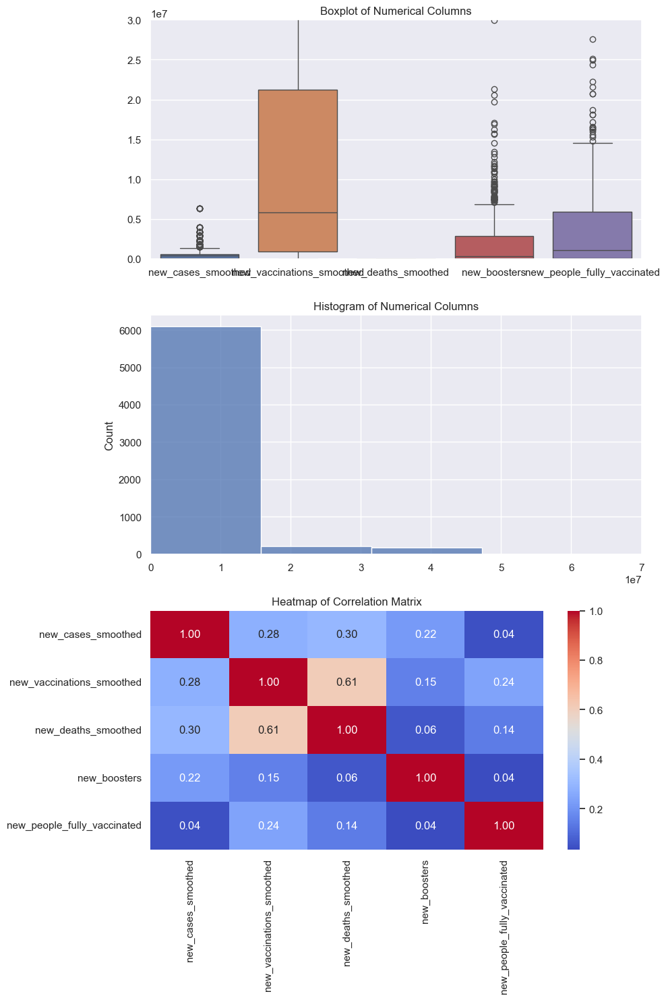

In [13]:
import seaborn as sb
import matplotlib.pyplot as plt

def plot_visualizations(data, columns):
    # Create a figure and axis objects
    fig, axes = plt.subplots(3, 1, figsize=(10, 15))

    # Plot boxplot with adjusted whiskers
    sb.boxplot(data=data[columns], ax=axes[0], whis=1.5)
    axes[0].set_title('Boxplot of Numerical Columns')
    axes[0].set_ylim(0, 3e7)  # Limit y-axis until 1e7

    # Plot histogram
    sb.histplot(data=data[columns].stack(), ax=axes[1], bins=50)
    axes[1].set_title('Histogram of Numerical Columns')
    axes[1].set_xlim(0, 7e7)  # Limit x-axis until 1000
    axes[1].set_ylim(0, None)  # No need to limit y-axis

    # Plot heatmap
    correlation_matrix = data[columns].corr()
    sb.heatmap(correlation_matrix, ax=axes[2], cmap='coolwarm', annot=True, fmt=".2f")
    axes[2].set_title('Heatmap of Correlation Matrix')

    # Adjust layout
    plt.tight_layout()

    # Show the plots
    plt.show()

# Define the columns you want to analyze
columns = ['new_cases_smoothed', 'new_vaccinations_smoothed', 'new_deaths_smoothed', 'new_boosters', 'new_people_fully_vaccinated']

# Call the function with the WorldData DataFrame and the specified columns
plot_visualizations(WorldData, columns)


From boxplot, it is noted that **outlier numbers are too high**, indicating it is **significant** to account for outliers, or else adjusting the factors affecting outlier.

## Observe the trend over time

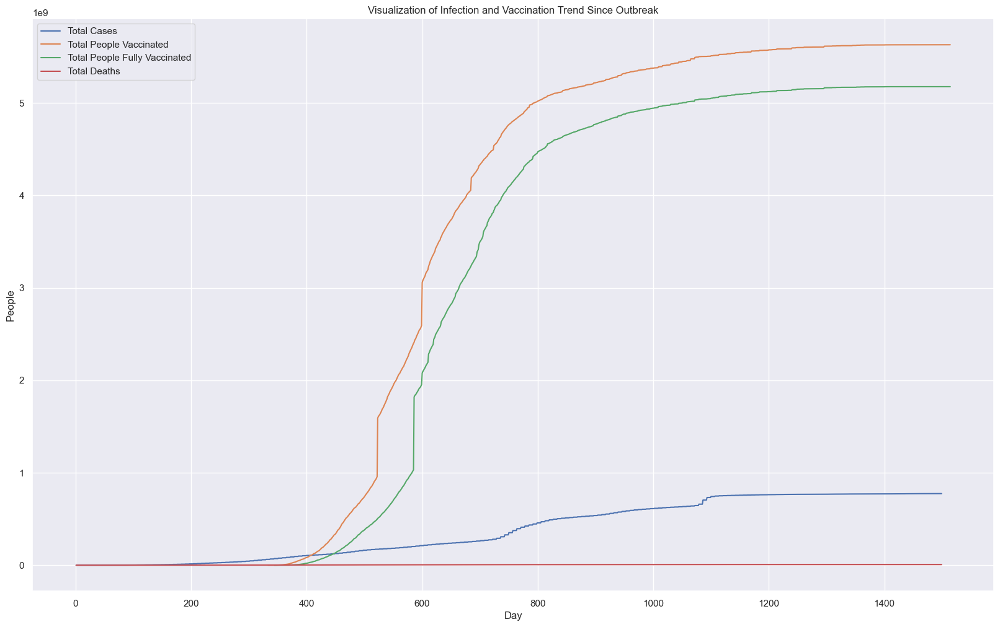

In [14]:
# Plot total cases and total vaccinations against day
# Create a figure and axis objects with a specific size
fig, ax = plt.subplots(figsize=(20, 12))

# Plot total cases against day
ax.plot(WorldData['day'], WorldData['total_cases'], label='Total Cases')
# Plot total people vaccinated against day
ax.plot(WorldData['day'], WorldData['people_vaccinated'], label='Total People Vaccinated')
# Plot total people fully vaccinated against day
ax.plot(WorldData['day'], WorldData['people_fully_vaccinated'], label='Total People Fully Vaccinated')
# Plot total deaths against day
ax.plot(WorldData['day'], WorldData['total_deaths'], label='Total Deaths')

# Set labels and title
ax.set_xlabel('Day')
ax.set_ylabel('People')
ax.set_title('Visualization of Infection and Vaccination Trend Since Outbreak')

# Add legend
ax.legend()

# Show the plot
plt.show()


## Observe trend of new_cases and new_deaths

,new_cases_smoothed,new_deaths_smoothed
new_cases_smoothed,1.000000,0.300485
new_deaths_smoothed,0.300485,1.000000


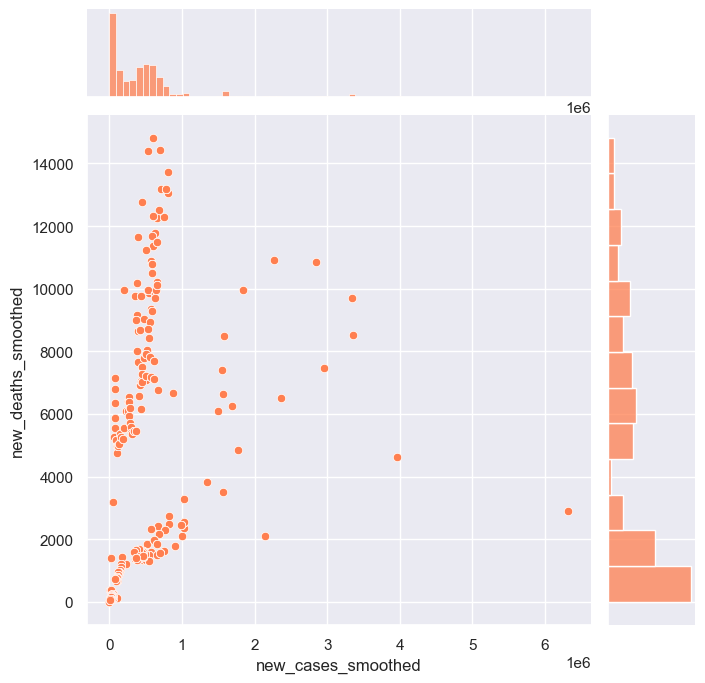

In [15]:
sb.jointplot(x = 'new_cases_smoothed', y='new_deaths_smoothed', data = WorldData, height = 7, color = 'coral')
joint = WorldData[['new_cases_smoothed','new_deaths_smoothed']]
joint.corr()

From observed pairplot, it can be visualized that the **infection rate** is not highly correlating with its **fatality**, as increase in new_cases has poor relation with increase in new_deaths

## Shift new_vaccinations to certain period chosen and see the correaltion with other variables

In [16]:
shifted_day = [0, 14, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360]

for day in shifted_day:
    WorldData[f'new_vaccinations_shifted_{day}'] = WorldData['new_vaccinations'].shift(day)
    WorldData[f'new_vaccinations_shifted_smoothed_{day}'] = WorldData['new_vaccinations_smoothed'].shift(day)
    WorldData[f'new_cases_shifted_{day}'] = WorldData['new_cases'].shift(day)
    WorldData[f'new_cases_shifted_smoothed_{day}'] = WorldData['new_cases_smoothed'].shift(day)
    WorldData[f'new_people_fully_vaccinated_shifted_{day}'] = WorldData['new_people_fully_vaccinated'].shift(day)

WorldData


,total_cases,people_vaccinated,year,month,day,day_category,date,location,days_from_first_infection,days_from_first_vaccination,...,new_vaccinations_shifted_330,new_vaccinations_shifted_smoothed_330,new_cases_shifted_330,new_cases_shifted_smoothed_330,new_people_fully_vaccinated_shifted_330,new_vaccinations_shifted_360,new_vaccinations_shifted_smoothed_360,new_cases_shifted_360,new_cases_shifted_smoothed_360,new_people_fully_vaccinated_shifted_360
372603,2.0,NaN,2020,January,1,1,2020-01-05,World,0.0,-332.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
372604,2.0,NaN,2020,January,2,1,2020-01-06,World,1.0,-331.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
372605,2.0,NaN,2020,January,3,1,2020-01-07,World,2.0,-330.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
372606,2.0,NaN,2020,January,4,1,2020-01-08,World,3.0,-329.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
372607,2.0,NaN,2020,January,5,1,2020-01-09,World,4.0,-328.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374112,NaN,5.630398e+09,2024,February,1510,16,2024-02-22,World,1509.0,1177.0,...,1508982.0,1547537.0,0.0,119020.143,20960.0,1767390.0,1625270.0,0.0,153269.286,17367.0
374113,NaN,5.630399e+09,2024,February,1511,16,2024-02-23,World,1510.0,1178.0,...,1508908.0,1525008.0,0.0,119020.143,2032869.0,1778528.0,1613370.0,0.0,153269.286,319689.0
374114,NaN,5.630400e+09,2024,February,1512,16,2024-02-24,World,1511.0,1179.0,...,1495700.0,1504164.0,0.0,119020.143,159245.0,1726330.0,1680150.0,0.0,153269.286,158193.0
374115,NaN,5.630400e+09,2024,February,1513,16,2024-02-25,World,1512.0,1180.0,...,1410738.0,1480431.0,0.0,119020.143,15732.0,1684306.0,1742374.0,0.0,153269.286,54496.0


## Observe new cases and new_vaccinations over time

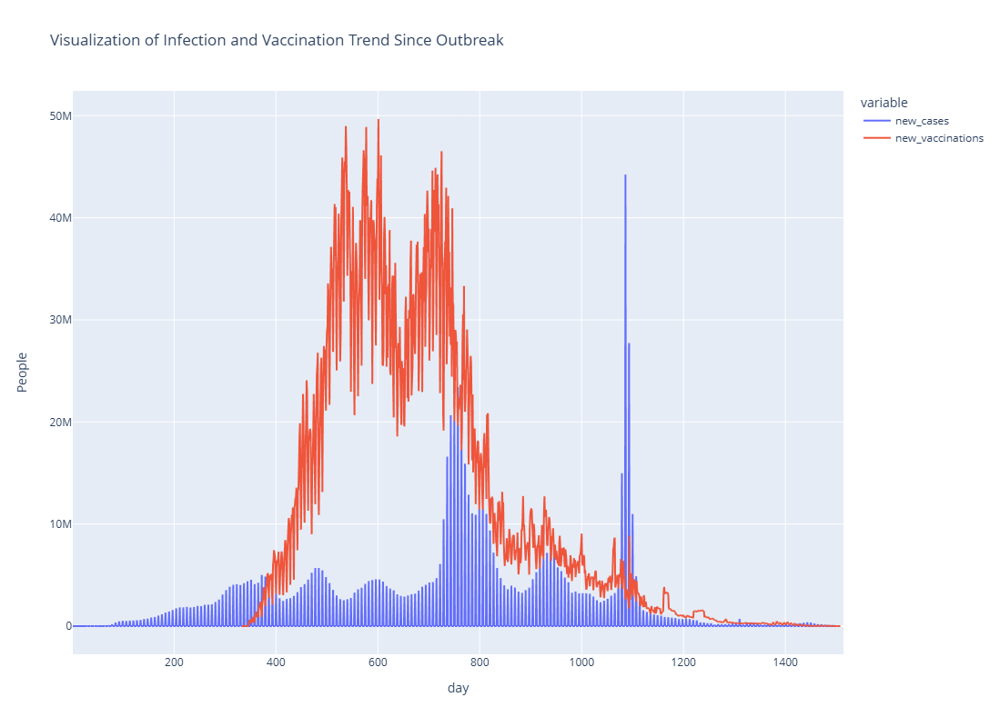

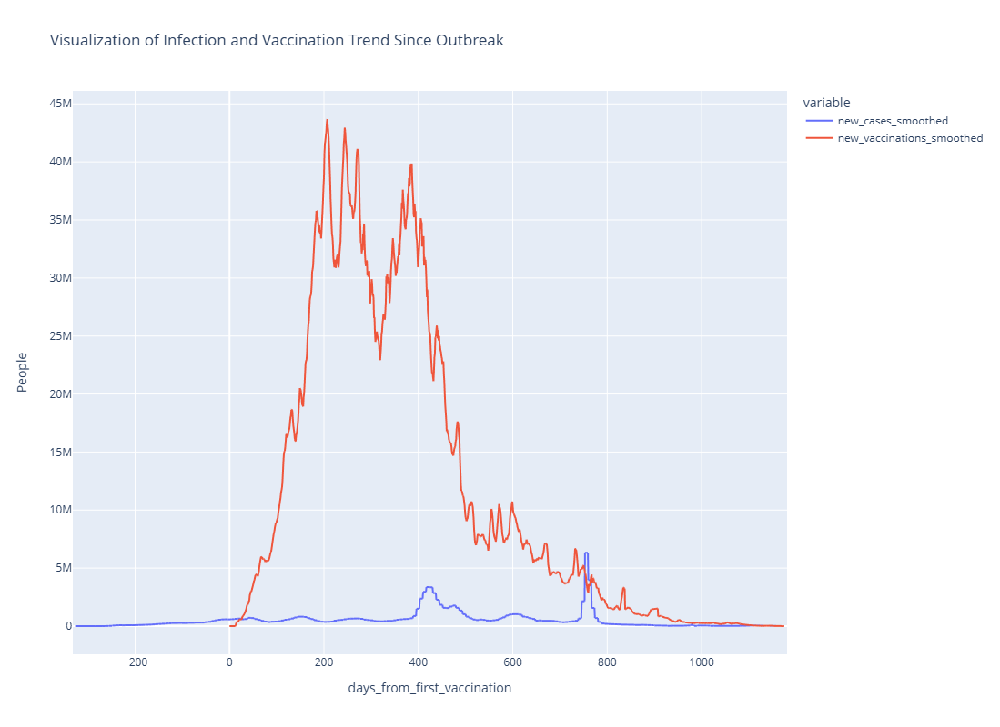

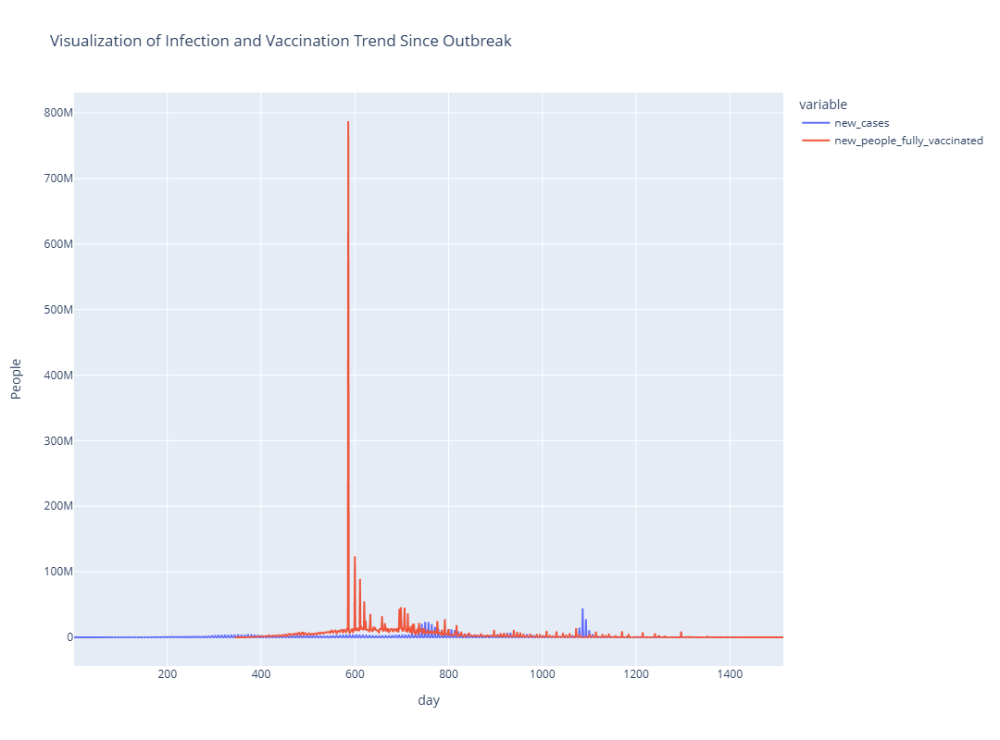

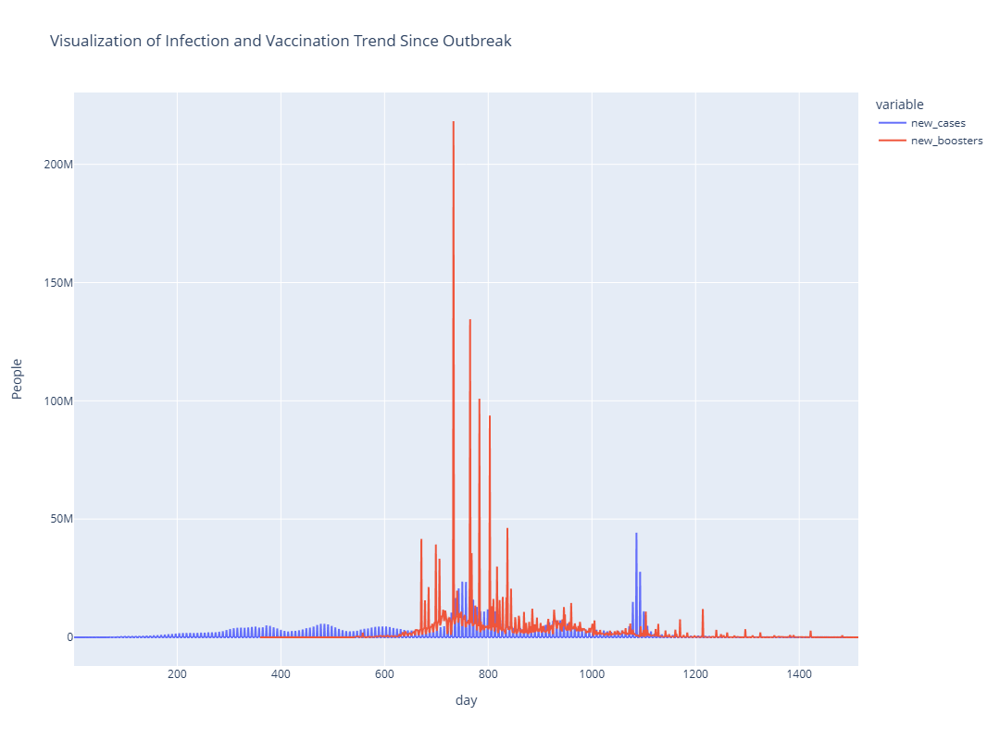

In [17]:
import plotly.express as px

def plot_infection_vaccination_trend(data, x_column, y_columns, title):
    fig = px.line(data, x=x_column, y=y_columns,
                  labels={'value': 'People', x_column: x_column},
                  title=title)

    # Update layout to increase the plot size
    fig.update_layout(width=1100, height=800)

    # Show the plot
    fig.show()

# Create a new DataFrame with the 'day' column as a regular column
WorldData_reset = WorldData.reset_index()

# Define configurations for the plots
plot_configurations = [
    {'x_column': 'day', 'y_columns': ['new_cases', 'new_vaccinations',], 'title': 'Visualization of Infection and Vaccination Trend Since Outbreak'},
    {'x_column': 'days_from_first_vaccination', 'y_columns': ['new_cases_smoothed', 'new_vaccinations_smoothed'], 'title': 'Visualization of Infection and Vaccination Trend Since Outbreak'},
{'x_column': 'day', 'y_columns': ['new_cases', 'new_people_fully_vaccinated'], 'title': 'Visualization of Infection and Vaccination Trend Since Outbreak'},
{'x_column': 'day', 'y_columns': ['new_cases', 'new_boosters'], 'title': 'Visualization of Infection and Vaccination Trend Since Outbreak'},]

# Generate plots using a for loop
for config in plot_configurations:
    plot_infection_vaccination_trend(WorldData_reset, config['x_column'], config['y_columns'], config['title'])



## Abstract important data/ peak day for new cases/new vaccinations

In [18]:
selected_rows_peak_cases = WorldData[(WorldData['day'].astype(int) == 743) | (WorldData['day'].astype(int) == 1086)]
new_cases_max = selected_rows_peak_cases[['day', 'new_cases', 'new_cases_smoothed']]
display(new_cases_max)

date_max_new_cases = WorldData.loc[(WorldData['day'].astype(int) == 743) | (WorldData['day'].astype(int) == 1086), ['date']]
display(date_max_new_cases)


,day,new_cases,new_cases_smoothed
373345,743,20661705.0,2951672.143
373688,1086,44236227.0,6319461.000


,date
373345,2022-01-16
373688,2022-12-25


In [19]:
selected_rows_peak_vaccinations = WorldData[(WorldData['day'].astype(int) >= 516) & (WorldData['day'].astype(int) <= 746)]
new_vaccinations_max = selected_rows_peak_vaccinations[['day','new_vaccinations','new_vaccinations_smoothed']]
display(new_vaccinations_max)
date_max_new_vaccinations = WorldData.loc[(WorldData['day'].astype(int) >= 516) & (WorldData['day'].astype(int) <= 746), ['date']]
display(date_max_new_vaccinations)

,day,new_vaccinations,new_vaccinations_smoothed
373118,516,36239261.0,34948805.0
373119,517,41051181.0,35783145.0
373120,518,31965267.0,35753794.0
373121,519,25049396.0,35468039.0
373122,520,32216757.0,35104939.0
...,...,...,...
373344,742,31552437.0,33554045.0
373345,743,27561645.0,33407475.0
373346,744,33173556.0,33603176.0
373347,745,24433115.0,31074304.0


,date
373118,2021-06-03
373119,2021-06-04
373120,2021-06-05
373121,2021-06-06
373122,2021-06-07
...,...
373344,2022-01-15
373345,2022-01-16
373346,2022-01-17
373347,2022-01-18


In [20]:
selected_rows = WorldData[(WorldData['day'].astype(int) >= 585) & (WorldData['day'].astype(int) <= 588)]
new_people_fully_vaccinated_max = selected_rows[['day','new_people_fully_vaccinated', 'people_fully_vaccinated']]
display(new_people_fully_vaccinated_max)
date_max_fully_vaccinated = WorldData.loc[WorldData['day'].astype(int) == 585, ['date']]
display(date_max_fully_vaccinated)

,day,new_people_fully_vaccinated,people_fully_vaccinated
373187,585,10386975.0,1.031496e+09
373188,586,787370997.0,1.818867e+09
373189,587,14163894.0,1.833031e+09
373190,588,9302395.0,1.842333e+09


,date
373187,2021-08-11


In [21]:
selected_rows_2 = WorldData[(WorldData['day'].astype(int) >= 733) & (WorldData['day'].astype(int) <= 803)]
new_people_boostered_max = selected_rows[['day','new_boosters', 'total_boosters']]
display(new_people_boostered_max)
date_max_new_people_boostered = WorldData.loc[(WorldData['day'].astype(int) >= 733) & (WorldData['day'].astype(int) <= 803), ['date']]
display(date_max_new_people_boostered)

,day,new_boosters,total_boosters
373187,585,455799.0,10160533.0
373188,586,474826.0,10635359.0
373189,587,332800.0,10968159.0
373190,588,233202.0,11201361.0


,date
373335,2022-01-06
373336,2022-01-07
373337,2022-01-08
373338,2022-01-09
373339,2022-01-10
...,...
373401,2022-03-13
373402,2022-03-14
373403,2022-03-15
373404,2022-03-16


## Observed new deaths over time

In [22]:
import plotly.express as px

# Create a new DataFrame with the 'day' column as a regular column
WorldData_reset = WorldData.reset_index()

fig = px.line(WorldData_reset, x='day', y=['new_deaths'],
              labels={'value': 'New Death', 'day': 'Day'},
              title='Visualization of Infection and Vaccination Trend Since Outbreak')

# Update layout to increase the plot size
fig.update_layout(width=1000, height=800)

# Show the plot
fig.show()



## Explaining on shifted variable toward another variable

## a) New Cases effect after certain days toward new deaths

In [23]:
correlations_shifted_day = []

# Calculate correlation for each shifted day
for day in shifted_day:
    correlation = WorldData['new_deaths'].corr( WorldData[f'new_cases_shifted_{day}'])
    correlation2 =  WorldData['new_deaths_smoothed'].corr(WorldData[f'new_cases_shifted_smoothed_{day}'])
    correlations_shifted_day.append((day, correlation, correlation2))

correlations_df = pd.DataFrame(correlations_shifted_day, columns=['Shifted Days', 'Correlation', 'Correlation (Smoothed)'])
correlations_df


,Shifted Days,Correlation,Correlation (Smoothed)
0,0,0.569722,0.300485
1,14,0.562496,0.283478
2,30,-0.067011,0.215128
3,60,-0.068371,0.023002
4,90,-0.069503,-0.091704
5,120,-0.069511,-0.133747
6,150,-0.069955,-0.166667
7,180,-0.070336,-0.192686
8,210,0.288097,-0.240928
9,240,-0.070580,-0.300852


## b) New Vaccinations effect after certain days toward new cases

In [24]:
correlations_shifted_day = []

# Calculate correlation for each shifted day
for day in shifted_day:
    correlation =  WorldData['new_cases'].corr(WorldData[f'new_vaccinations_shifted_{day}'])
    correlation2 = WorldData['new_cases_smoothed'].corr(WorldData[f'new_vaccinations_shifted_smoothed_{day}'])
    correlations_shifted_day.append((day, correlation, correlation2))

correlations_df = pd.DataFrame(correlations_shifted_day, columns=['Shifted Days', 'Correlation', 'Correlation (Smoothed)'])
correlations_df


,Shifted Days,Correlation,Correlation (Smoothed)
0,0,0.012682,0.278844
1,14,0.024838,0.332265
2,30,0.146358,0.379552
3,60,0.158371,0.396557
4,90,0.090004,0.375874
5,120,0.096703,0.364934
6,150,0.170815,0.443643
7,180,0.175466,0.485049
8,210,0.056640,0.507208
9,240,0.184043,0.460425


In [25]:
correlations_shifted_day = []

# Calculate correlation for each shifted day
for day in shifted_day:
    correlation =  WorldData['new_cases'].corr(WorldData[f'new_people_fully_vaccinated_shifted_{day}'])
    correlation2 =  WorldData['new_cases_smoothed'].corr(WorldData[f'new_people_fully_vaccinated_shifted_{day}'])
    correlations_shifted_day.append((day, correlation, correlation2))

correlations_df = pd.DataFrame(correlations_shifted_day, columns=['Shifted Days', 'Correlation', 'Correlation (Smoothed)'])
correlations_df

,Shifted Days,Correlation,Correlation (Smoothed)
0,0,0.008926,0.044543
1,14,0.017968,0.056800
2,30,0.031260,0.068125
3,60,0.012930,0.076039
4,90,0.016340,0.075172
5,120,0.011787,0.091643
6,150,0.239113,0.172817
7,180,0.018066,0.163766
8,210,0.001438,0.103213
9,240,0.018291,0.073208


## c) New Vaccinations effect after certain days toward new deaths

In [26]:
correlations_shifted_day = []

# Calculate correlation for each shifted day
for day in shifted_day:
    correlation =  WorldData['new_deaths'].corr( WorldData[f'new_vaccinations_shifted_{day}'])
    correlation2 =  WorldData['new_deaths_smoothed'].corr(WorldData[f'new_vaccinations_shifted_smoothed_{day}'])
    correlations_shifted_day.append((day, correlation, correlation2))

# Create a DataFrame for correlations with new deaths
correlations_deaths_df = pd.DataFrame(correlations_shifted_day, columns=['Shifted Days', 'Correlation Deaths', 'Correlation Deaths (Smoothed)'])
correlations_deaths_df


,Shifted Days,Correlation Deaths,Correlation Deaths (Smoothed)
0,0,0.053711,0.608738
1,14,0.050867,0.591949
2,30,0.203305,0.583263
3,60,0.199268,0.571904
4,90,0.115805,0.509135
5,120,0.081955,0.393259
6,150,0.147467,0.358271
7,180,0.132074,0.370806
8,210,-0.013764,0.320557
9,240,0.111861,0.245486


From above relation, we can see at **210** day after new_vaccinations affect **change of new cases** the most, thus we decided to abstract `new_vaccinations_smoothed_shifted_210` data out

## Comparison between New_vaccinations_smoothed_shifted_210 againist new_cases_smoothed and New_vaccinations_shifted_210 againist new_cases

`Smoothed plot` and `Non smoothed plot` is differentiated by desire  of data scientist. In our project, we are interested on investigating change on **daily basis** however, the plot on non smoothed plot is **clearer**. The trend is the same, and thus we select `non smoothed plot` for visualization.


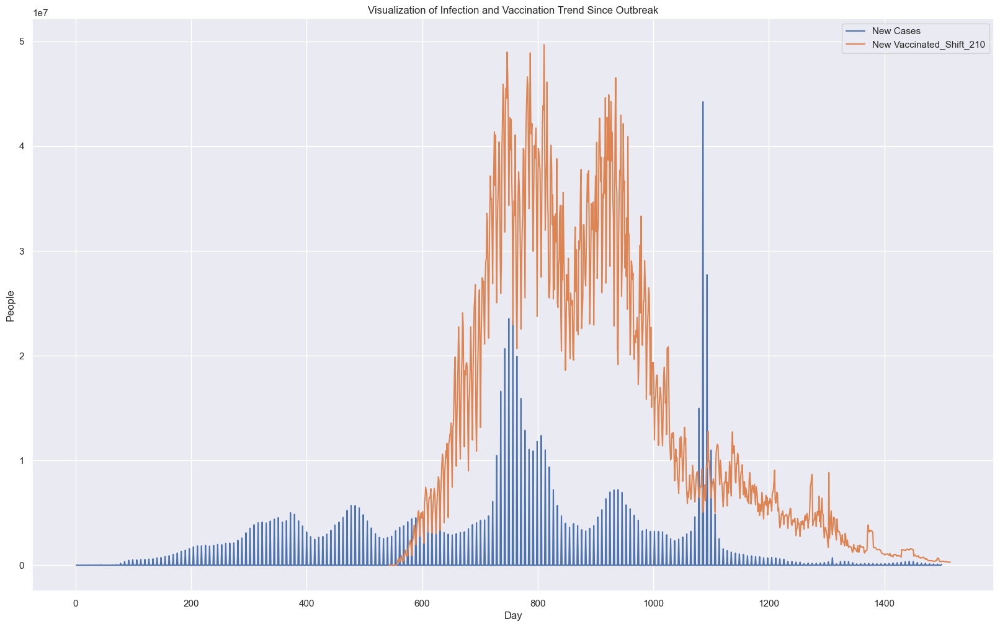

In [27]:
fig, ax = plt.subplots(figsize=(20, 12))

# Plot total cases against day
ax.plot(WorldData['day'],WorldData['new_cases'], label='New Cases')

# Plot total people vaccinated against day
ax.plot(WorldData['day'], WorldData['new_vaccinations_shifted_210'], label='New Vaccinated_Shift_210')
# Set labels and title
ax.set_xlabel('Day')
ax.set_ylabel('People')
ax.set_title('Visualization of Infection and Vaccination Trend Since Outbreak')

# Add legend
ax.legend()

# Show the plot
plt.show()


## Interactive Plot Easier Visualize

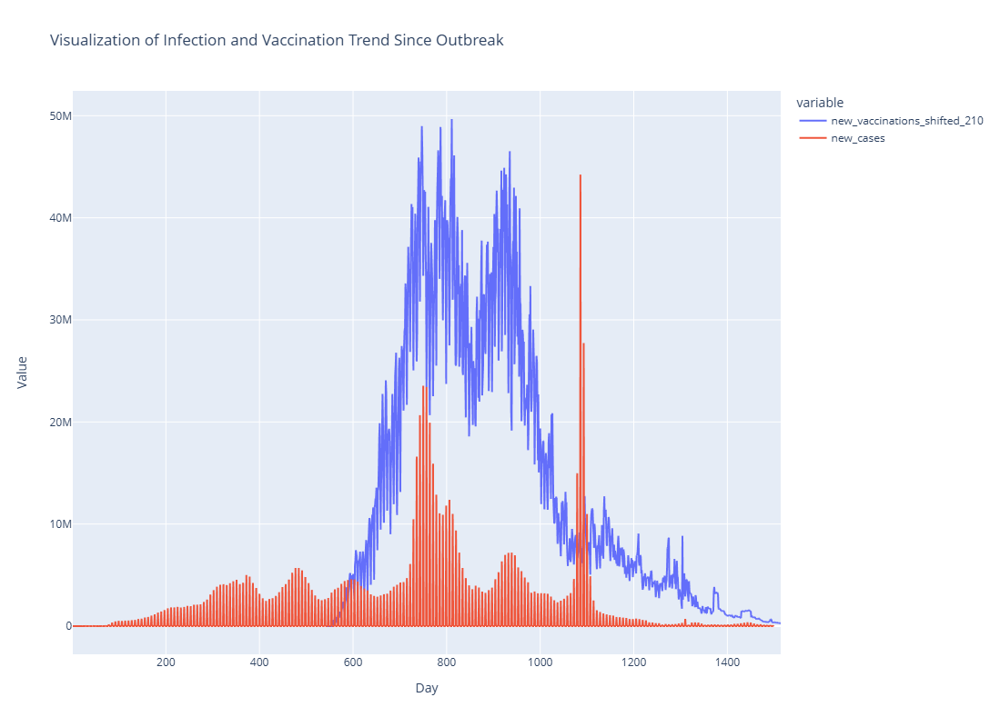

In [28]:
import plotly.express as px

# Create a new DataFrame with the 'day' column as a regular column
WorldData_reset = WorldData.reset_index()

fig = px.line(WorldData_reset, x='day', y=['new_vaccinations_shifted_210', 'new_cases'],
              labels={'value': 'Value', 'day': 'Day'},
              title='Visualization of Infection and Vaccination Trend Since Outbreak')

# Update layout to increase the plot size
fig.update_layout(width=1000, height=800)

# Show the plot
fig.show()



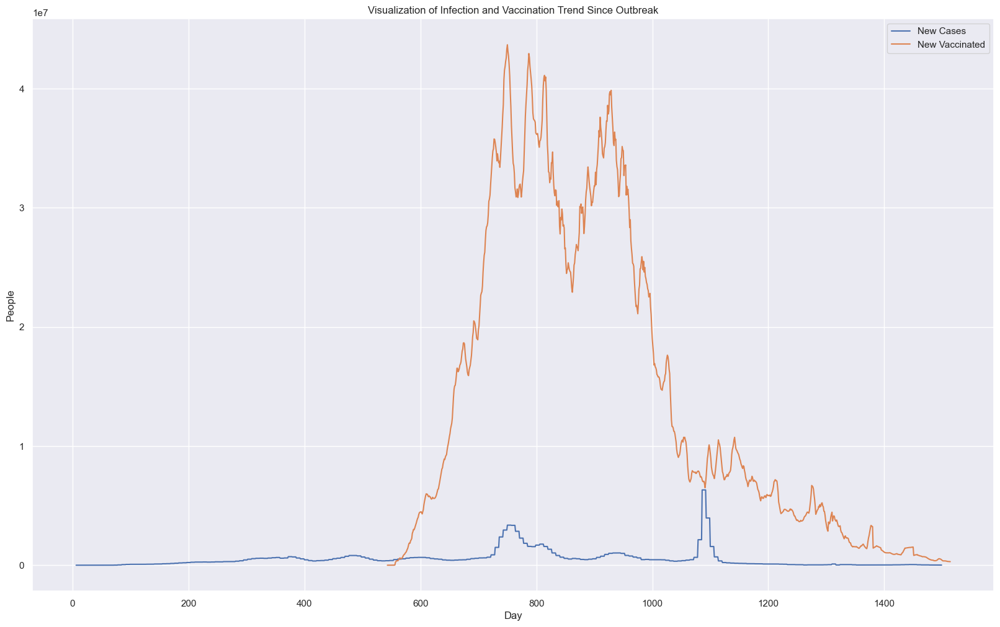

In [29]:
fig, ax = plt.subplots(figsize=(20, 12))

# Plot total cases against day
ax.plot(WorldData['day'], WorldData['new_cases_smoothed'], label='New Cases')

# Plot total people vaccinated against day
ax.plot(WorldData['day'], WorldData['new_vaccinations_shifted_smoothed_210'], label='New Vaccinated')
# Set labels and title
ax.set_xlabel('Day')
ax.set_ylabel('People')
ax.set_title('Visualization of Infection and Vaccination Trend Since Outbreak')

# Add legend
ax.legend()

# Show the plot
plt.show()

## Observe the Pattern

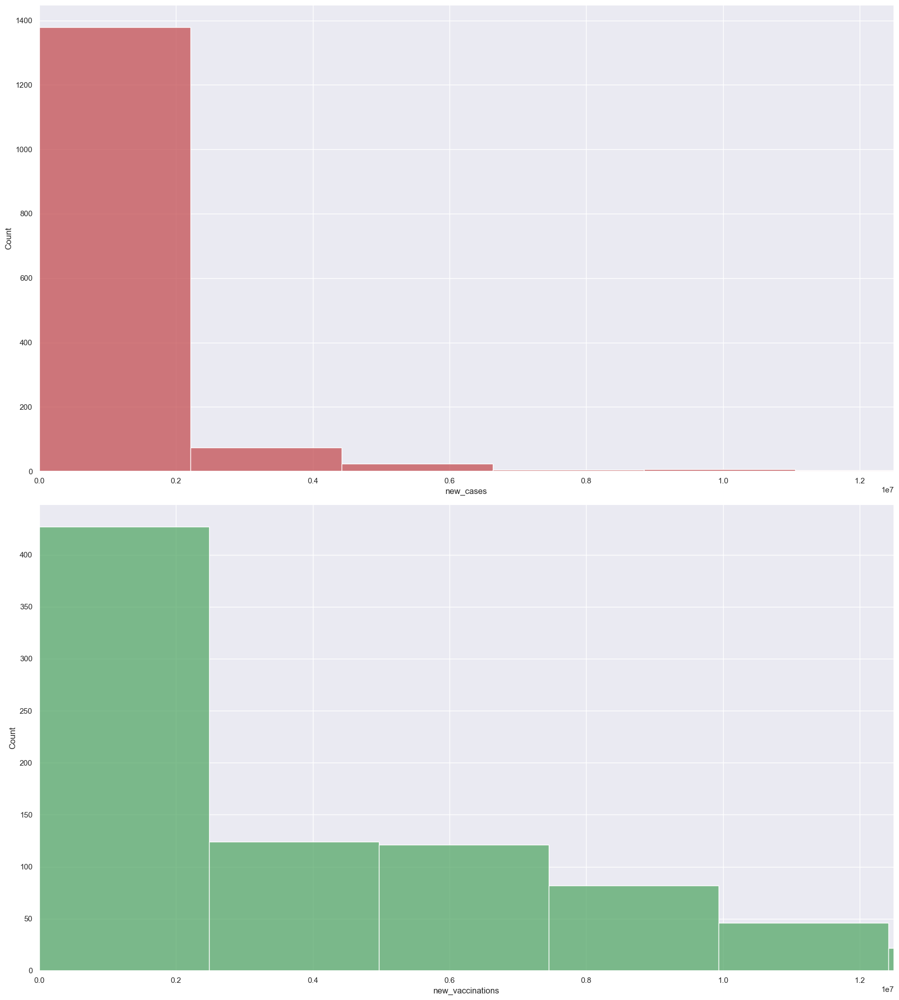

In [30]:
f, axes = plt.subplots(2, 1, figsize=(18, 20))
WorldData_1 = WorldData[['new_cases', 'new_vaccinations']]
colors = ["r", "g"]  # r for red, g for green
for count, var in enumerate(WorldData_1):
    sb.histplot(x=var, data=WorldData_1, color=colors[count], ax=axes[count], bins=20)  # Set different bin size here
    axes[count].set_xlim(left=0, right=12500000)

plt.tight_layout()
plt.show()


---

## Abstract Peak Cases, Peak Deaths, Peak Vaccinations and respective Days. Observe Abnormality

In [31]:
WorldData_new = WorldData[['day', 'new_cases', 'new_vaccinations', 'new_deaths']]
for var in ['new_cases', 'new_vaccinations', 'new_deaths']:
    max_value = WorldData_new[var].max()
    peak_day = WorldData_new.loc[WorldData_new[var].idxmax(), 'day']
    print(f"Peak day for {var}: {peak_day} with {max_value} cases/deaths/vaccinations")

Peak day for new_cases: 1086 with 44236227.0 cases/deaths/vaccinations
Peak day for new_vaccinations: 601 with 49673196.0 cases/deaths/vaccinations
Peak day for new_deaths: 386 with 103719.0 cases/deaths/vaccinations


In [32]:
print(new_df['location'].dtype)
print(new_df['new_cases'].isnull().sum())
new_df_interest =new_df[['date','day','location', 'new_cases', 'new_vaccinations', 'new_deaths']]
#new_df_interest = new_df_interest.dropna()

category
10804


## Define a genera function for abstracting peak data

In [33]:
def get_peak_info_for_country(data, country_name):
    # Filter the data for the specified country
    country_data = data[data['location'] == country_name]
    
    # Find the peak day information
    if not country_data.empty:
        # Find the day with the maximum new cases
        max_cases_day = country_data['new_cases'].idxmax(skipna=True)
        if not pd.isna(max_cases_day):
            peak_cases = country_data.loc[max_cases_day, 'new_cases']
            peak_day_cases = country_data.loc[max_cases_day, ['date', 'day']].to_dict()

            # Find the day with the maximum new vaccinations
            max_vaccinations_day = country_data['new_vaccinations'].idxmax(skipna=True)
            if not pd.isna(max_vaccinations_day):
                peak_vaccinations = country_data.loc[max_vaccinations_day, 'new_vaccinations']
                peak_day_vaccinations = country_data.loc[max_vaccinations_day, ['date', 'day']].to_dict()

                # Find the day with the maximum new deaths
                max_deaths_day = country_data['new_deaths'].idxmax(skipna=True)
                if not pd.isna(max_deaths_day):
                    peak_deaths = country_data.loc[max_deaths_day, 'new_deaths']
                    peak_day_deaths = country_data.loc[max_deaths_day, ['date', 'day']].to_dict()

                    return pd.DataFrame({
                        'Location': [country_name],
                        'Peak Date Cases': [peak_day_cases['date']], 'Peak Day Cases': [peak_day_cases['day']], 
                        'Peak Cases': [peak_cases],
                        'Peak Date Vaccinations': [peak_day_vaccinations['date']], 'Peak Day Vaccinations ': [peak_day_vaccinations['day']], 
                        'Peak Vaccinations': [peak_vaccinations],
                        'Peak Date Deaths': [peak_day_deaths['date']], 'Peak Day Deaths ': [peak_day_deaths['day']], 
                        'Peak Deaths': [peak_deaths]
                    })
    #else:
        #print(f"No data found for {country_name}")
        #return pd.DataFrame()

# Example usage
countries = new_df_interest['location'].unique()
peak_info_list = []
for country in countries:
    peak_info_list.append(get_peak_info_for_country(new_df_interest, country))

# Combine the individual DataFrames into a single DataFrame
peak_info_df = pd.concat(peak_info_list, ignore_index=True)
peak_info_df


,Location,Peak Date Cases,Peak Day Cases,Peak Cases,Peak Date Vaccinations,Peak Day Vaccinations,Peak Vaccinations,Peak Date Deaths,Peak Day Deaths,Peak Deaths
0,Afghanistan,2021-06-27,540,12314.0,2022-11-02,1033,36587.0,2021-06-20,533,595.0
1,Africa,2022-01-09,736,316014.0,2022-06-23,901,4248978.0,2021-08-08,582,7103.0
2,Albania,2022-01-23,750,15405.0,2021-04-30,482,23655.0,2021-03-07,428,141.0
3,Algeria,2022-01-30,757,14774.0,2021-11-30,696,147230.0,2021-08-08,582,266.0
4,Andorra,2022-01-16,743,3480.0,2021-04-05,457,2829.0,2020-04-05,92,11.0
...,...,...,...,...,...,...,...,...,...,...
177,Uzbekistan,2022-01-23,750,8941.0,2021-08-13,587,720866.0,2021-08-08,582,48.0
178,Vietnam,2022-03-20,806,1845400.0,2021-10-19,654,2091069.0,2021-08-22,596,2503.0
179,World,2022-12-25,1086,44236227.0,2021-08-27,601,49673196.0,2021-01-24,386,103719.0
180,Zambia,2022-01-02,729,26367.0,2022-05-27,874,224617.0,2021-07-04,547,430.0


## Example

In [34]:
(get_peak_info_for_country(new_df_interest, 'Andorra'))

,Location,Peak Date Cases,Peak Day Cases,Peak Cases,Peak Date Vaccinations,Peak Day Vaccinations,Peak Vaccinations,Peak Date Deaths,Peak Day Deaths,Peak Deaths
0,Andorra,2022-01-16,743,3480.0,2021-04-05,457,2829.0,2020-04-05,92,11.0


## Obtain country data with total cases > 1000000

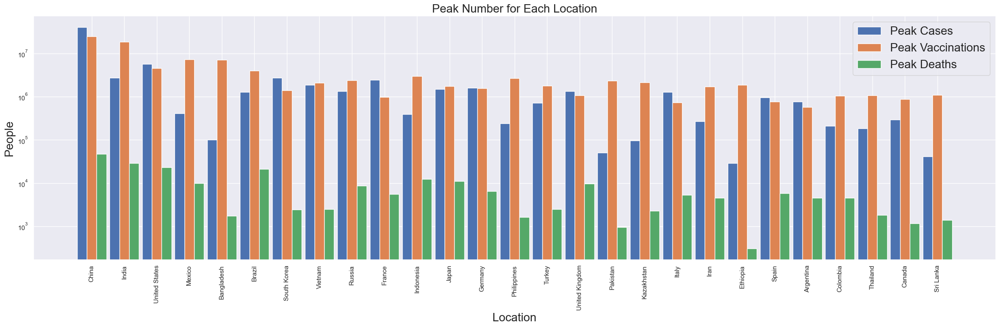

In [35]:
 continents = ['Asia', 'Europe', 'Africa', 'European Union', 'High income', 'Low income', 'Lower middle income', 'North America', 'South America', 'Oceania', 'Upper middle income', 'World']
peak_info_df_general = peak_info_df[~peak_info_df['Location'].isin(continents)]
def plot_three_x(data):
    # Calculate total peak cases, peak vaccinations, and peak deaths
    data['Total'] = data['Peak Cases'] + data['Peak Vaccinations'] + data['Peak Deaths']
    
    # Filter data where total is greater than 1,000,000 and not continents
    filtered_data = data[(data['Total'] > 1000000)]
    
    # Sort data in descending order based on total
    sorted_data = filtered_data.sort_values('Total', ascending=False)
    
    # Grouped bar chart
    plt.figure(figsize=(24, 8))
    bar_width = 0.3
    index = np.arange(len(sorted_data))
    for i, var in enumerate(['Peak Cases', 'Peak Vaccinations', 'Peak Deaths']):
        plt.bar(index + i * bar_width, sorted_data[var], bar_width, label=var)
    
    if len(sorted_data) > 10:
        plt.xticks(index + bar_width, sorted_data['Location'], rotation=90)  # Rotate x-ticks if more than 10 data points
        plt.xlabel('Location',fontsize = 20)
        plt.ylabel('People',fontsize = 20)
        plt.title('Peak Number for Each Location',fontsize = 20)
        plt.yscale('log')
        plt.legend(fontsize = 20)
        plt.tight_layout()
        plt.show()
    else:
        plt.xticks(index + bar_width, sorted_data['Location'],fontsize = 20)  # Keep x-ticks horizontal if 10 or fewer data points
        plt.xlabel('Location',fontsize = 20)
        plt.ylabel('People',fontsize = 20)
        plt.title('Peak Number for Each Location',fontsize = 20)
        plt.yscale('log')
        plt.legend(fontsize = 20)
        plt.tight_layout()
        plt.show()
        

plot_three_x(peak_info_df_general)

## Obtain continent and income group data

In [36]:
abstract_rows = []

for var in continents:
    abstract_row = peak_info_df.loc[peak_info_df['Location'] == var]
    abstract_rows.append(abstract_row)

continents_df = pd.concat(abstract_rows, ignore_index=True)
# List of income groups to exclude
income_groups = ['High income', 'Low income', 'Lower middle income', 'Upper middle income']

# Remove rows corresponding to income groups
income_groups_df = continents_df[continents_df['Location'].isin(income_groups)]
continents_df = continents_df[~continents_df['Location'].isin(income_groups)]

# Display the filtered DataFrame
display(income_groups_df)
display(continents_df)



,Location,Peak Date Cases,Peak Day Cases,Peak Cases,Peak Date Vaccinations,Peak Day Vaccinations,Peak Vaccinations,Peak Date Deaths,Peak Day Deaths,Peak Deaths
4,High income,2022-01-23,750,16133515.0,2021-06-09,522,10147717.0,2021-01-24,386,59997.0
5,Low income,2022-01-02,729,130404.0,2022-06-23,901,3388175.0,2021-07-04,547,2277.0
6,Lower middle income,2021-05-09,491,3169288.0,2021-09-18,623,24966004.0,2021-05-23,505,38415.0
10,Upper middle income,2022-12-25,1086,40969454.0,2021-06-24,537,30831242.0,2023-02-05,1128,49452.0


,Location,Peak Date Cases,Peak Day Cases,Peak Cases,Peak Date Vaccinations,Peak Day Vaccinations,Peak Vaccinations,Peak Date Deaths,Peak Day Deaths,Peak Deaths
0,Asia,2022-12-25,1086,42142424.0,2021-08-27,601,37780580.0,2023-02-05,1128,60413.0
1,Europe,2022-01-30,757,11040888.0,2021-12-21,717,7118077.0,2021-01-24,386,40342.0
2,Africa,2022-01-09,736,316014.0,2022-06-23,901,4248978.0,2021-08-08,582,7103.0
3,European Union,2022-01-30,757,8867064.0,2021-06-09,522,5259705.0,2020-11-29,330,27862.0
7,North America,2022-01-16,743,6581541.0,2021-12-20,716,9186630.0,2021-01-24,386,34452.0
8,South America,2022-01-30,757,2570599.0,2022-01-17,744,5346868.0,2021-04-18,470,33704.0
9,Oceania,2022-01-09,736,593626.0,2021-08-25,599,439393.0,2023-02-05,1128,1317.0
11,World,2022-12-25,1086,44236227.0,2021-08-27,601,49673196.0,2021-01-24,386,103719.0


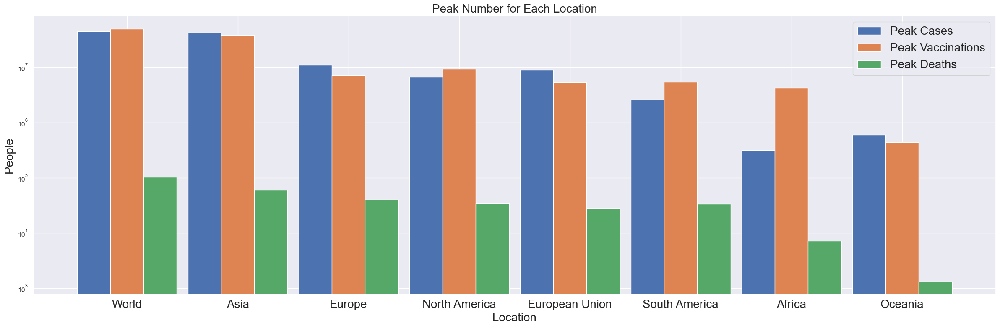

In [37]:
plot_three_x(continents_df)


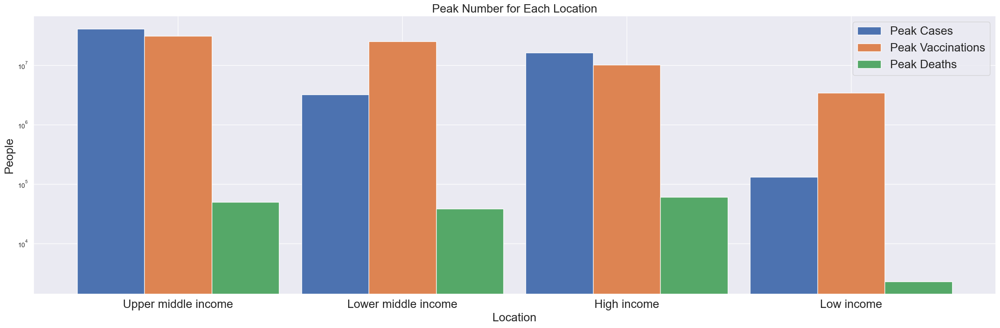

In [38]:
plot_three_x(income_groups_df)

 From observed graph, There is confirmed that number of deaths are considered very low compared to cases and vaccinations. Even peak number is very low. While for peak cases and peak vaccinations the numbers are similiars, indicate the **fatality** is lower compared to **infection rate** and **vaccination rate**.

# Machine Learning: Regression

### Analyze correlation for dataset again, to confirm the most affected data with `new_cases smoothed`

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,shifted_new_vaccinations_smoothed_210
total_cases,1.000000,0.144614,0.384244,0.941284,0.108851,0.290820,0.066382,-0.000206,-0.000567,0.094967,-0.004959,-0.013731,0.019781,0.312043,-0.063765,0.447996,-0.045597,0.149187,-0.157377,0.473296,-0.013679,0.859256,0.574786,0.094403,0.011179,0.089266,0.018048,0.040783,-0.017150,0.857665,0.841441,0.846975,0.899905,0.226891,0.270738,0.199971,0.194378,0.188752,0.070186,-0.057060,0.204217,-0.057068,-0.109670,-0.014957,0.047865,0.046030,0.043617,0.022526,-0.041599,-0.046376,-0.001884,-0.001843,0.006193,0.034358,0.019635,0.022301,0.049919,0.670784,0.744340,0.047475,-0.044341,0.161063,0.471716
new_cases,0.144614,1.000000,0.376419,0.171227,0.505933,0.188335,-0.000654,0.098871,0.030802,0.008478,0.063720,0.015073,0.009397,0.224763,0.069989,0.278367,0.069064,0.174622,0.074563,0.263790,0.129756,0.174599,0.141622,0.028785,0.007688,0.034029,0.029612,0.074649,-0.005746,0.138662,0.148530,0.143866,0.114023,0.091204,0.144638,0.019998,0.019073,0.017032,-0.016542,0.007333,0.105782,-0.003261,0.007285,-0.003366,0.012982,0.012468,0.011801,0.006091,-0.010355,-0.012073,-0.001413,-0.001327,0.002703,0.008399,0.005673,0.006334,0.012651,0.156466,0.321644,0.034247,0.073199,0.014874,0.178632
new_cases_smoothed,0.384244,0.376419,1.000000,0.455120,0.187374,0.500333,-0.001752,0.030219,0.081832,0.022524,0.014550,0.040045,0.022301,0.622286,0.188379,0.770932,0.193625,0.507225,0.191994,0.740555,0.344061,0.479626,0.550383,0.078514,0.062560,0.090742,0.076757,0.181115,-0.015209,0.374481,0.401401,0.389615,0.313039,0.348837,0.379683,0.054668,0.052073,0.047358,-0.042501,0.017663,0.278877,-0.009084,0.017457,-0.008940,0.034478,0.033114,0.031343,0.016178,-0.027516,-0.032066,-0.003751,-0.003528,0.007183,0.022302,0.015069,0.016817,0.033602,0.416333,0.345748,0.040126,0.084504,0.018957,0.474331
total_deaths,0.941284,0.171227,0.455120,1.000000,0.174813,0.467432,0.021721,-0.001879,-0.005138,0.111651,-0.000761,-0.002119,0.026171,0.446327,0.010986,0.533388,-0.026407,0.298715,-0.097250,0.583975,0.028879,0.772917,0.581608,0.030639,-0.008565,0.083548,-0.007413,0.031448,-0.017791,0.857311,0.862522,0.853276,0.833045,0.414394,0.452510,0.152802,0.162398,0.143622,-0.021580,-0.025020,0.375258,-0.034269,-0.046536,-0.019589,0.036508,0.031836,0.029190,0.009480,-0.047335,-0.040491,0.004071,-0.008505,-0.000956,0.044406,-0.002976,0.013474,0.044220,0.749182,0.929999,0.223055,-0.012145,0.253271,0.587594
new_deaths,0.108851,0.505933,0.187374,0.174813,1.000000,0.374493,-0.019188,0.049239,0.007905,0.000268,0.150067,0.044144,0.011222,0.325047,0.133881,0.325154,0.096643,0.237667,0.167552,0.312294,0.132592,0.142660,0.136186,-0.01092

<Axes: >

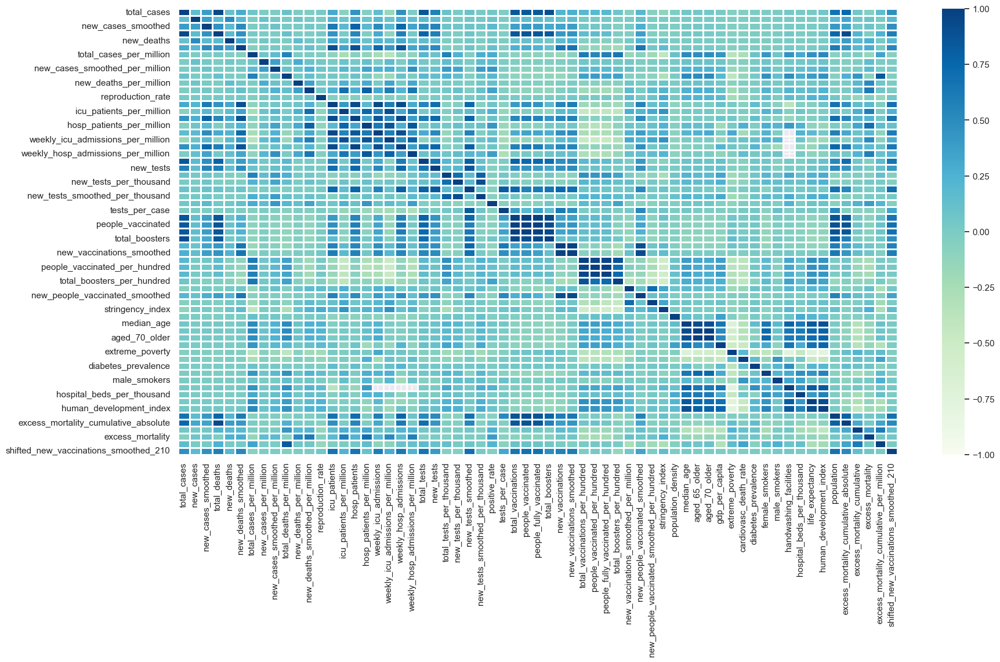

In [39]:
##Analyze data correlation
covid_df['shifted_new_vaccinations_smoothed_210'] = covid_df['new_vaccinations_smoothed'].shift(210)
covid_float = covid_df.select_dtypes(include = 'float64')
covid_float_correlation_matrix = covid_float.corr()
covid_float_styled_correlation_matrix = covid_float_correlation_matrix.style.apply(highlight_second_max)
display(covid_float_styled_correlation_matrix)

plt.figure(figsize=(20, 10))
# The font size can be passed with annot_kws
# The colors group can be passed with cmap
sb.heatmap(covid_float_correlation_matrix, vmin = -1, vmax = 1, linewidths = 1,
           annot = False, cmap = "GnBu")

### 10th **highest and lowest correlation** with regards to `new_cases_smoothed`

In [40]:
Total_cases = covid_float_correlation_matrix[['new_cases_smoothed']] 

# Sort Total_cases in descending order
Total_cases_descending = Total_cases.sort_values(by='new_cases_smoothed', ascending=False)

# Highlight the 10 highest correlations
highlighted_correlations_largest = Total_cases_descending.nlargest(20, 'new_cases_smoothed')
highlighted_correlations_smallest = Total_cases_descending.nsmallest(20, 'new_cases_smoothed')
# Print or use the highlighted_correlations as needed
display(highlighted_correlations_largest)
display(highlighted_correlations_smallest)

,new_cases_smoothed
new_cases_smoothed,1.000000
hosp_patients,0.770932
weekly_hosp_admissions,0.740555
icu_patients,0.622286
new_tests,0.550383
weekly_icu_admissions,0.507225
new_deaths_smoothed,0.500333
total_tests,0.479626
shifted_new_vaccinations_smoothed_210,0.474331
total_deaths,0.455120


,new_cases_smoothed
total_boosters_per_hundred,-0.042501
cardiovasc_death_rate,-0.032066
extreme_poverty,-0.027516
tests_per_case,-0.015209
new_people_vaccinated_smoothed_per_hundred,-0.009084
population_density,-0.008940
diabetes_prevalence,-0.003751
female_smokers,-0.003528
total_cases_per_million,-0.001752
male_smokers,0.007183


### Check days related correlation with `new_cases_smoothed` again

In [41]:
covid_df_selected = pd.concat([covid_df[['new_cases_smoothed','hosp_patients','icu_patients','new_tests','new_deaths_smoothed','shifted_new_vaccinations_smoothed_210']],new_df[['day', 'days_from_first_infection', 'days_from_first_vaccination']]], axis=1)
for column in covid_df_selected.columns:
    covid_df_selected[column] = covid_df_selected[column].astype('float64')
covid_df_selected = covid_df_selected[(covid_df_selected['day'] >= 200) & 
                                      (covid_df_selected['days_from_first_infection'] >= 200) & 
                                      (covid_df_selected['days_from_first_vaccination'] >= 200)]
covid_df_selected = covid_df_selected.dropna()
covid_df_selected_corr = covid_df_selected.corr()
covid_df_selected_corr


,new_cases_smoothed,hosp_patients,icu_patients,new_tests,new_deaths_smoothed,shifted_new_vaccinations_smoothed_210,day,days_from_first_infection,days_from_first_vaccination
new_cases_smoothed,1.000000,0.831716,0.685197,0.667397,0.675747,0.450328,0.068442,0.128628,0.091337
hosp_patients,0.831716,1.000000,0.951469,0.754611,0.879272,0.666535,-0.026687,0.043389,0.010814
icu_patients,0.685197,0.951469,1.000000,0.710563,0.889424,0.708291,-0.112225,-0.053209,-0.069333
new_tests,0.667397,0.754611,0.710563,1.000000,0.687219,0.686759,-0.097005,-0.016060,-0.063043
new_deaths_smoothed,0.675747,0.879272,0.889424,0.687219,1.000000,0.707636,-0.025338,0.033366,0.014467
shifted_new_vaccinations_smoothed_210,0.450328,0.666535,0.708291,0.686759,0.707636,1.000000,-0.001959,0.082343,0.024598
day,0.068442,-0.026687,-0.112225,-0.097005,-0.025338,-0.001959,1.000000,0.980114,0.978028
days_from_first_infection,0.128628,0.043389,-0.053209,-0.016060,0.033366,0.082343,0.980114,1.000000,0.957904
days_from_first_vaccination,0.091337,0.010814,-0.069333,-0.063043,0.014467,0.024598,0.978028,0.957904,1.000000


In [42]:
covid_df_selected = covid_df_selected.drop(['day', 'days_from_first_infection', 'days_from_first_vaccination'] , axis = 1)


 Since **day correlation and accuracy** with any  variable is very **low**, thus **dropped**

#### Thus variables chosen are `new_cases_smoothed` as desired output,`hosp_patients`,`icu_patients`,`new_tests`,`new_deaths_smoothed`,`shifted_new_vaccinations_smoothed_210`

## Visualization of correlation

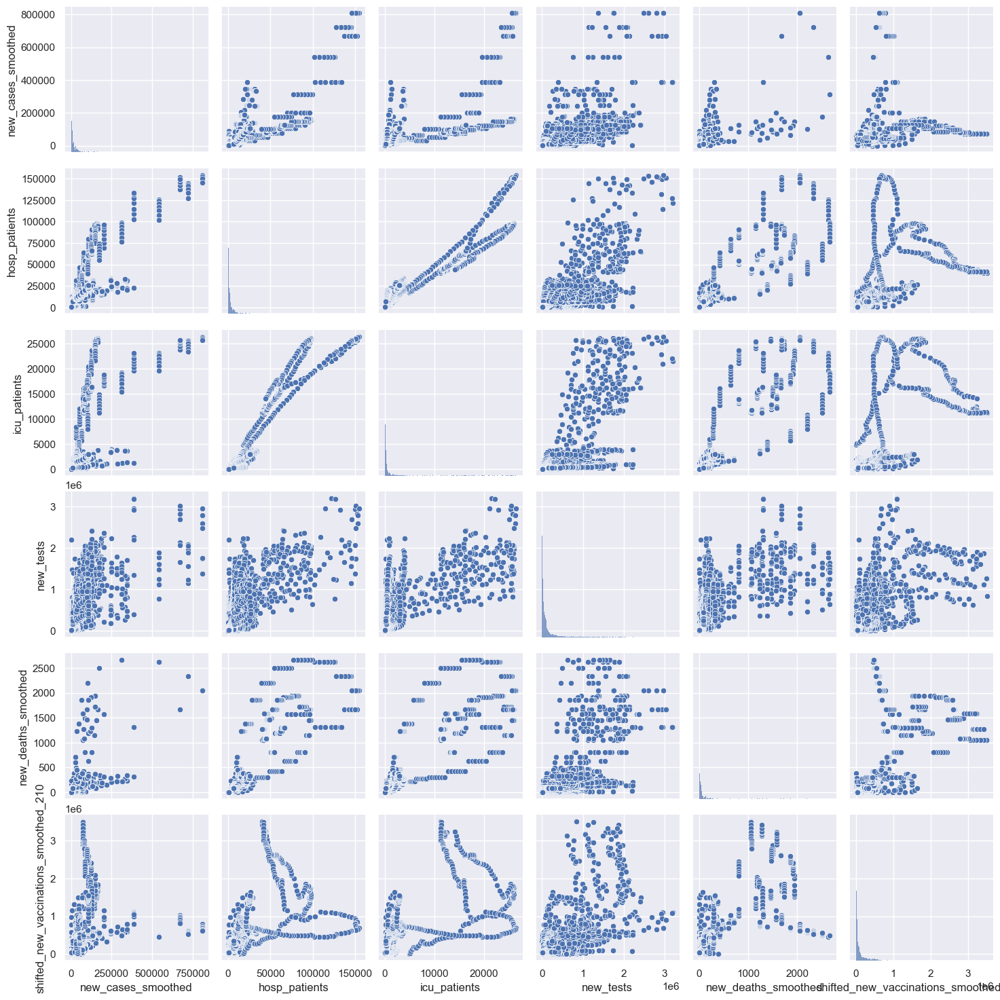

In [43]:

sb.pairplot(covid_df_selected)


from pairplot, it can be observed that for univariate regression where output = new_cases_smoothed, new_vaccinations_smoothed_210 is useful, but when it comes to other variable, it dosent make a continuous  as the data is defined as vaccination injected after 210days toward other outputs like hospital_patients and icu_patients, it has an ireggular shape which hard to define correlation

## Create General Train Test Split Data, with mode `manual` and `random`

In [44]:
def train_test_split_df(data, train_ratio, mode):
    total_rows = data.shape[0]
    train_rows = int(total_rows * train_ratio)
    
    if mode == 'random':
        # Randomly shuffle the DataFrame
        shuffled_data = data.sample(frac=1, random_state=42)  # Random state for reproducibility
        
        # Perform the random split
        train_data_random = shuffled_data[:train_rows].reset_index(drop=True)
        test_data_random = shuffled_data[train_rows:].reset_index(drop=True)
        
        return train_data_random, test_data_random
    elif mode == 'manual':
        # Perform the manual split
        train_data_manual = data[:train_rows].reset_index(drop=True)
        test_data_manual = data[train_rows:].reset_index(drop=True)
    
        return train_data_manual, test_data_manual


### Check Split Data Shape

In [45]:
train_data_random, test_data_random = train_test_split_df(covid_df_selected, train_ratio=0.75, mode = 'random')
print("Train data shape:", train_data_random.shape)
print("Test data shape:", test_data_random.shape)
display(train_data_random)
display(test_data_random)

Train data shape: (6067, 6)
Test data shape: (2023, 6)


,new_cases_smoothed,hosp_patients,icu_patients,new_tests,new_deaths_smoothed,shifted_new_vaccinations_smoothed_210
0,122.000,25.0,7.0,3551.0,0.714,1714.0
1,82.857,21.0,8.0,2499.0,0.429,973.0
2,18725.714,6560.0,938.0,79308.0,109.714,64623.0
3,10377.143,1802.0,184.0,20486.0,37.286,19921.0
4,13387.571,3120.0,804.0,83081.0,46.857,106739.0
...,...,...,...,...,...,...
6062,14118.000,772.0,132.0,116485.0,17.000,9274.0
6063,1886.857,483.0,31.0,46191.0,4.000,175554.0
6064,4207.429,967.0,39.0,12282.0,1.857,6143.0
6065,120.000,61.0,0.0,754.0,0.286,6090.0


,new_cases_smoothed,hosp_patients,icu_patients,new_tests,new_deaths_smoothed,shifted_new_vaccinations_smoothed_210
0,839.571,679.0,91.0,8054.0,6.714,23668.0
1,1695.857,257.0,98.0,16607.0,3.857,31728.0
2,3310.714,2502.0,254.0,106282.0,28.286,117571.0
3,17034.857,7557.0,1921.0,161595.0,101.429,58330.0
4,10180.286,1999.0,83.0,10233.0,47.286,64960.0
...,...,...,...,...,...,...
2018,12263.143,1140.0,66.0,65860.0,20.000,91170.0
2019,1636.571,2199.0,79.0,27290.0,24.429,26587.0
2020,7669.143,3079.0,184.0,10612.0,23.429,13877.0
2021,131676.571,8615.0,851.0,1347215.0,122.143,565376.0


# a)Univariate Linear Regression

## Try `Train Data Manual`

### Check Coefficient and Intercept

In [46]:
train_data_manual, test_data_manual = train_test_split_df(covid_df_selected, train_ratio=0.75, mode = 'manual')
print("Train data shape:", train_data_manual.shape)
print("Test data shape:", test_data_manual.shape)
display(train_data_manual)
display(test_data_manual)

Train data shape: (6067, 6)
Test data shape: (2023, 6)


,new_cases_smoothed,hosp_patients,icu_patients,new_tests,new_deaths_smoothed,shifted_new_vaccinations_smoothed_210
0,1757.286,1539.0,306.0,203725.0,11.000,2769.0
1,1757.286,1518.0,302.0,194751.0,11.000,3447.0
2,1757.286,1530.0,295.0,221979.0,11.000,5536.0
3,1757.286,1508.0,301.0,229864.0,11.000,5872.0
4,1757.286,1529.0,298.0,215327.0,11.000,5996.0
...,...,...,...,...,...,...
6062,6433.286,599.0,143.0,14675.0,7.286,9310.0
6063,6433.286,601.0,136.0,18853.0,7.286,9553.0
6064,10532.857,608.0,136.0,11123.0,12.000,9341.0
6065,10532.857,619.0,135.0,17012.0,12.000,9477.0


,new_cases_smoothed,hosp_patients,icu_patients,new_tests,new_deaths_smoothed,shifted_new_vaccinations_smoothed_210
0,10532.857,656.0,125.0,19729.0,12.000,8850.0
1,10532.857,684.0,124.0,22652.0,12.000,8015.0
2,10532.857,693.0,130.0,20672.0,12.000,10061.0
3,10532.857,698.0,127.0,17961.0,12.000,9706.0
4,14118.000,711.0,133.0,11082.0,17.000,9706.0
...,...,...,...,...,...,...
2018,105863.429,26042.0,2999.0,695355.0,326.286,1496507.0
2019,105863.429,26413.0,2994.0,603464.0,326.286,1494376.0
2020,105863.429,26235.0,3043.0,472612.0,326.286,1521776.0
2021,105863.429,26221.0,2996.0,406474.0,326.286,1534416.0


In [47]:
from sklearn.linear_model import LinearRegression
import pandas as pd

# Create a list to store the regression results
regressions_train_manual = []

# Loop through each column in the DataFrame (excluding 'new_cases_smoothed')
for column in train_data_manual:
    if column != 'new_cases_smoothed':
        # Extract the independent variable (X) and dependent variable (y)
        X = covid_df_selected[[column]]
        y = covid_df_selected['new_cases_smoothed']
        
        # Fit a linear regression model
        model = LinearRegression()
        model.fit(X, y)
        
        # Store the regression coefficients and intercept in a DataFrame
        regression_result = pd.DataFrame({
            'Variable': column,
            'Coefficient': model.coef_[0],
            'Intercept': model.intercept_,
        }, index=[0])
        
        # Append the regression result to the list
        regressions_train_manual.append(regression_result)

# Combine all regression results into a single DataFrame
combined_regression_train_manual_results = pd.concat(regressions_train_manual, ignore_index=True)

# Print or use the combined_regression_results as needed
display(combined_regression_train_manual_results)


,Variable,Coefficient,Intercept
0,hosp_patients,3.294398,3182.181759
1,icu_patients,12.308314,10063.432107
2,new_tests,0.102158,1309.803947
3,new_deaths_smoothed,134.639456,9018.358771
4,shifted_new_vaccinations_smoothed_210,0.073284,9415.390772


### Check linear regression for any two variable

In [48]:

# Assuming train_data_manual is your DataFrame
# 'new_cases_smoothed' as the predictor and 'hosp_patients' as the output
X = train_data_manual[['new_cases_smoothed']]
y = train_data_manual['hosp_patients']

# Create and fit the linear regression model
linreg = LinearRegression()
linreg.fit(X, y)
R2 = linreg.score(X,y)
print(R2)

0.6046116622516823


### Generate a general linear regression function for any data

In [49]:
def RegressionPlot_Linear(data, train_x, train_y, remove_outlier=False):
    # Remove outliers if specified
    if remove_outlier:
        Q1 = data[train_x].quantile(0.25)
        Q3 = data[train_x].quantile(0.75)
        IQR = Q3 - Q1
        data = data[(data[train_x] >= Q1 - 1.5 * IQR) & (data[train_x] <= Q3 + 1.5 * IQR)]
        '''
        # Fit a linear regression model
        model = LinearRegression()
        model.fit(data[train_x].values.reshape(-1, 1), data[train_y])
        
        # Calculate the regression line
        x_values = data[train_x].values.reshape(-1, 1)  # Reshape to 2D array
        y_values = model.predict(data[[train_x]])
    '''
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(data[[train_x]], data[train_y])
    
    # Calculate the regression line
    x_values = data[[train_x]]  # Reshape to 2D array
    y_values = model.predict(data[[train_x]])
    
    # Plot the original data and regression line
    if data.equals(train_data_manual) or data.equals(train_data_random):
        data_label = 'train_data_manual' if data.equals(train_data_manual) else 'train_data_random'
        plt.figure(figsize=(12, 6))
        plt.scatter(data[train_x], data[train_y], label= data_label) 
        plt.plot(x_values, y_values, 'r-', label='Train Regression Line', linewidth=2)
        plt.xlabel(train_x)
        plt.ylabel(train_y)
        plt.title(f'{train_x} vs. {train_y}')
        plt.legend()
        plt.show()
        r2_train = model.score(data[[train_x]], data[train_y])
        print(f'r2_train is {r2_train}')
        return r2_train
        
    elif data.equals(test_data_manual) or data.equals(test_data_random):
        data_label = 'test_data_manual' if data.equals(test_data_manual) else 'test_data_random'
        plt.figure(figsize=(12, 6))
        plt.scatter(data[train_x], data[train_y], label=data_label, color='red') 
        plt.scatter(x_values, y_values, label='Test Prediction Line', color='green')
        plt.xlabel(train_x)
        plt.ylabel(train_y)
        plt.title(f'{train_x} vs. {train_y}')
        plt.legend()
        plt.show()
        r2_test = model.score(data[[train_x]], data[train_y])
        print(f'r2_test is {r2_test}')
        return r2_test



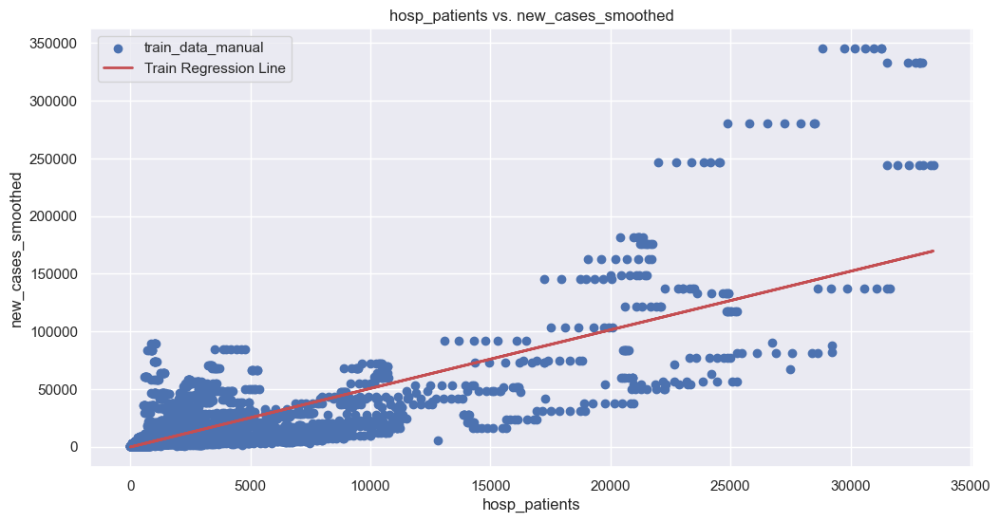

r2_train is 0.6046116622516822


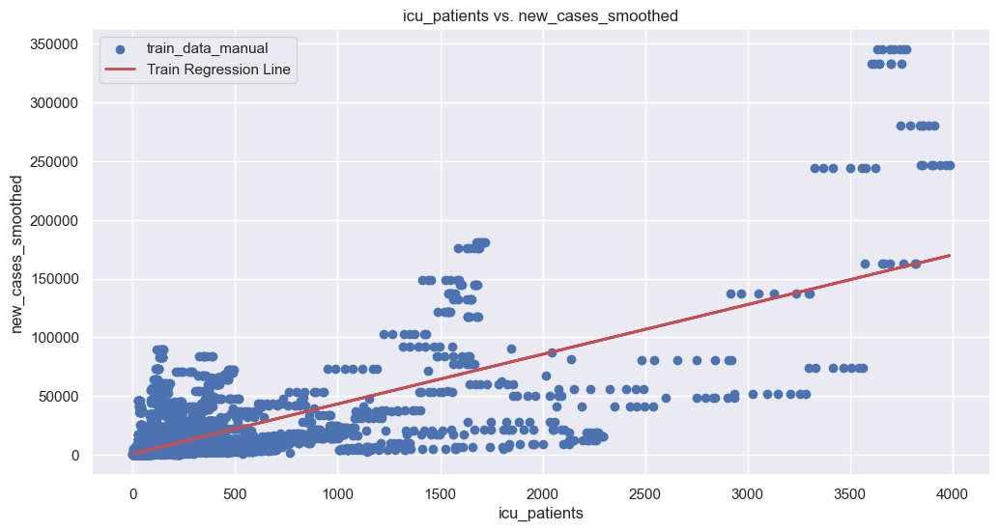

r2_train is 0.5040930829139505


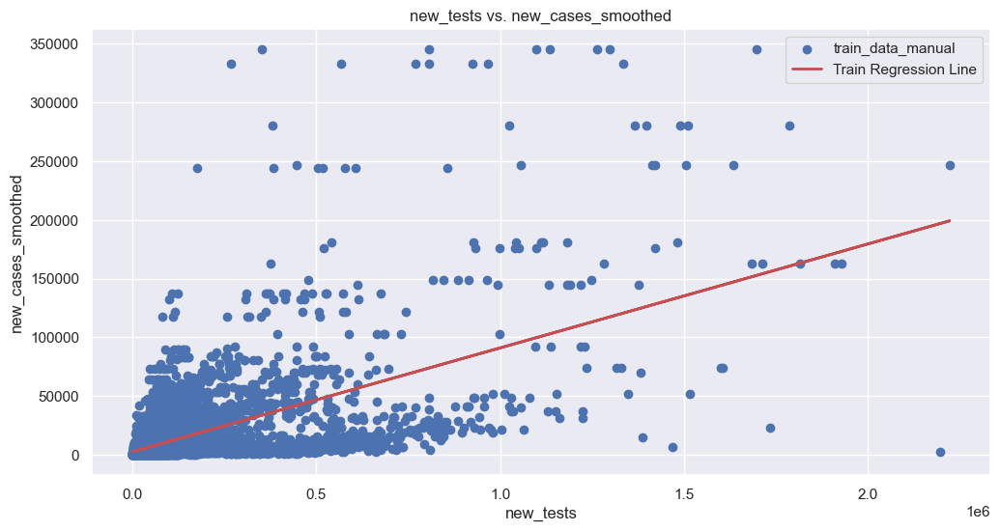

r2_train is 0.35372207819814927


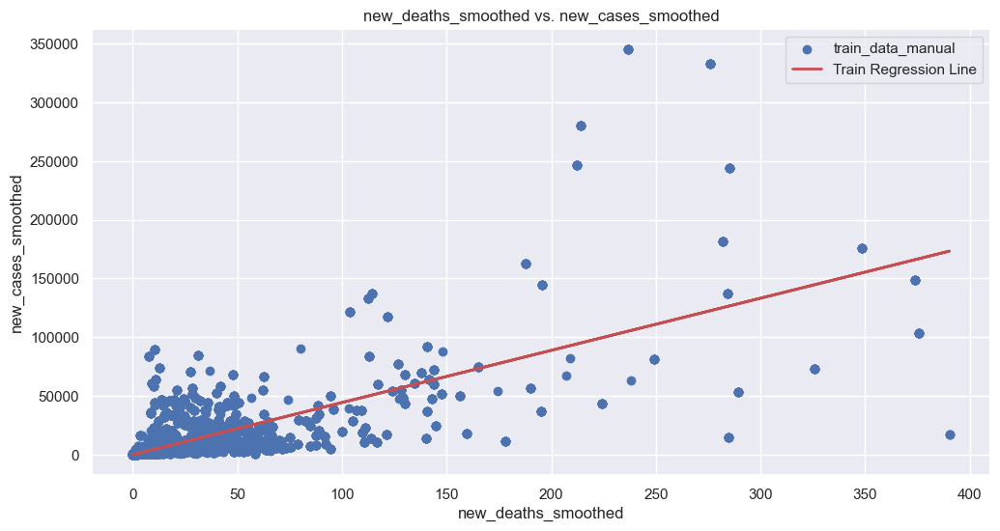

r2_train is 0.49055047920514816


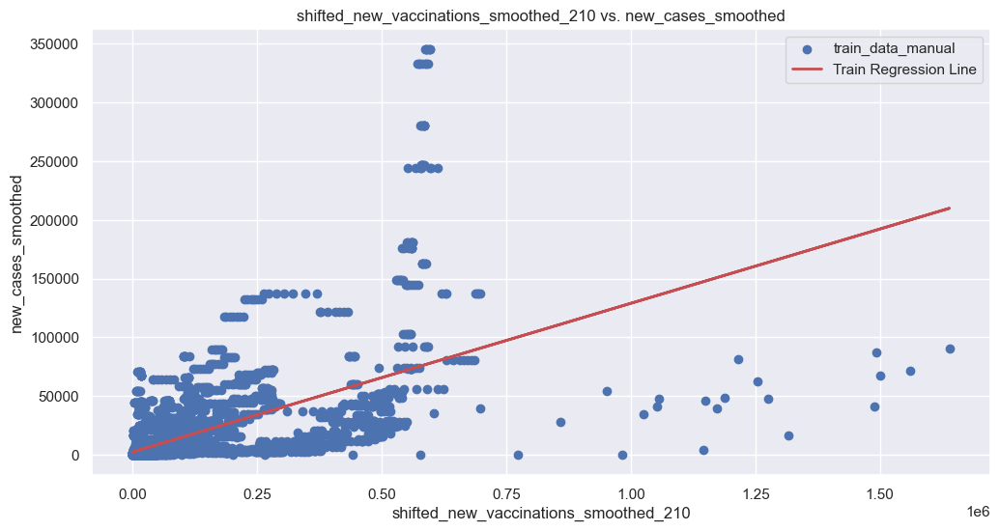

r2_train is 0.3512872333242074


,Variable,R-squared
0,hosp_patients,0.604612
1,icu_patients,0.504093
2,new_tests,0.353722
3,new_deaths_smoothed,0.490550
4,shifted_new_vaccinations_smoothed_210,0.351287


In [50]:
# Dictionary to store R-squared values for each variable and degree
r2_train_manual_lin_dict = {'Variable': [], 'R-squared': []}

for x_columns in train_data_manual.columns: 
    if x_columns != 'new_cases_smoothed':
        r2_train = RegressionPlot_Linear(train_data_manual, x_columns, 'new_cases_smoothed', remove_outlier=False)
        r2_train_manual_lin_dict['Variable'].append(x_columns)
        r2_train_manual_lin_dict['R-squared'].append(r2_train)

# Create a DataFrame from the dictionary
r2_train_manual_lin_df = pd.DataFrame(r2_train_manual_lin_dict)
display(r2_train_manual_lin_df)


## Comparison r squared value and variability of manual data with random data

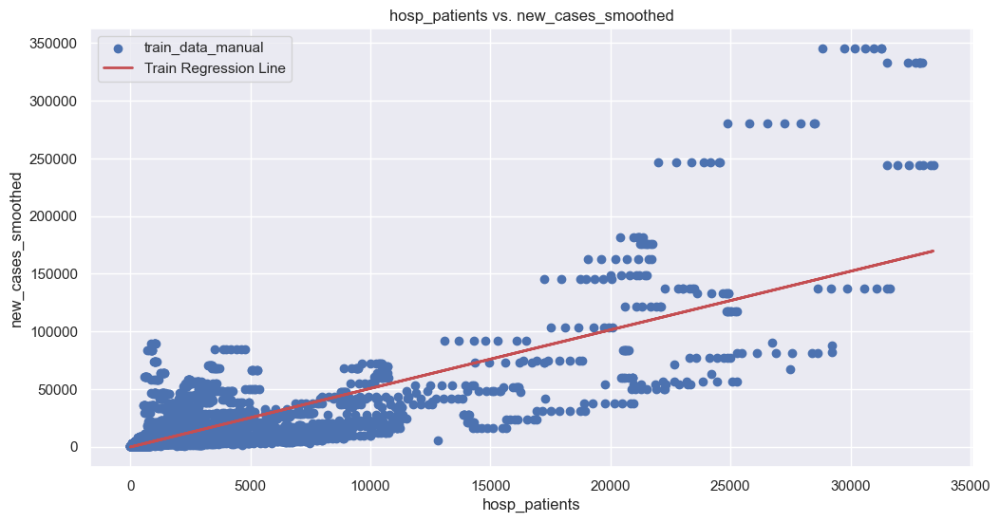

r2_train is 0.6046116622516822


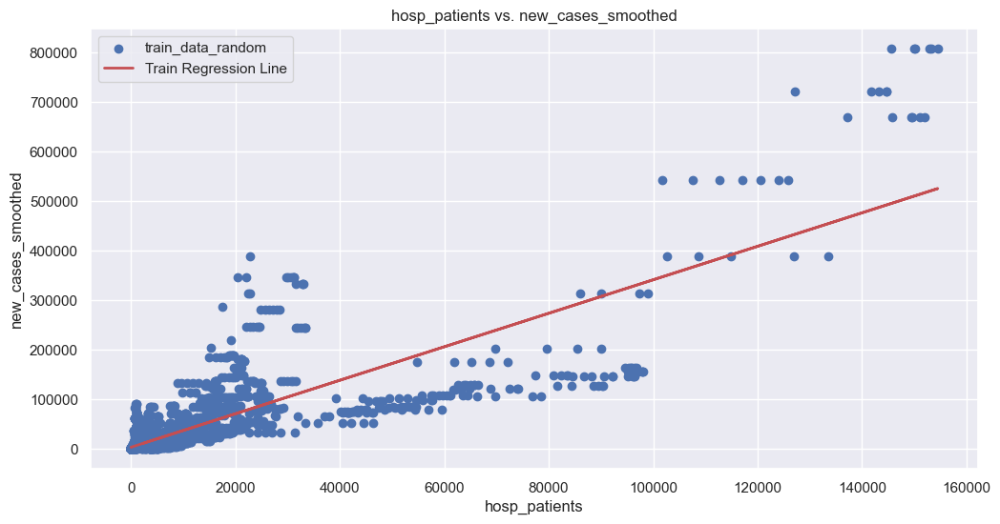

r2_train is 0.6980573076749363


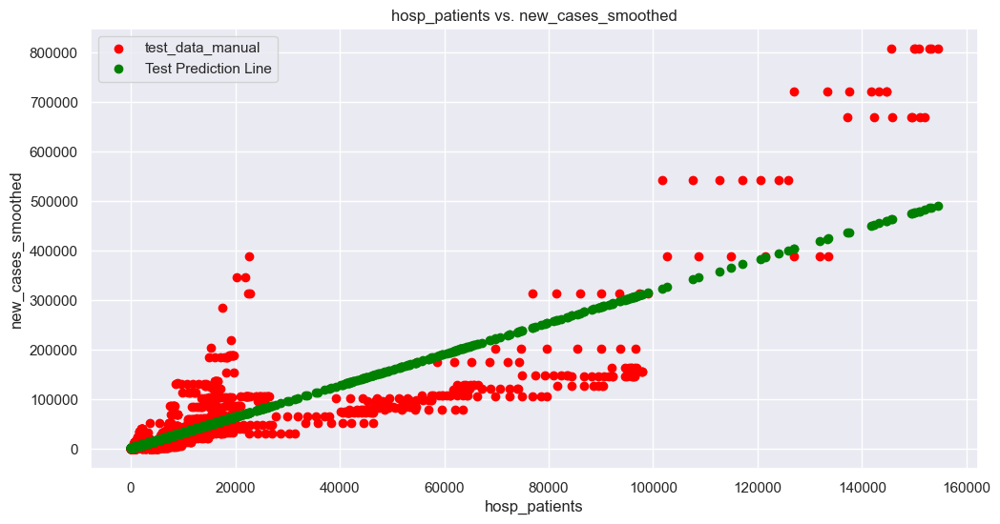

r2_test is 0.7253065981703797


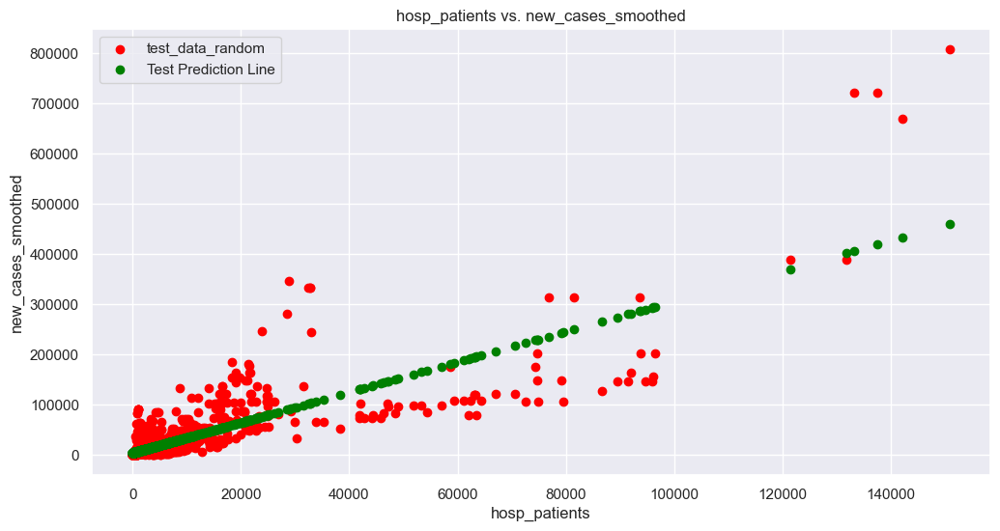

r2_test is 0.6738536518346545


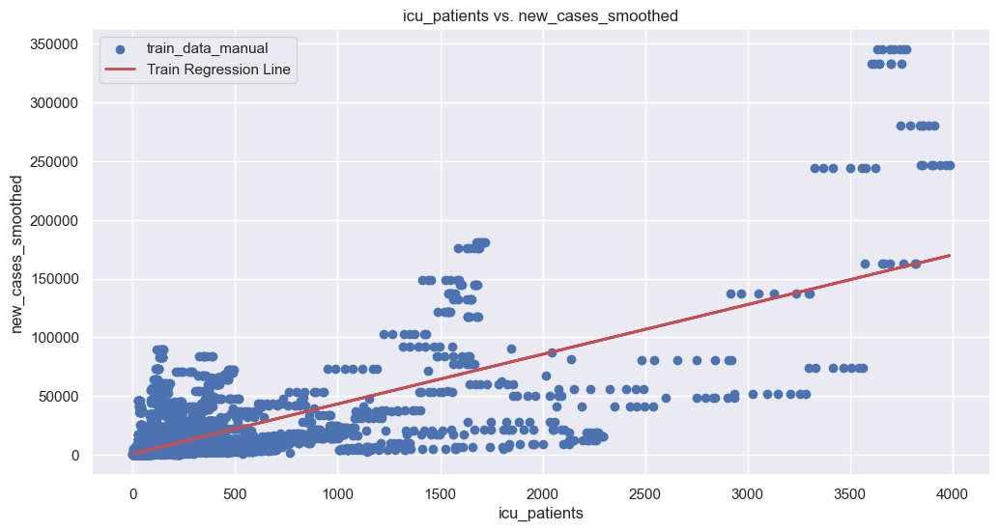

r2_train is 0.5040930829139505


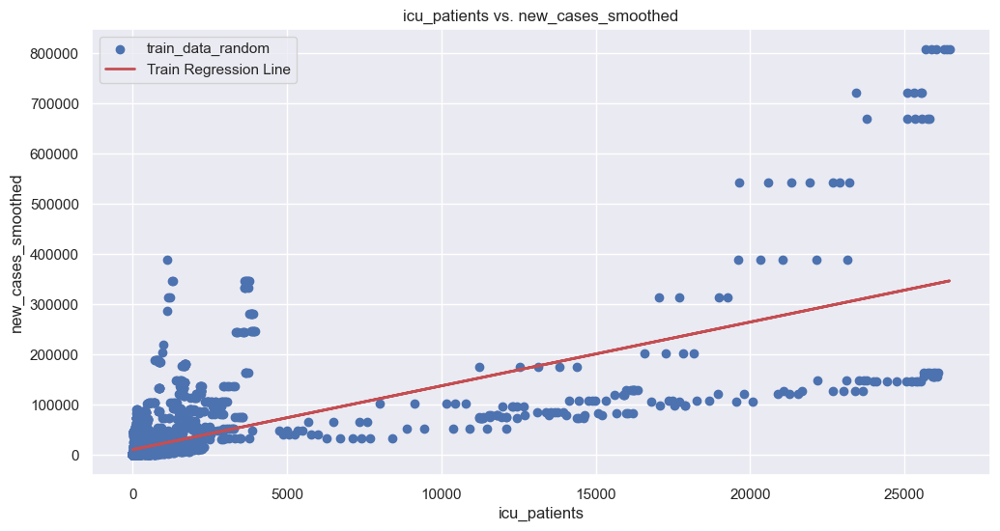

r2_train is 0.4739170270228349


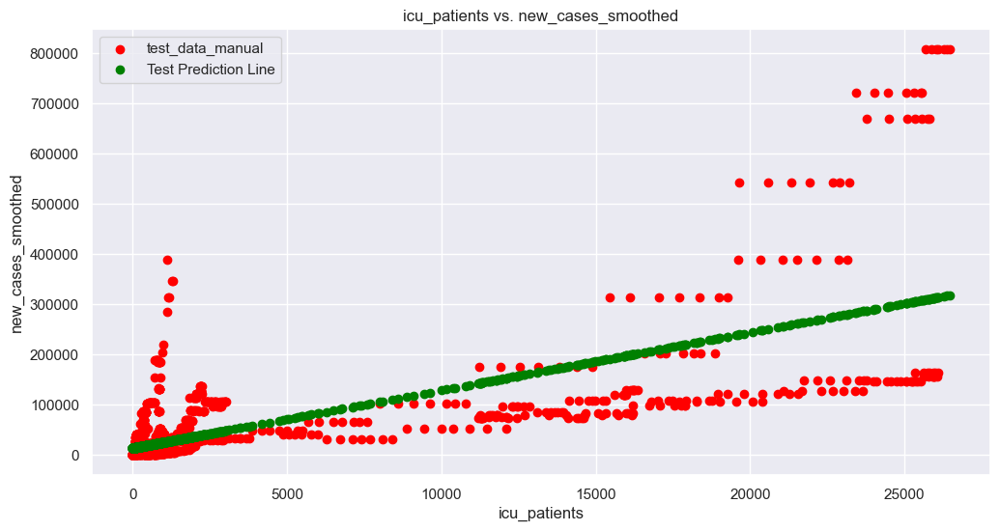

r2_test is 0.5052026471274971


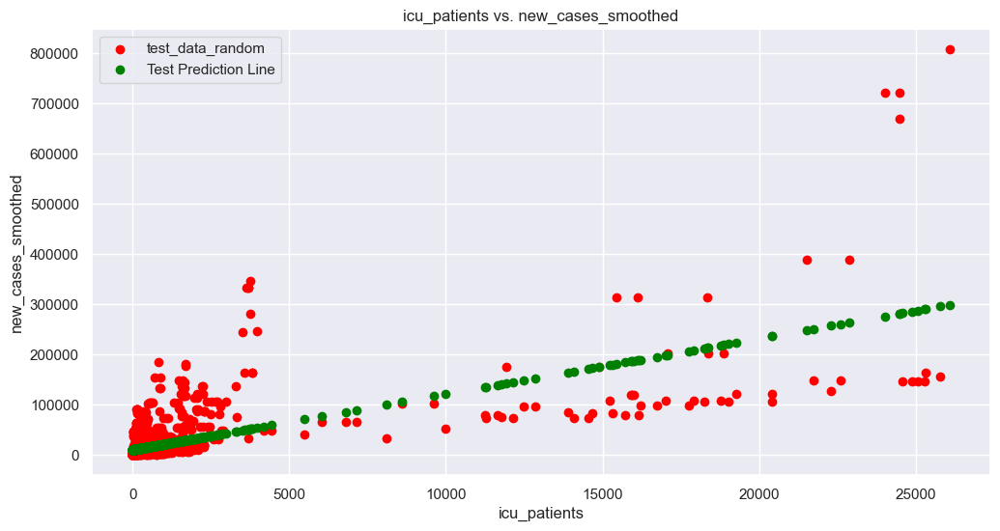

r2_test is 0.459496528627348


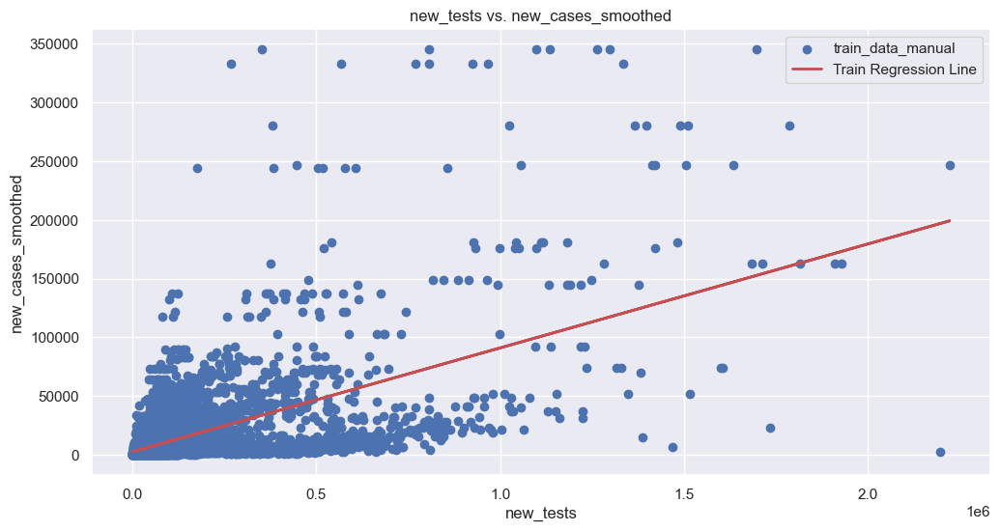

r2_train is 0.35372207819814927


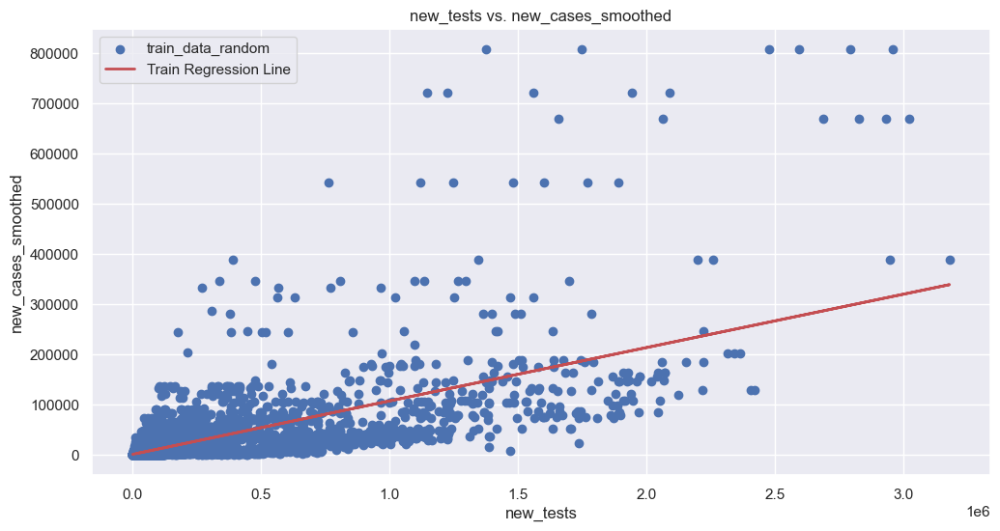

r2_train is 0.4510640353628981


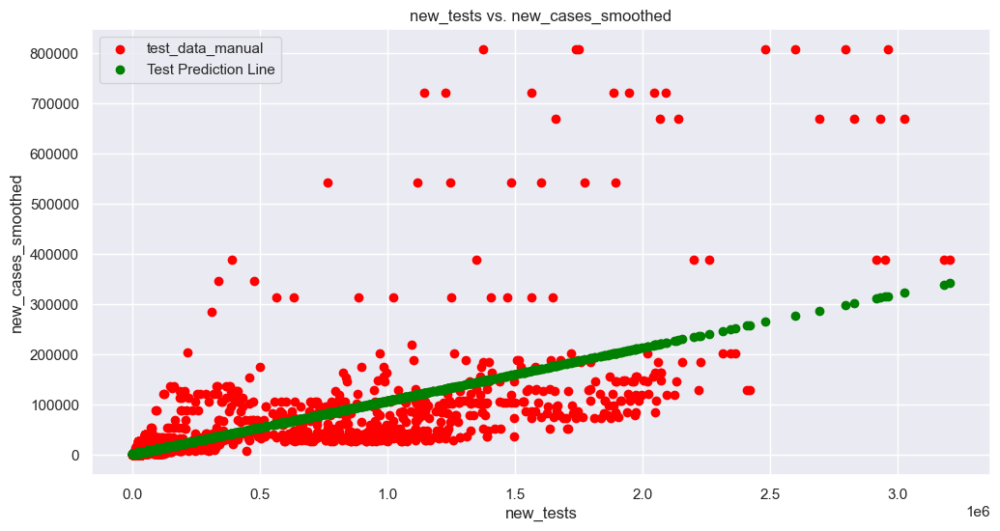

r2_test is 0.43945623260166833


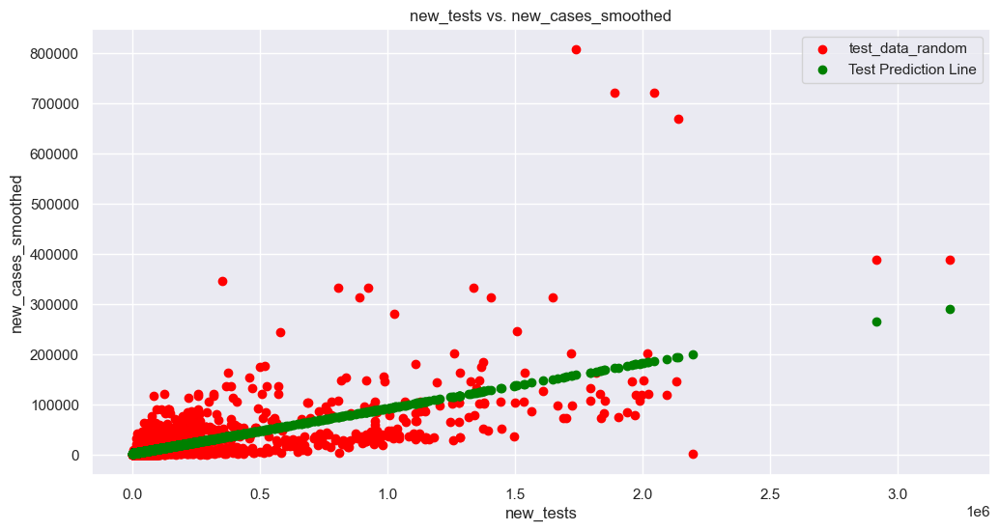

r2_test is 0.4330620152499707


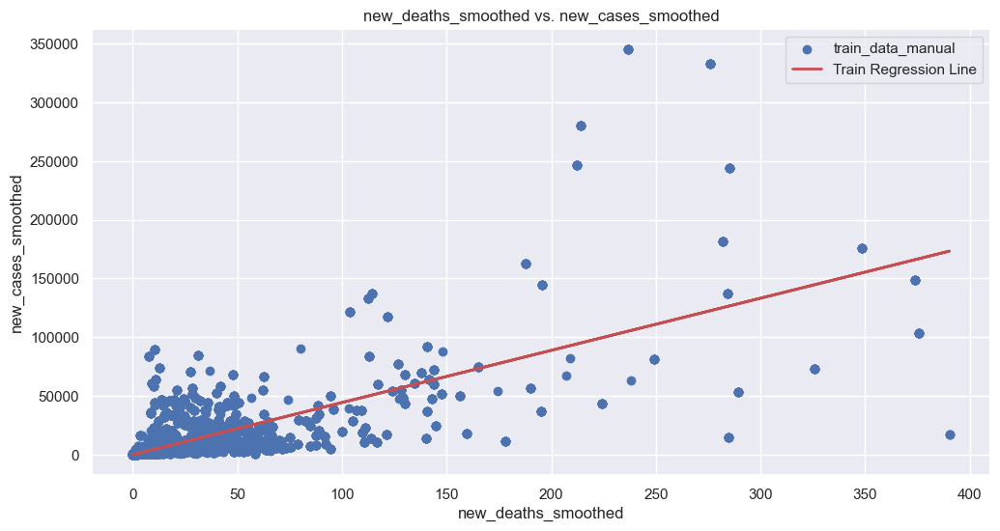

r2_train is 0.49055047920514816


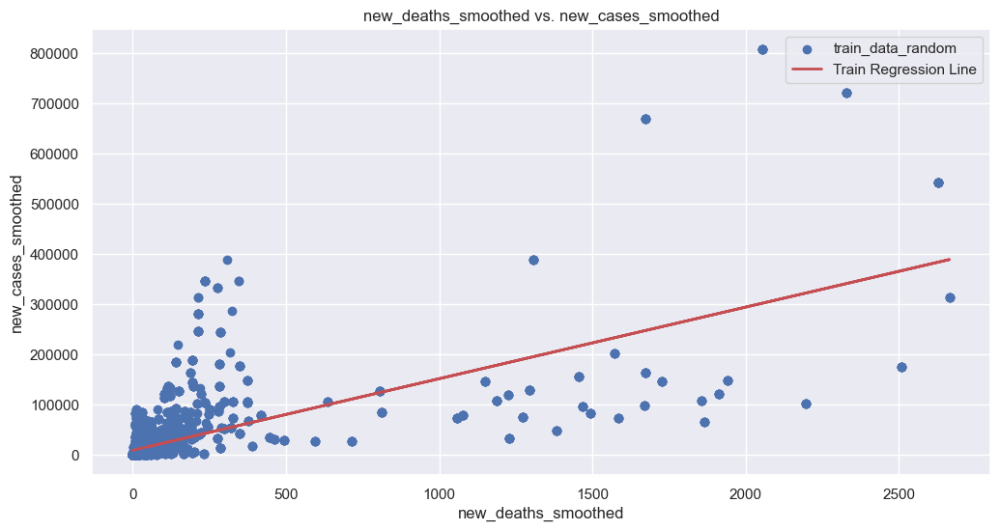

r2_train is 0.4689237266494657


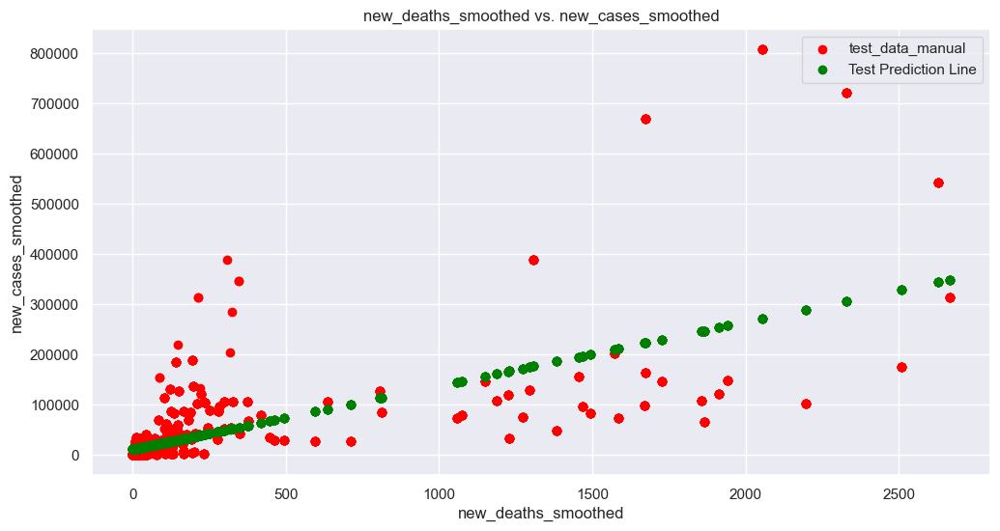

r2_test is 0.4860484678928143


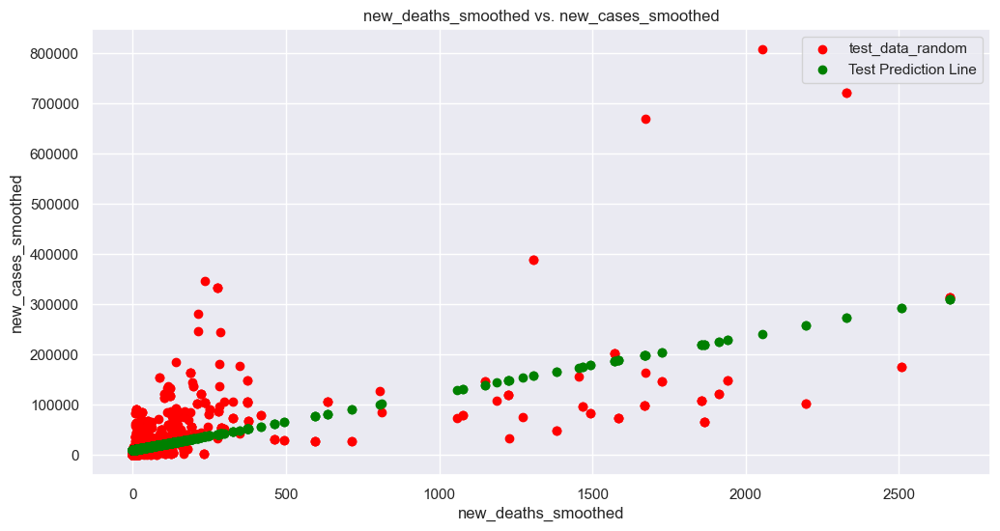

r2_test is 0.4294037840005719


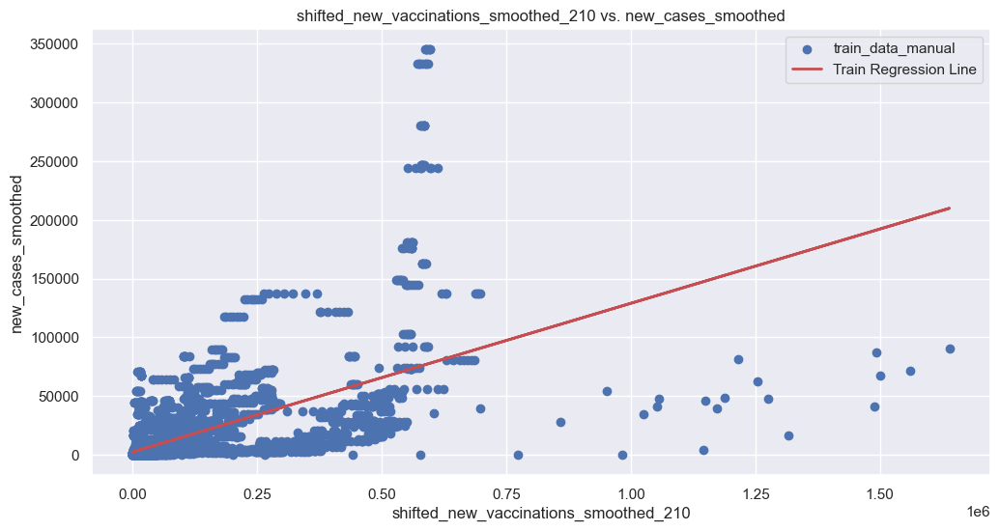

r2_train is 0.3512872333242074


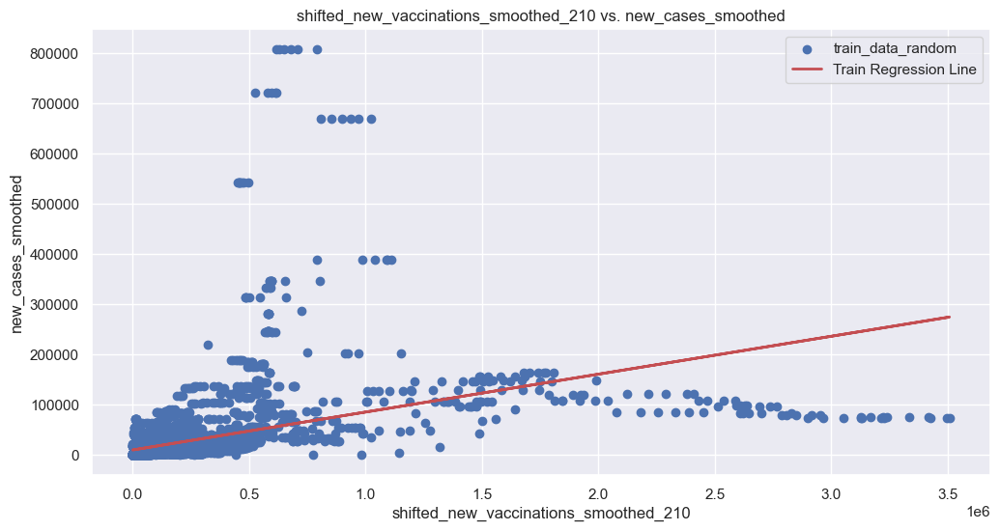

r2_train is 0.19839572493937485


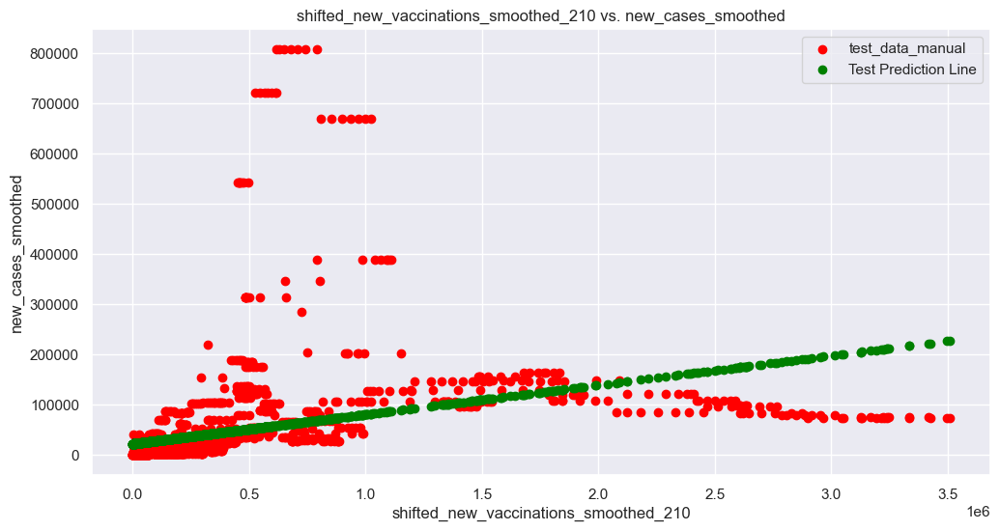

r2_test is 0.1360370702427266


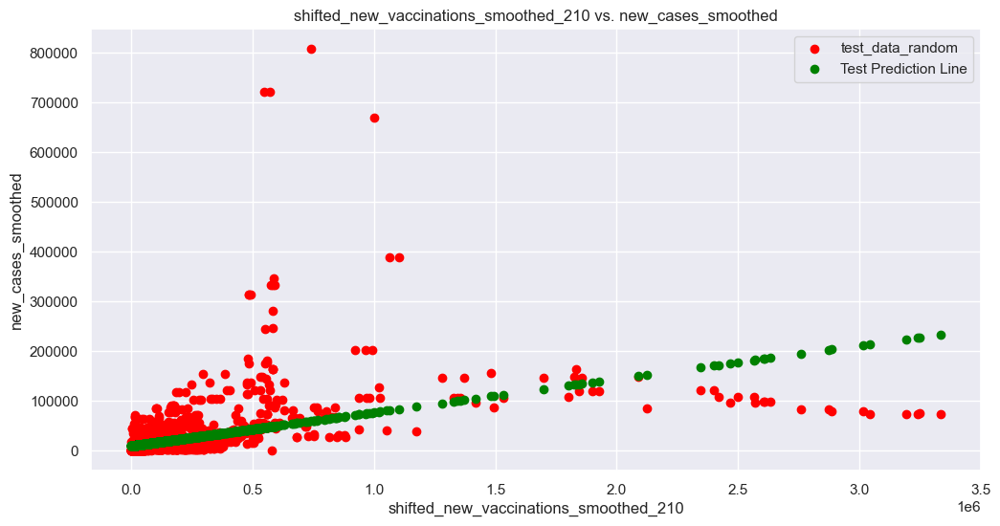

r2_test is 0.22312756615570173


In [51]:
r2_train_manual_lin_dict = {'Variable': [], 'R-squared_train_manual': []}
r2_train_random_lin_dict = {'Variable': [], 'R-squared_train_random': []}
r2_test_manual_lin_dict = {'Variable': [], 'R-squared_test_manual': []}
r2_test_random_lin_dict = {'Variable': [], 'R-squared_test_random': []}

for x_columns in train_data_manual.columns: 
    if x_columns != 'new_cases_smoothed':
        # Calculate R-squared values for train data manual and random
        r2_train_manual = RegressionPlot_Linear(train_data_manual, x_columns, 'new_cases_smoothed', remove_outlier=False)
        r2_train_random = RegressionPlot_Linear(train_data_random, x_columns, 'new_cases_smoothed', remove_outlier=False)
        
        # Calculate R-squared values for test data manual and random
        r2_test_manual = RegressionPlot_Linear(test_data_manual, x_columns, 'new_cases_smoothed', remove_outlier=False)
        r2_test_random = RegressionPlot_Linear(test_data_random, x_columns, 'new_cases_smoothed', remove_outlier=False)
        
        # Append R-squared values to the dictionaries
        r2_train_manual_lin_dict['Variable'].append(x_columns)
        r2_train_manual_lin_dict['R-squared_train_manual'].append(r2_train_manual)
        
        r2_train_random_lin_dict['Variable'].append(x_columns)
        r2_train_random_lin_dict['R-squared_train_random'].append(r2_train_random)
        
        r2_test_manual_lin_dict['Variable'].append(x_columns)
        r2_test_manual_lin_dict['R-squared_test_manual'].append(r2_test_manual)
        
        r2_test_random_lin_dict['Variable'].append(x_columns)
        r2_test_random_lin_dict['R-squared_test_random'].append(r2_test_random)

# Create DataFrames
r2_train_manual_lin_df = pd.DataFrame(r2_train_manual_lin_dict)
r2_train_random_lin_df = pd.DataFrame(r2_train_random_lin_dict)
r2_test_manual_lin_df = pd.DataFrame(r2_test_manual_lin_dict)
r2_test_random_lin_df = pd.DataFrame(r2_test_random_lin_dict)




In [52]:
### Concatenate the DataFrames along the rows with inner join
comparison_df = pd.concat([r2_train_manual_lin_df, r2_train_random_lin_df, r2_test_manual_lin_df, r2_test_random_lin_df], axis=1, join='inner')

# Drop the 'Variable' column from all DataFrames
comparison_df = comparison_df.drop('Variable', axis=1)

# Set the 'Variable' list as the index
Variable = ['hosp_patients', 'icu_patients', 'new_tests', 'new_deaths_smoothed', 'shifted_new_vaccinations_smoothed_210']
comparison_df.index = Variable

# Display the concatenated DataFrame
display(comparison_df)


,R-squared_train_manual,R-squared_train_random,R-squared_test_manual,R-squared_test_random
hosp_patients,0.604612,0.698057,0.725307,0.673854
icu_patients,0.504093,0.473917,0.505203,0.459497
new_tests,0.353722,0.451064,0.439456,0.433062
new_deaths_smoothed,0.490550,0.468924,0.486048,0.429404
shifted_new_vaccinations_smoothed_210,0.351287,0.198396,0.136037,0.223128


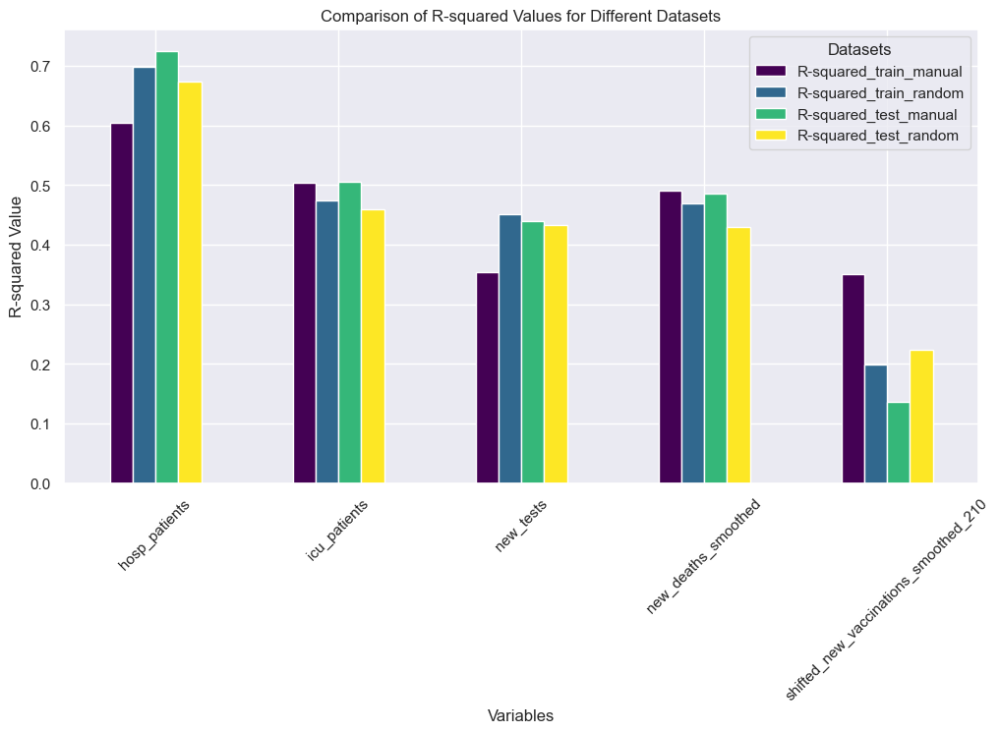

In [53]:
comparison_df
# Plot the bar chart
ax = comparison_df.plot(kind='bar', figsize=(12, 6), colormap='viridis')
ax.set_xlabel('Variables')
ax.set_ylabel('R-squared Value')
ax.set_title('Comparison of R-squared Values for Different Datasets')
plt.xticks(rotation=45)
plt.legend(title='Datasets')
plt.show()

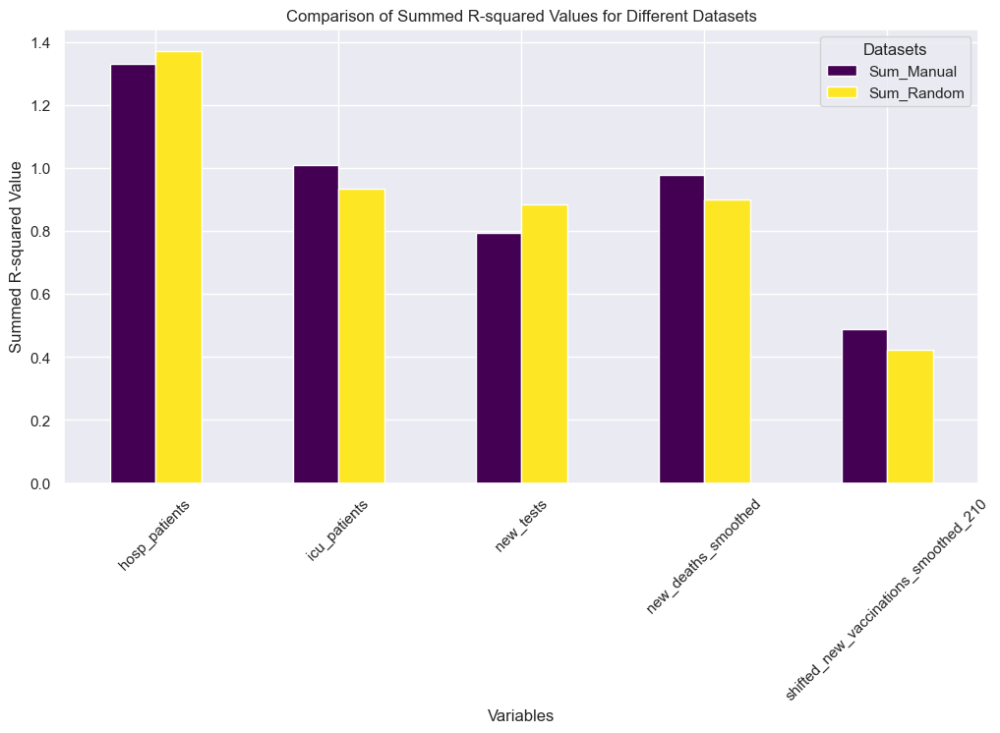

In [54]:
# Summing up columns 1 and 3, and columns 2 and 4
comparison_df['Sum_Manual'] = comparison_df.iloc[:, [0, 2]].sum(axis=1)
comparison_df['Sum_Random'] = comparison_df.iloc[:, [1, 3]].sum(axis=1)

# Plotting the updated bar chart
ax = comparison_df[['Sum_Manual', 'Sum_Random']].plot(kind='bar', figsize=(12, 6), colormap='viridis')
ax.set_xlabel('Variables')
ax.set_ylabel('Summed R-squared Value')
ax.set_title('Comparison of Summed R-squared Values for Different Datasets')
plt.xticks(rotation=45)
plt.legend(title='Datasets')
plt.show()


Even though three variables show a **higher r squared value in manual seperation data**, we decided to use **random data** as through further analysis in **multivariate regression** with variables take turns as output, random data show **lesser variablityZ** and **fairer representation** of data spread.

## train data random for each variable versus new cases smoothed (Linear Regression)

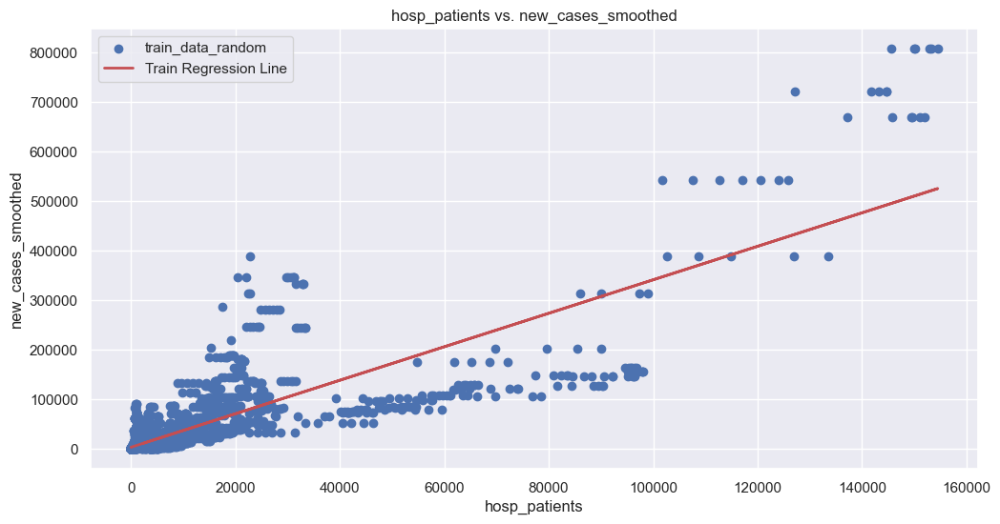

r2_train is 0.6980573076749363
for new_cases_smoothed against hosp_patients


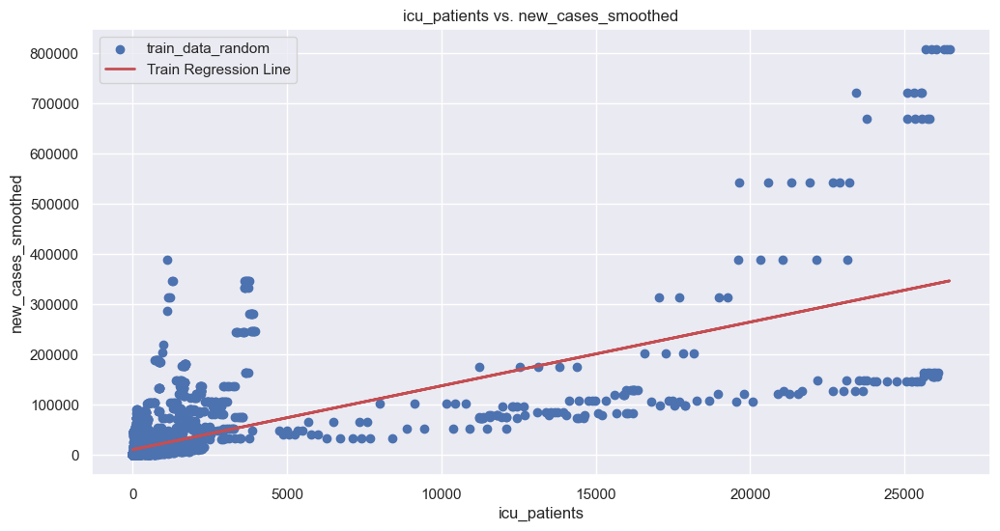

r2_train is 0.4739170270228349
for new_cases_smoothed against icu_patients


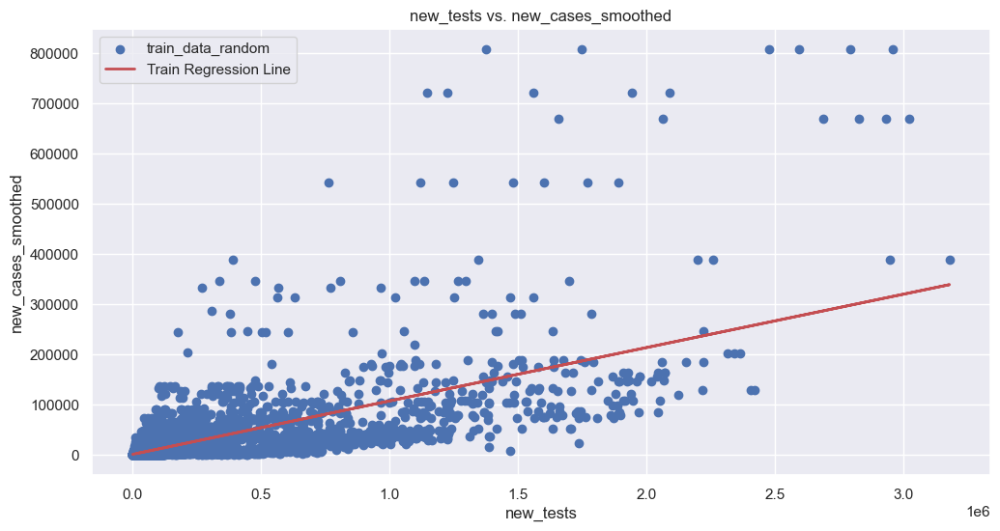

r2_train is 0.4510640353628981
for new_cases_smoothed against new_tests


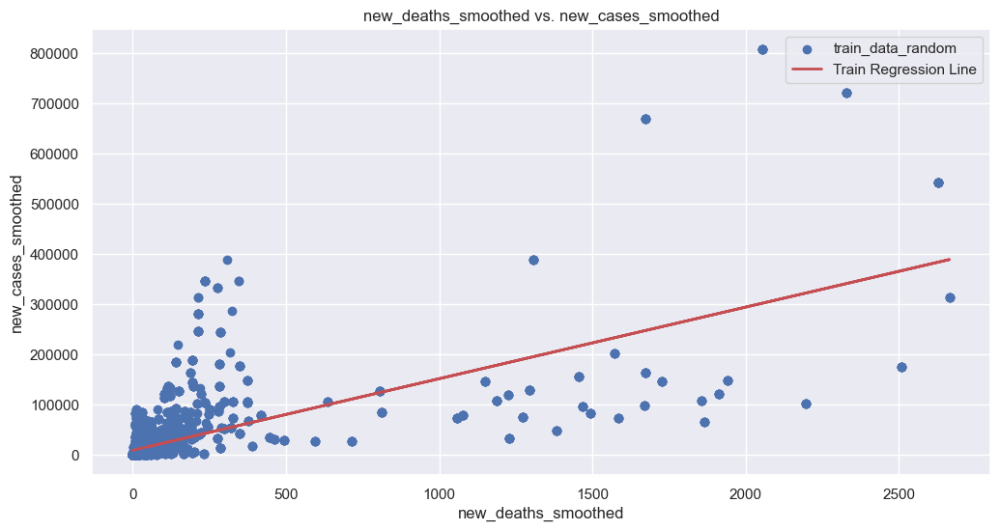

r2_train is 0.4689237266494657
for new_cases_smoothed against new_deaths_smoothed


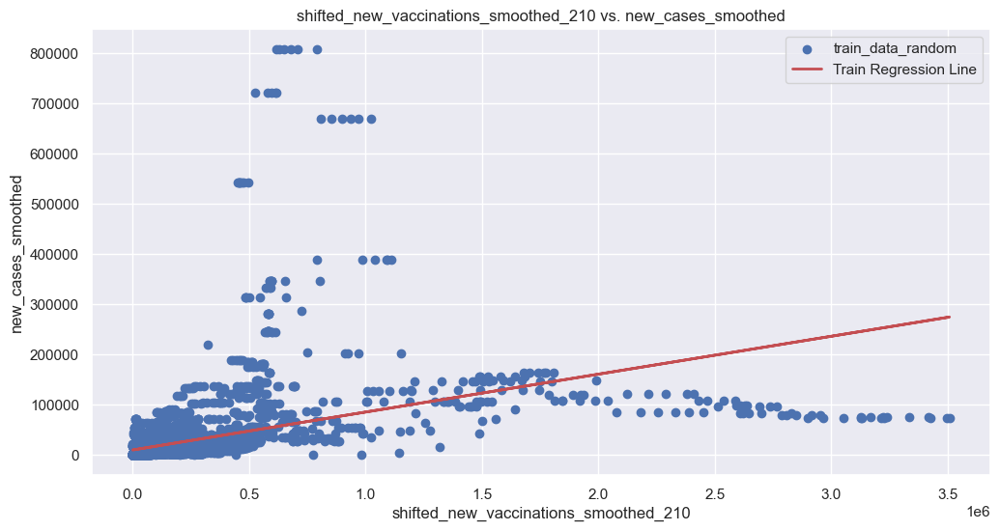

r2_train is 0.19839572493937485
for new_cases_smoothed against shifted_new_vaccinations_smoothed_210


,Variable,R-squared_train_random
0,hosp_patients,0.698057
1,icu_patients,0.473917
2,new_tests,0.451064
3,new_deaths_smoothed,0.468924
4,shifted_new_vaccinations_smoothed_210,0.198396


In [55]:
r2_train_random_lin_dict = {'Variable': [], 'R-squared_train_random': []}

for x_columns in train_data_random.columns:
    if x_columns != 'new_cases_smoothed':
        r2_train = RegressionPlot_Linear(train_data_random, x_columns, 'new_cases_smoothed', remove_outlier=False)
        print(f'for new_cases_smoothed against {x_columns}')
        r2_train_random_lin_dict['Variable'].append(x_columns)
        r2_train_random_lin_dict['R-squared_train_random'].append(r2_train)

# Create a DataFrame from the dictionary
r2_train_random_lin_df = pd.DataFrame(r2_train_random_lin_dict)
display(r2_train_random_lin_df)


## test data random for each variable versus new cases smoothed (Linear Regression)

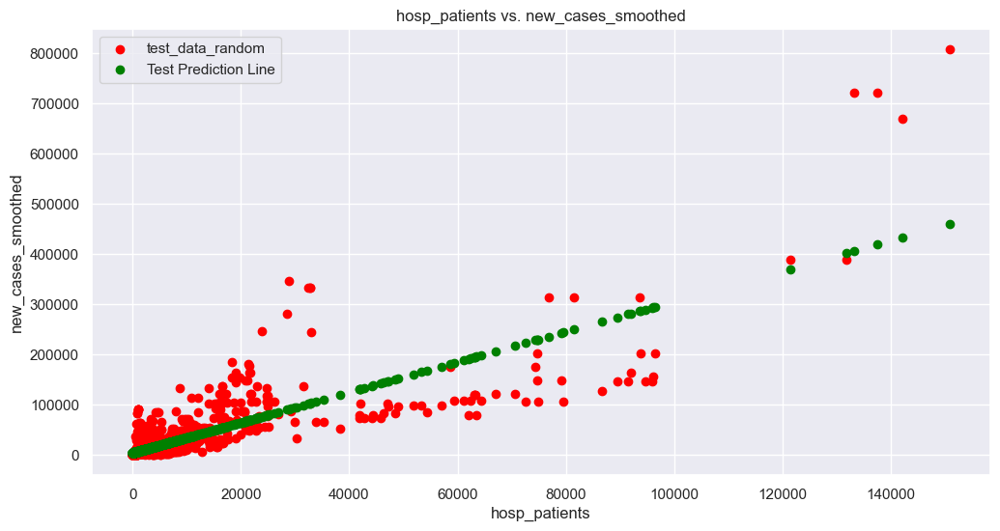

r2_test is 0.6738536518346545
for new_cases_smoothed against hosp_patients


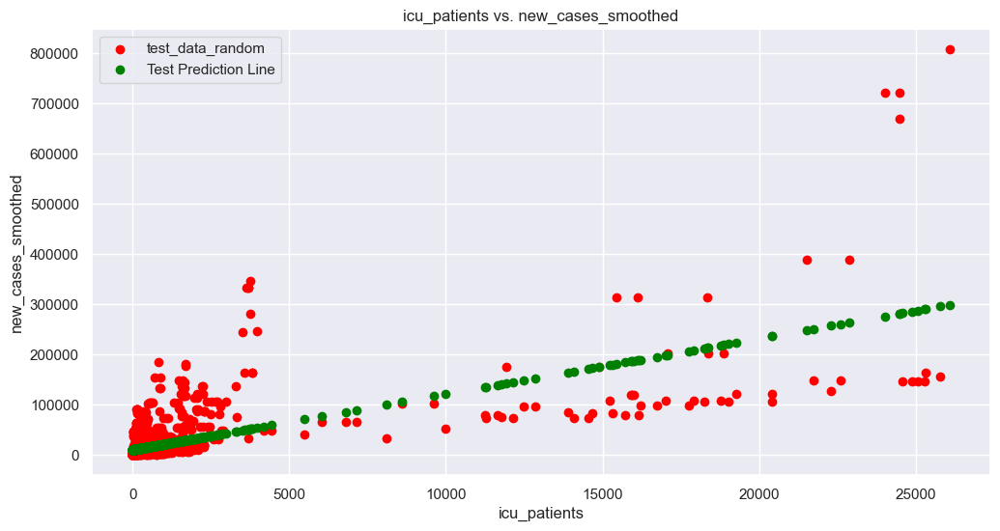

r2_test is 0.459496528627348
for new_cases_smoothed against icu_patients


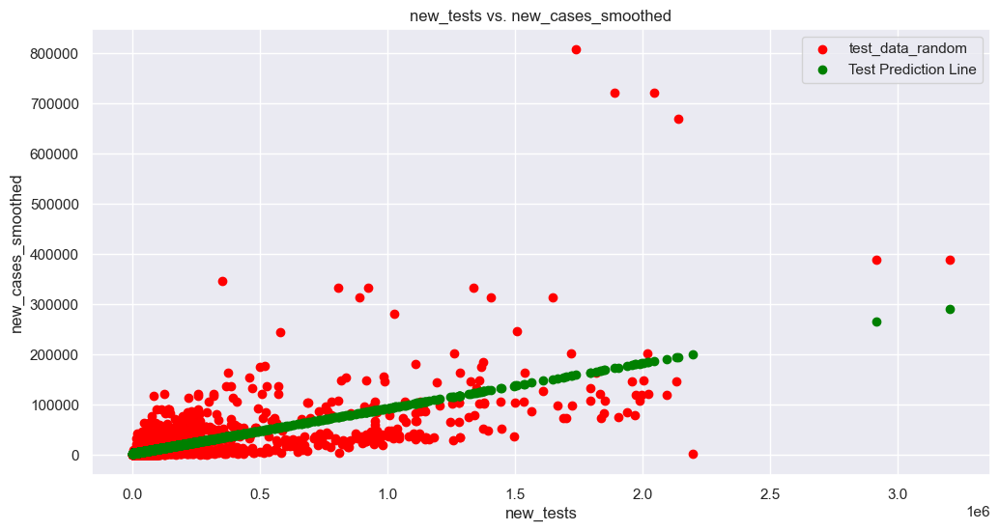

r2_test is 0.4330620152499707
for new_cases_smoothed against new_tests


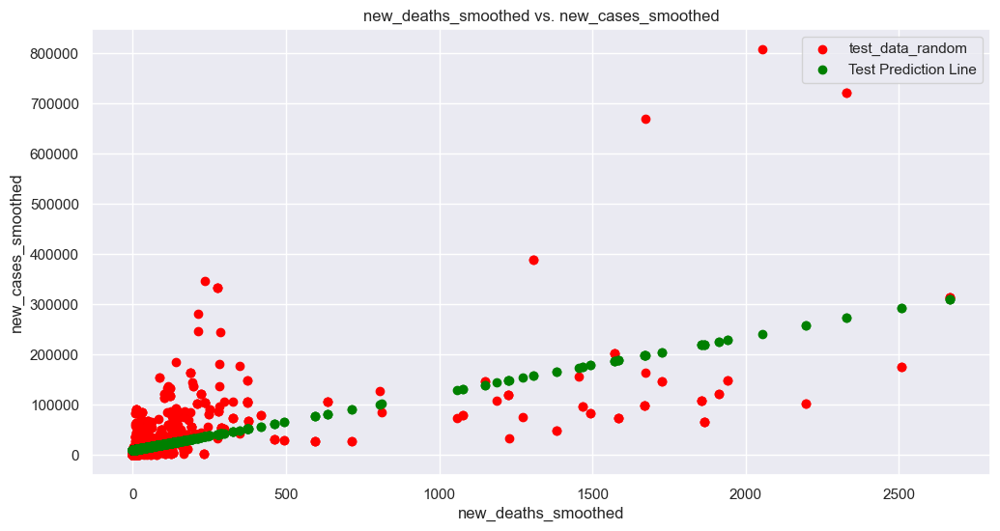

r2_test is 0.4294037840005719
for new_cases_smoothed against new_deaths_smoothed


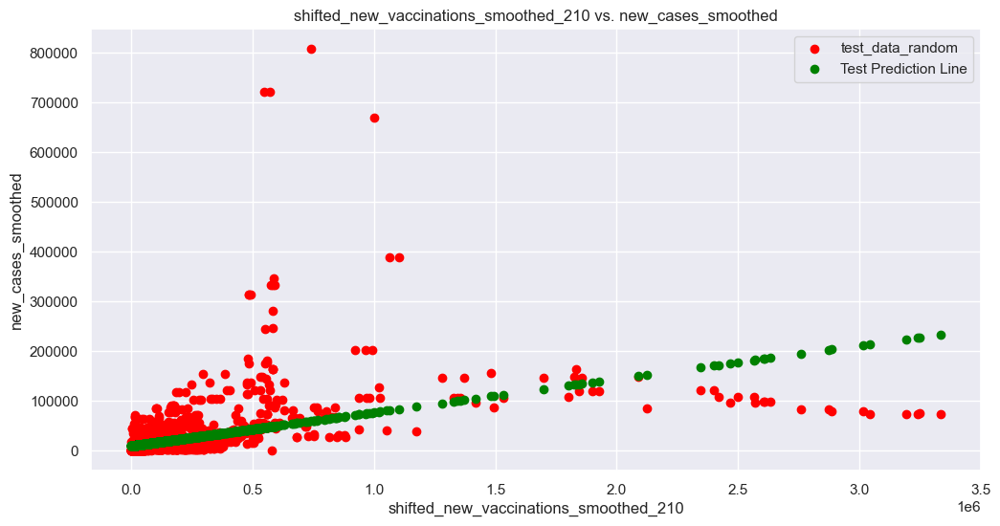

r2_test is 0.22312756615570173
for new_cases_smoothed against shifted_new_vaccinations_smoothed_210


,Variable,R-squared_test_random
0,hosp_patients,0.673854
1,icu_patients,0.459497
2,new_tests,0.433062
3,new_deaths_smoothed,0.429404
4,shifted_new_vaccinations_smoothed_210,0.223128


In [56]:
r2_test_random_lin_dict = {'Variable': [], 'R-squared_test_random': []}

for x_columns in test_data_random.columns:
    if x_columns != 'new_cases_smoothed':
        r2_test = RegressionPlot_Linear(test_data_random, x_columns, 'new_cases_smoothed', remove_outlier=False)
        print(f'for new_cases_smoothed against {x_columns}')
        r2_test_random_lin_dict['Variable'].append(x_columns)
        r2_test_random_lin_dict['R-squared_test_random'].append(r2_test)

# Create a DataFrame from the dictionary
r2_test_random_lin_df = pd.DataFrame(r2_test_random_lin_dict)
display(r2_test_random_lin_df)


`Train data` generally have higher R-squared values than `Test data`

## Comparison between R-squared value for `train` and `test` dataset `(Random)`

In [57]:
comparison_r2_dataset = pd.concat([r2_train_random_lin_df, r2_test_random_lin_df], axis = 1)
comparison_r2_dataset = comparison_r2_dataset.loc[:,~comparison_r2_dataset.columns.duplicated()]
comparison_r2_dataset

,Variable,R-squared_train_random,R-squared_test_random
0,hosp_patients,0.698057,0.673854
1,icu_patients,0.473917,0.459497
2,new_tests,0.451064,0.433062
3,new_deaths_smoothed,0.468924,0.429404
4,shifted_new_vaccinations_smoothed_210,0.198396,0.223128


# b) Multivariate linear regression

### Multivariate regression general plot function, predict accuracy between true and predicted response

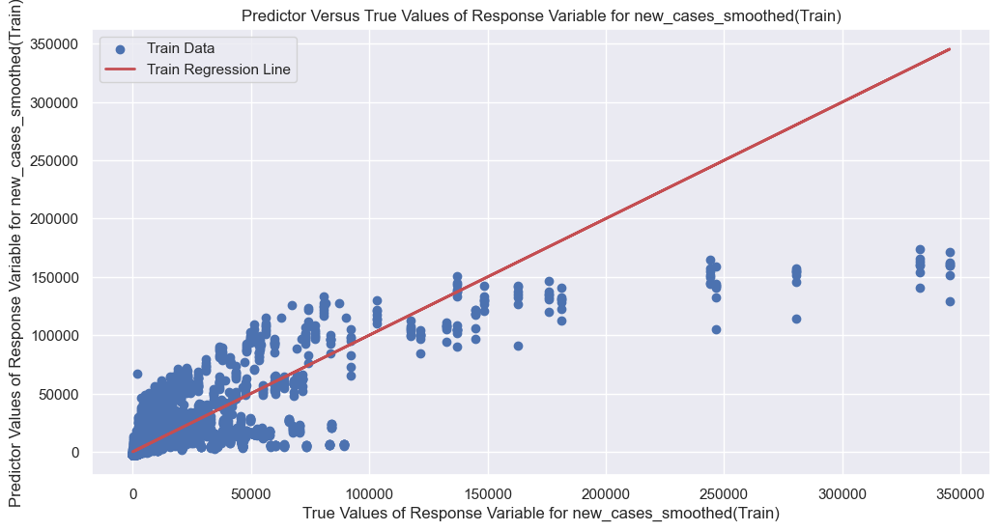

r2_train is 0.6361608969235368


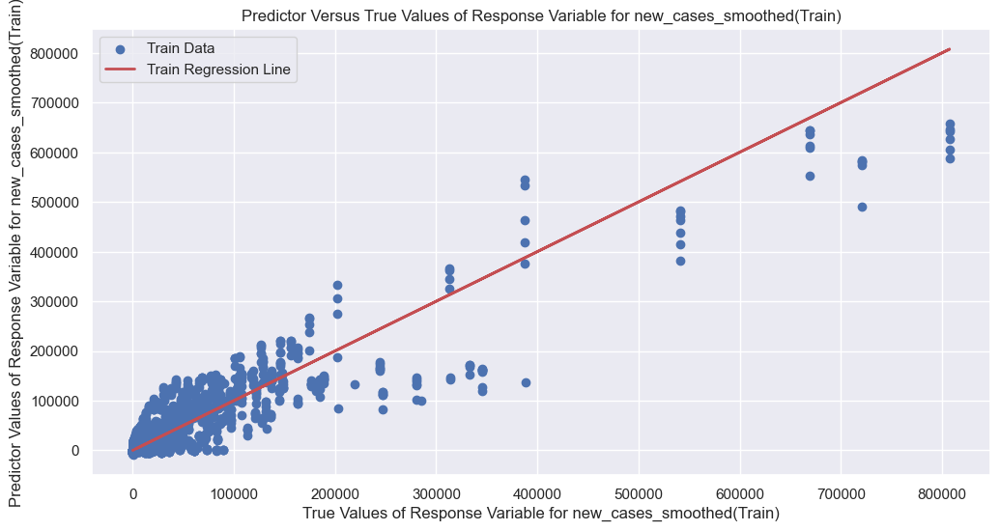

r2_train is 0.8253382833983465


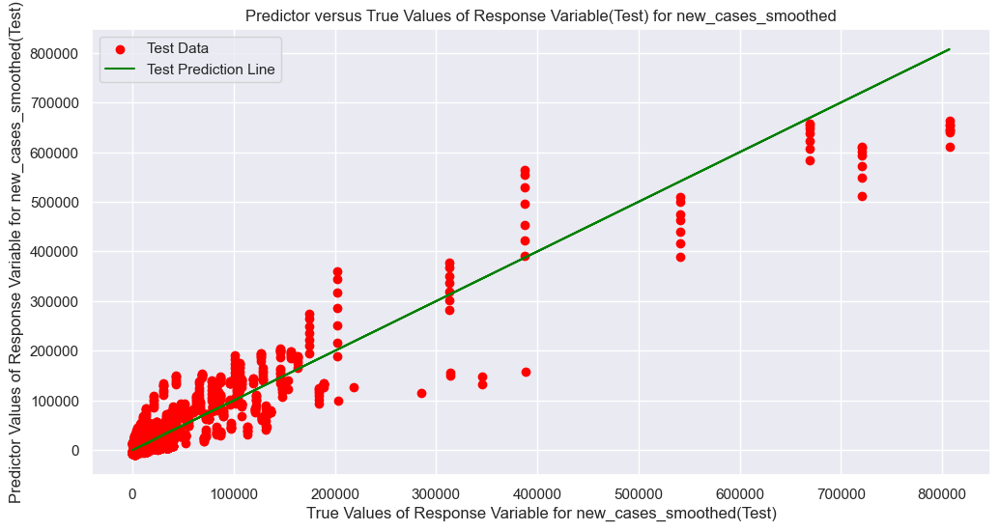

r2_test is 0.8849761730206813


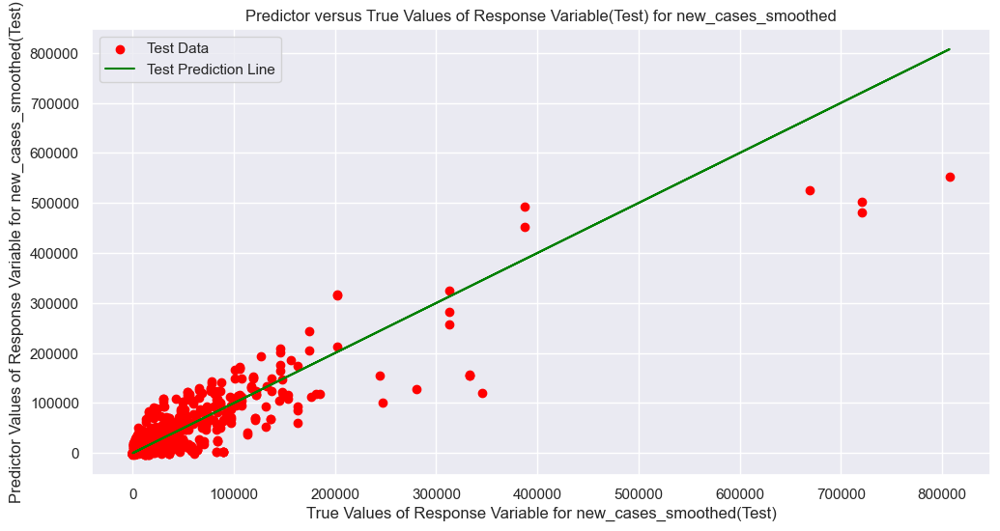

r2_test is 0.7873524408964709


In [58]:
def RegressionPlot_Multi(data, train_x, train_y, remove_outlier=False):
    # Create a copy of the DataFrame to avoid modifying the original
    data_copy = data.copy()
    
    # Remove outliers if specified
    if remove_outlier:
        Q1 = data_copy[train_x].quantile(0.25)
        Q3 = data_copy[train_x].quantile(0.75)
        IQR = Q3 - Q1
        data_copy = data_copy[(data_copy[train_x] >= Q1 - 1.5 * IQR) & (data_copy[train_x] <= Q3 + 1.5 * IQR)]
    
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(data_copy[train_x], data_copy[train_y])

    # Calculate R-squared value
    r_squared = model.score(data_copy[train_x], data_copy[train_y])

    # Calculate the regression line
    y_values = model.predict(data_copy[train_x])

    # Plot the data and regression line
    if data.equals(train_data_manual) or data.equals(train_data_random):
        plt.figure(figsize=(12, 6))
        plt.scatter(data_copy[train_y], y_values, label='Train Data') 
        plt.plot(data_copy[train_y], data_copy[train_y], 'r-', label='Train Regression Line', linewidth=2)
        plt.xlabel(f'True Values of Response Variable for {(train_y)}(Train)')
        plt.ylabel(f'Predictor Values of Response Variable for {(train_y)}(Train)')
        plt.title(f'Predictor Versus True Values of Response Variable for {(train_y)}(Train)')
        plt.legend()
        plt.show()
        print(f'r2_train is {r_squared}')
        return r_squared
        
    elif data.equals(test_data_manual) or data.equals(test_data_random):
        plt.figure(figsize=(12, 6))
        plt.scatter(data_copy[train_y], y_values, label='Test Data',color = 'red') 
        plt.plot(data_copy[train_y], data_copy[train_y],label='Test Prediction Line', color = 'green')
        plt.xlabel(f'True Values of Response Variable for {(train_y)}(Test)')
        plt.ylabel(f'Predictor Values of Response Variable for {(train_y)}(Test)')
        plt.title(f'Predictor versus True Values of Response Variable(Test) for {(train_y)}')
        plt.legend()
        plt.show()
        print(f'r2_test is {r_squared}')
        return r_squared

# Example usage
x_columns = ['hosp_patients', 'icu_patients', 'new_tests', 'new_deaths_smoothed', 'shifted_new_vaccinations_smoothed_210']
y_column = 'new_cases_smoothed'

# Plot the first subplot
RegressionPlot_Multi(train_data_manual, x_columns, y_column, remove_outlier=False)
RegressionPlot_Multi(train_data_random, x_columns, y_column, remove_outlier=False)
# Plot the second subplot
RegressionPlot_Multi(test_data_manual, x_columns, y_column, remove_outlier=False)
RegressionPlot_Multi(test_data_random, x_columns, y_column, remove_outlier=False)
plt.show()




### Multivariate regression value calculated general function with different dataset and input/ output variables

In [59]:
def multivariate_regression_linear(data, x_columns, y_columns):
    # Extract the input variables (X) and the target variables (y)
    X = data[x_columns]
    y = data[y_columns]
    
    # Fit the linear regression model
    model = LinearRegression()
    model.fit(X, y)
    
    # Calculate R-squared values
    r_squared = model.score(X, y)
    y_predict = model.predict(X)
    # Return the R-squared value
    return r_squared

data_names = ['train_data_manual', 'test_data_manual', 'train_data_random', 'test_data_random']
data = [train_data_manual, test_data_manual, train_data_random, test_data_random]
r_squared_list = []

# Define the column names for x and y variables
x_columns = ['hosp_patients', 'icu_patients', 'new_tests', 'new_deaths_smoothed', 'shifted_new_vaccinations_smoothed_210']
y_columns = ['new_cases_smoothed']

for name, dataset in zip(data_names, data):
    r_squared = multivariate_regression_linear(dataset, x_columns, y_columns)
    r_squared_list.append({'Dataset': name,'Output': y_columns,'R-squared': r_squared})

r_squared_df = pd.DataFrame(r_squared_list)
display(r_squared_df)

,Dataset,Output,R-squared
0,train_data_manual,[new_cases_smoothed],0.636161
1,test_data_manual,[new_cases_smoothed],0.884976
2,train_data_random,[new_cases_smoothed],0.825338
3,test_data_random,[new_cases_smoothed],0.787352


In [60]:
train_test_data_random_univariate_linear = r_squared_df[r_squared_df['Dataset'].isin(['train_data_random', 'test_data_random'])]
display(train_test_data_random_univariate_linear)
r_squared_multi_train_value = train_test_data_random_univariate_linear.iloc[0, train_test_data_random_univariate_linear.columns.get_loc('R-squared')]
r_squared_multi_test_value = train_test_data_random_univariate_linear.iloc[1, train_test_data_random_univariate_linear.columns.get_loc('R-squared')]
display(comparison_r2_dataset)

new_row = {'Variable': 'Multivariate', 'R-squared_train_random': r_squared_multi_train_value, 'R-squared_test_random': r_squared_multi_test_value}
comparison_r2_dataset = pd.concat([comparison_r2_dataset, pd.DataFrame([new_row])], ignore_index=True)
comparison_r2_dataset


,Dataset,Output,R-squared
2,train_data_random,[new_cases_smoothed],0.825338
3,test_data_random,[new_cases_smoothed],0.787352


,Variable,R-squared_train_random,R-squared_test_random
0,hosp_patients,0.698057,0.673854
1,icu_patients,0.473917,0.459497
2,new_tests,0.451064,0.433062
3,new_deaths_smoothed,0.468924,0.429404
4,shifted_new_vaccinations_smoothed_210,0.198396,0.223128


,Variable,R-squared_train_random,R-squared_test_random
0,hosp_patients,0.698057,0.673854
1,icu_patients,0.473917,0.459497
2,new_tests,0.451064,0.433062
3,new_deaths_smoothed,0.468924,0.429404
4,shifted_new_vaccinations_smoothed_210,0.198396,0.223128
5,Multivariate,0.825338,0.787352


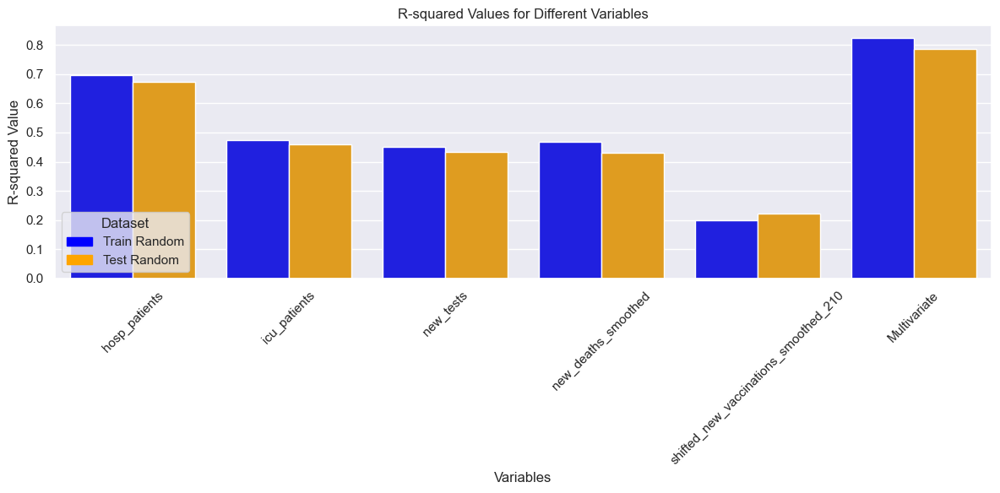

In [61]:
import matplotlib.patches as mpatches
plt.figure(figsize=(12, 6))
sb.barplot(x='Variable', y='value', hue='variable', 
           data=pd.melt(comparison_r2_dataset, id_vars=['Variable'], value_vars=['R-squared_train_random', 'R-squared_test_random']),
           palette=['blue', 'orange'])

plt.xlabel('Variables')
plt.ylabel('R-squared Value')
plt.title('R-squared Values for Different Variables')

blue_patch = mpatches.Patch(color='blue', label='Train Random')
orange_patch = mpatches.Patch(color='orange', label='Test Random')
plt.legend(handles=[blue_patch, orange_patch], title='Dataset', loc='lower left')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()



It is clearly shown that `multivariate` linear regression bring higher accuracy for response compared to `univariate`, and `train` dataset generally has higher R-squared value compared to `test` dataset.

## compare all the difference input and output for different data in multivariate regression

In [62]:
# Define the list of dataset names and the dataset objects
data_names = ['train_data_manual', 'test_data_manual', 'train_data_random', 'test_data_random']
data = [train_data_manual, test_data_manual, train_data_random, test_data_random]
output_columns = ['new_cases_smoothed','hosp_patients', 'icu_patients', 'new_tests', 'new_deaths_smoothed', 'shifted_new_vaccinations_smoothed_210']
r_squared_list = []

for name, dataset in zip(data_names, data):
    for output_column in output_columns:
        # Select the current output column and the remaining columns as input
        input_columns = [col for col in dataset.columns if col != output_column]
        
        # Perform multivariate regression
        r_squared = multivariate_regression_linear(dataset, input_columns, [output_column])
        r_squared_list.append({'Dataset': name, 'Output': output_column, 'R-squared': r_squared})

r_squared_df = pd.DataFrame(r_squared_list)

# Sort by the 'Output' column and then by the 'Dataset' column
r_squared_sort_df = r_squared_df.sort_values(by=['Output'])
display(r_squared_sort_df)

,Dataset,Output,R-squared
19,test_data_random,hosp_patients,0.963138
1,train_data_manual,hosp_patients,0.882218
13,train_data_random,hosp_patients,0.968888
7,test_data_manual,hosp_patients,0.984928
2,train_data_manual,icu_patients,0.816082
20,test_data_random,icu_patients,0.946414
14,train_data_random,icu_patients,0.949133
8,test_data_manual,icu_patients,0.974211
12,train_data_random,new_cases_smoothed,0.825338
0,train_data_manual,new_cases_smoothed,0.636161


## general highlight best r squared value dataset performed for each variable 

In [63]:
def highlight_best_r_squared(df):
    # Get unique outputs
    outputs = df['Output'].unique()
    # Iterate over each output
    for output in outputs:
        # Filter the DataFrame for the current output
        output_df = df[df['Output'] == output]
        
        # Find the row with the highest R-squared value
        best_row_index = output_df['R-squared'].idxmax()
        
        # Highlight the cell containing the highest R-squared value
        highlighted_output_df = output_df.style.apply(
            lambda x: ['background-color: yellow; font-weight: bold' if x.name == best_row_index else '' for i in x],
            axis=1)
        display(highlighted_output_df)

highlight_best_r_squared(r_squared_sort_df)

,Dataset,Output,R-squared
19,test_data_random,hosp_patients,0.963138
1,train_data_manual,hosp_patients,0.882218
13,train_data_random,hosp_patients,0.968888
7,test_data_manual,hosp_patients,0.984928


,Dataset,Output,R-squared
2,train_data_manual,icu_patients,0.816082
20,test_data_random,icu_patients,0.946414
14,train_data_random,icu_patients,0.949133
8,test_data_manual,icu_patients,0.974211


,Dataset,Output,R-squared
12,train_data_random,new_cases_smoothed,0.825338
0,train_data_manual,new_cases_smoothed,0.636161
6,test_data_manual,new_cases_smoothed,0.884976
18,test_data_random,new_cases_smoothed,0.787352


,Dataset,Output,R-squared
10,test_data_manual,new_deaths_smoothed,0.808862
22,test_data_random,new_deaths_smoothed,0.797364
4,train_data_manual,new_deaths_smoothed,0.712823
16,train_data_random,new_deaths_smoothed,0.823408


,Dataset,Output,R-squared
21,test_data_random,new_tests,0.672730
15,train_data_random,new_tests,0.644160
3,train_data_manual,new_tests,0.514019
9,test_data_manual,new_tests,0.710883


,Dataset,Output,R-squared
11,test_data_manual,shifted_new_vaccinations_smoothed_210,0.684078
5,train_data_manual,shifted_new_vaccinations_smoothed_210,0.531732
17,train_data_random,shifted_new_vaccinations_smoothed_210,0.599011
23,test_data_random,shifted_new_vaccinations_smoothed_210,0.668316


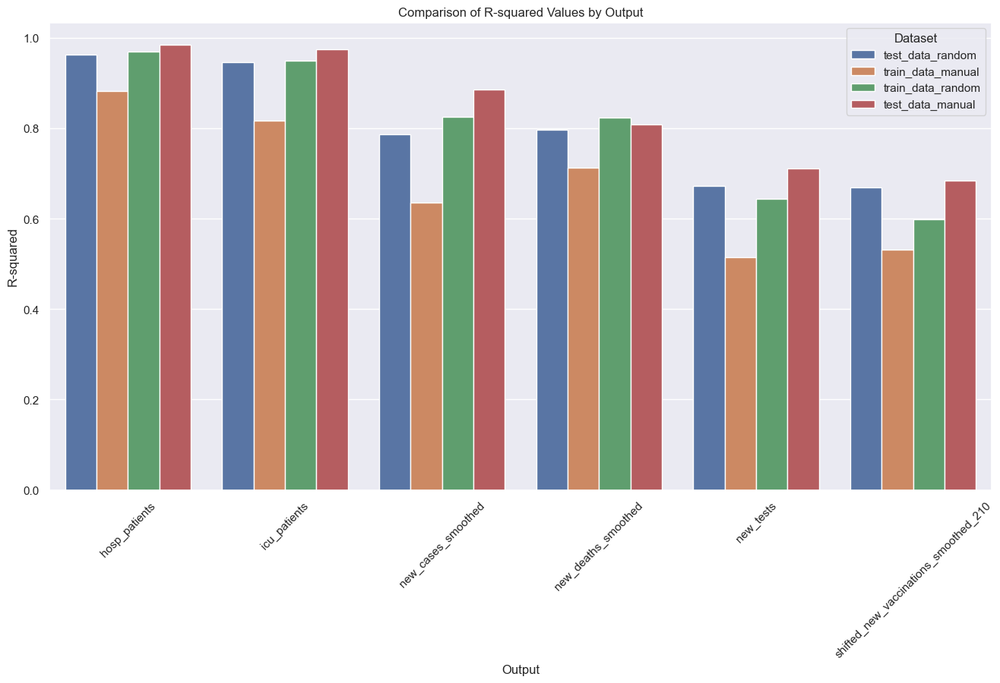

In [64]:
# Set the figure size
plt.figure(figsize=(16, 8))

# Plot the grouped bar chart
sb.barplot(x='Output', y='R-squared', hue='Dataset', data=r_squared_sort_df)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add labels and title
plt.xlabel('Output')
plt.ylabel('R-squared')
plt.title('Comparison of R-squared Values by Output')

# Show the plot
plt.legend(title='Dataset')
plt.show()


## general abstracted best r squared value dataset performed for each variable in table

In [65]:
def abstracted_best_r_squared(df):
    # Get unique outputs
    outputs = df['Output'].unique()
    
    # Initialize an empty list to store the best rows
    best_rows = []
    
    # Iterate over each output
    for output in outputs:
        # Filter the DataFrame for the current output
        output_df = df[df['Output'] == output]
        
        # Find the row with the highest R-squared value
        best_row = output_df.loc[output_df['R-squared'].idxmax()]
        
        # Append the best row to the list
        best_rows.append(best_row)
        abstracted_df = pd.DataFrame(best_rows)
        abstracted_df = abstracted_df.reset_index(drop = True)
    
    return abstracted_df




# Example usage
abstracted_df = abstracted_best_r_squared(r_squared_sort_df)
display(abstracted_df)

,Dataset,Output,R-squared
0,test_data_manual,hosp_patients,0.984928
1,test_data_manual,icu_patients,0.974211
2,test_data_manual,new_cases_smoothed,0.884976
3,train_data_random,new_deaths_smoothed,0.823408
4,test_data_manual,new_tests,0.710883
5,test_data_manual,shifted_new_vaccinations_smoothed_210,0.684078


**<span style="color:red">From the above table, it can be observed that among every output, test_data_manual actually performs the best. This can be attributed to more consistent data and lesser variance for the later 25% of the country, indicating that the variance for the front 75% is significant and cannot be neglected. Polynomial regression might be the way to solve these problems.</span>**


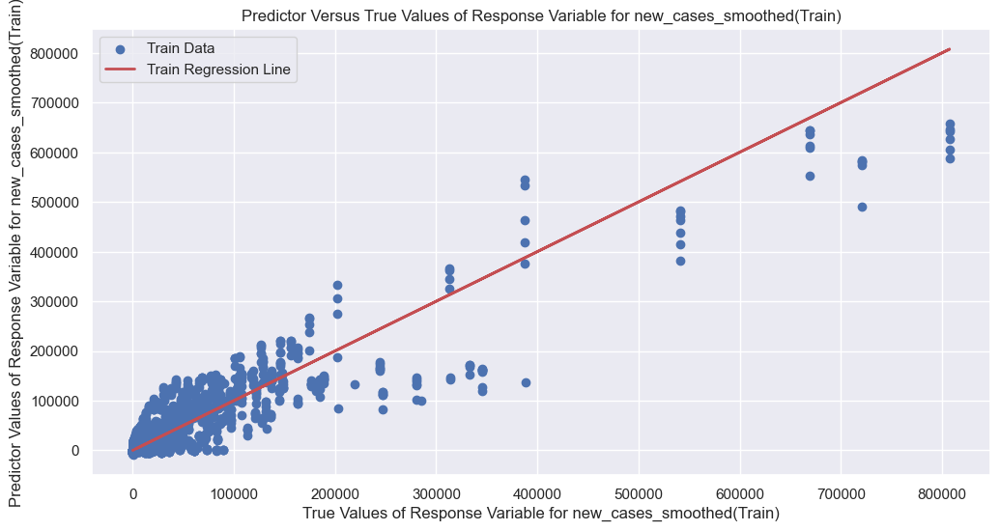

r2_train is 0.8253382833983465


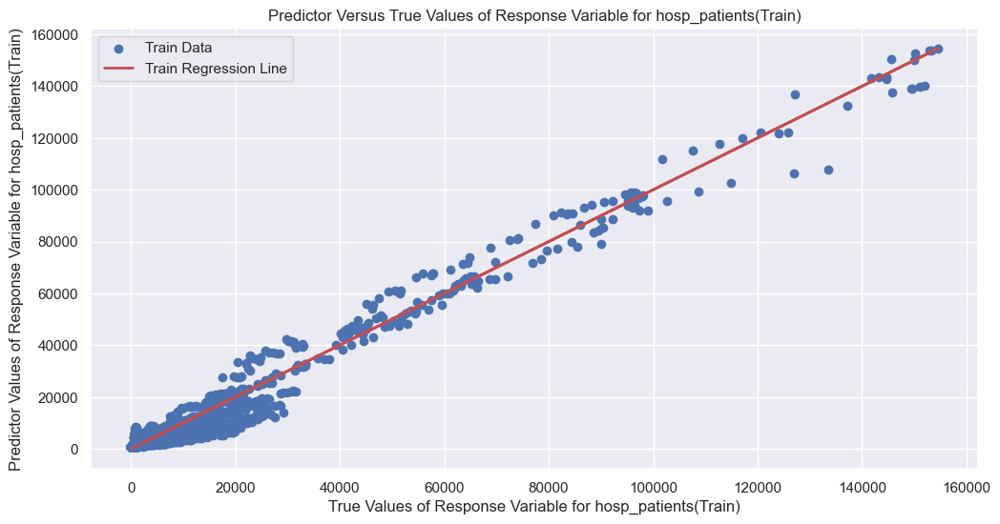

r2_train is 0.9688881583277796


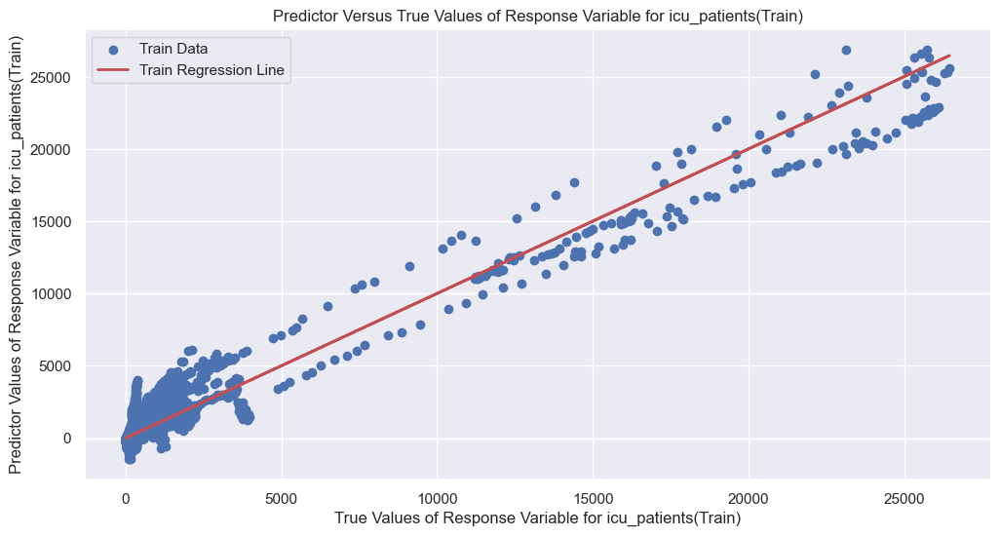

r2_train is 0.9491332691820542


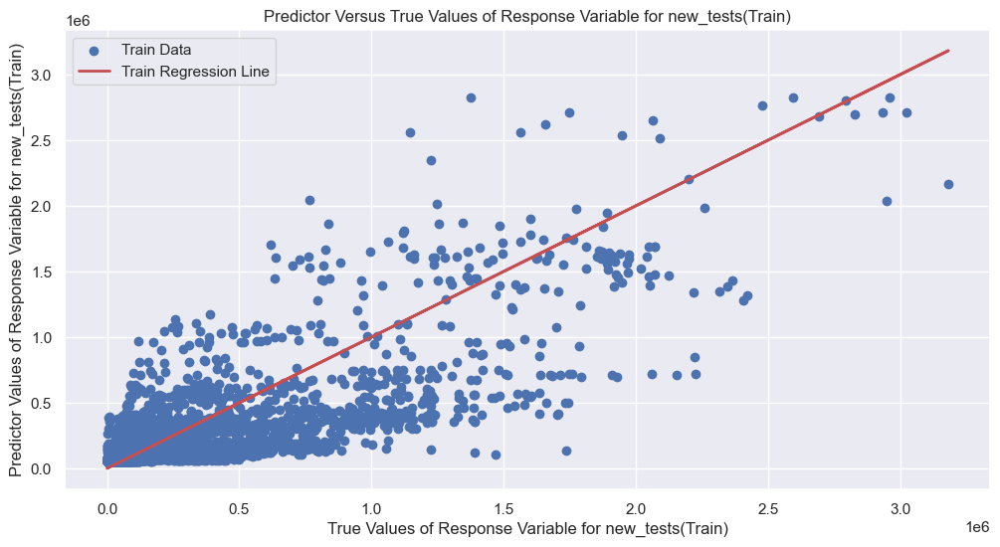

r2_train is 0.6441604502250932


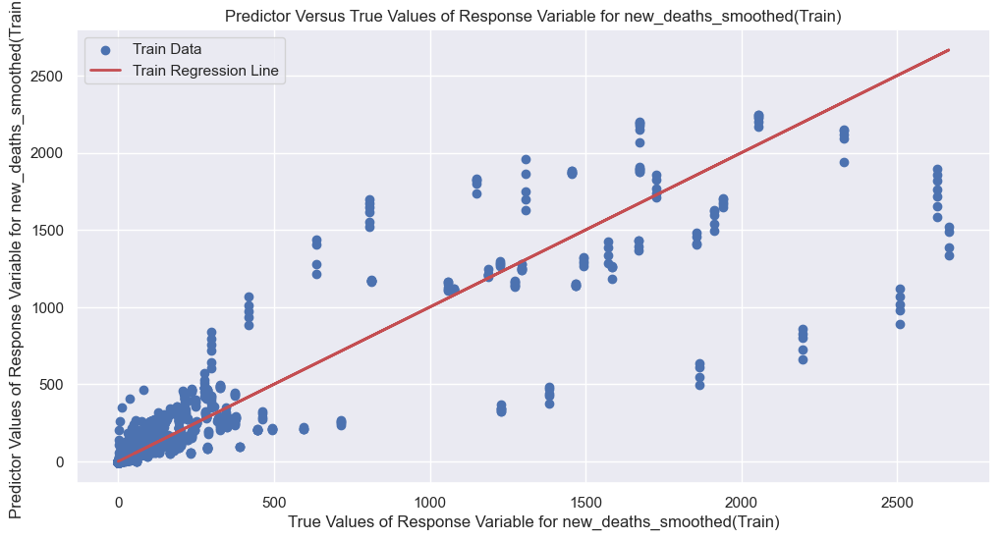

r2_train is 0.8234083012489632


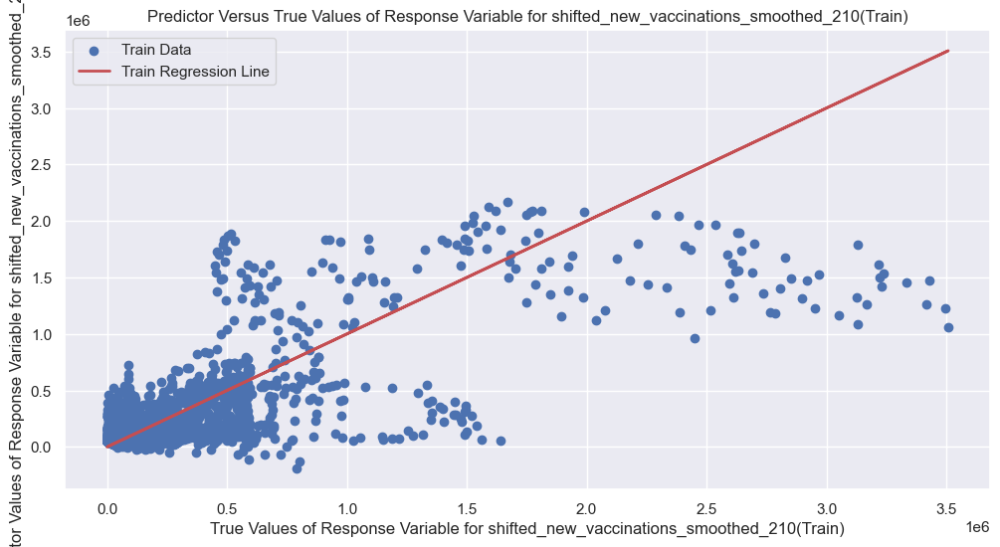

r2_train is 0.5990105734523637


,Column,R_squared_train_random_multi_linear
0,new_cases_smoothed,0.825338
1,hosp_patients,0.968888
2,icu_patients,0.949133
3,new_tests,0.644160
4,new_deaths_smoothed,0.823408
5,shifted_new_vaccinations_smoothed_210,0.599011


Column,new_cases_smoothed,hosp_patients,icu_patients,new_tests,new_deaths_smoothed,shifted_new_vaccinations_smoothed_210
R_squared_train_random_multi_linear,0.825338,0.968888,0.949133,0.64416,0.823408,0.599011


In [66]:
r_squared_values_train_multi = []
for y in output_columns:
    x = [col for col in output_columns if col != y]
    r_squared_train_multi = RegressionPlot_Multi(train_data_random, x, y, remove_outlier=False)
    r_squared_values_train_multi.append(r_squared_train_multi)

r_squared_values_train_multi_df = pd.DataFrame({'Column': output_columns, 'R_squared_train_random_multi_linear': r_squared_values_train_multi})
display(r_squared_values_train_multi_df)
# Convert columns to rows
# Transpose the DataFrame
r_squared_values_train_multi_df_transposed = r_squared_values_train_multi_df.set_index('Column').T

# Display the transposed DataFrame
display(r_squared_values_train_multi_df_transposed)



## Decision: Choosing the Training Data `random`

After comparing the performance between train_data_manual and train_data_random, we have decided to use train_data_random for our analysis. This decision is based on the observation that train_data_random for all variables shows higher R-squared values, indicating better accuracy, especially for the later 25% of the data. This suggests that train_data_random provides a fairer representation across all datasets, making it a more suitable choice for our analysis.

## Compare train data with test data random

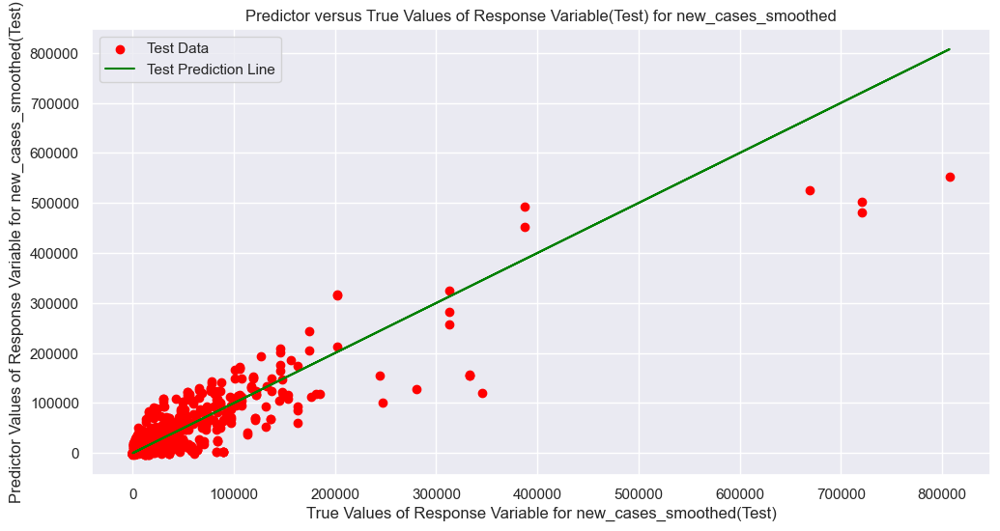

r2_test is 0.7873524408964709


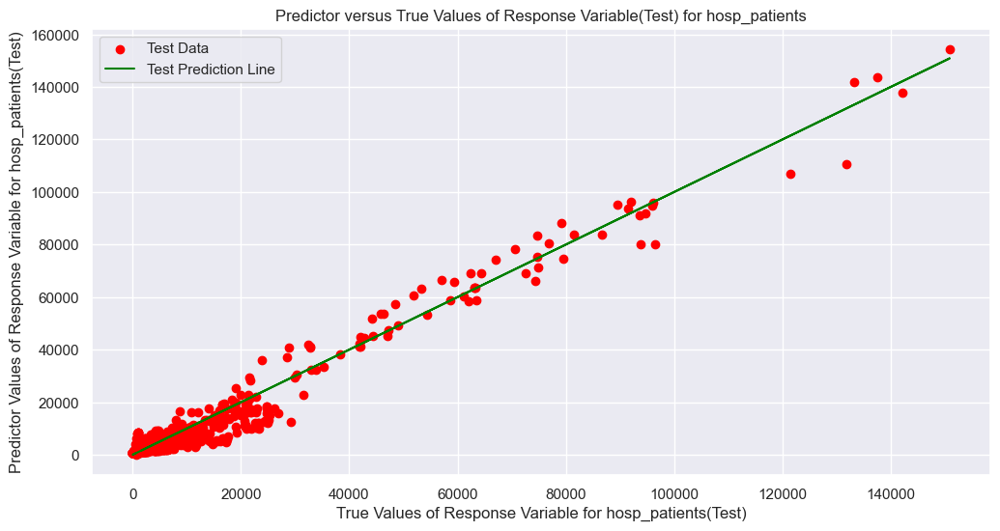

r2_test is 0.9631379643382773


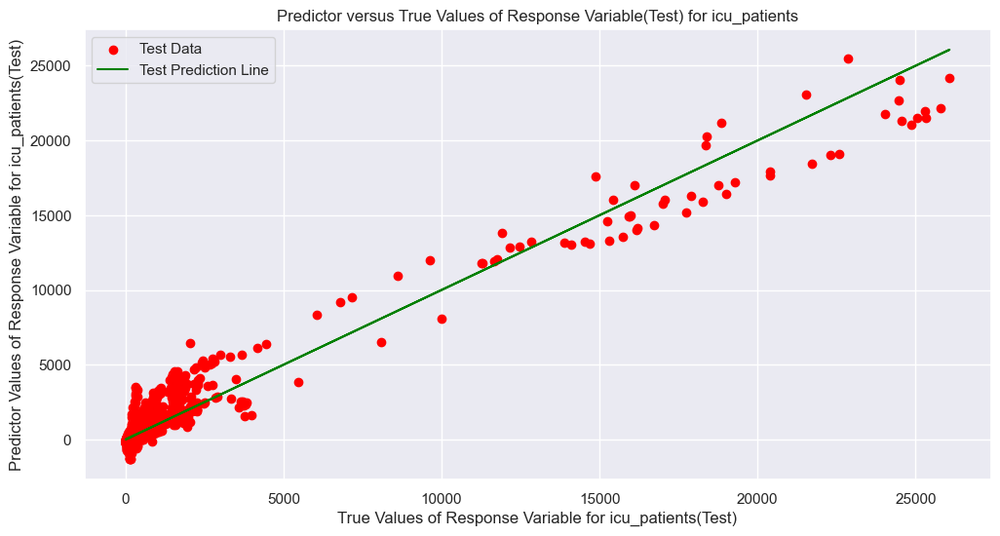

r2_test is 0.9464135099218463


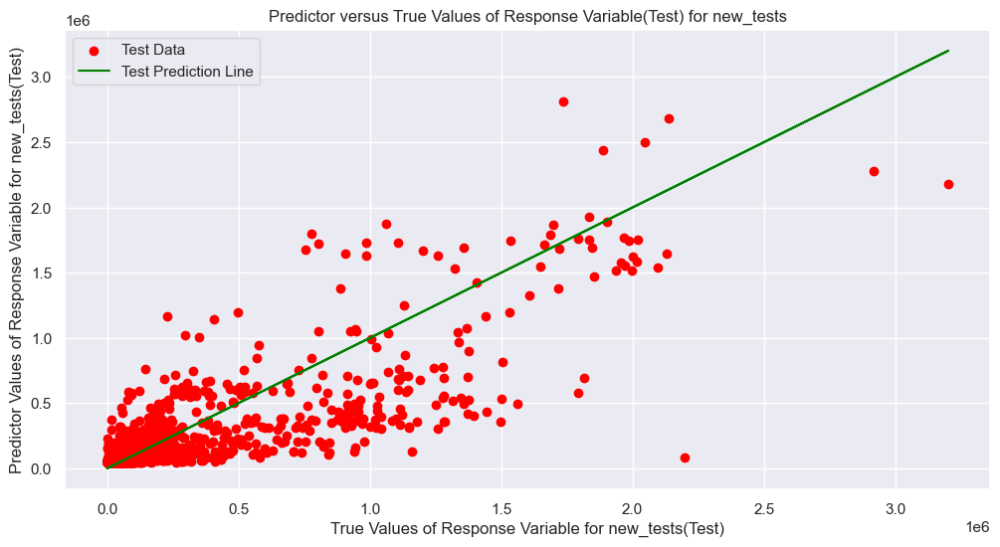

r2_test is 0.672729987952809


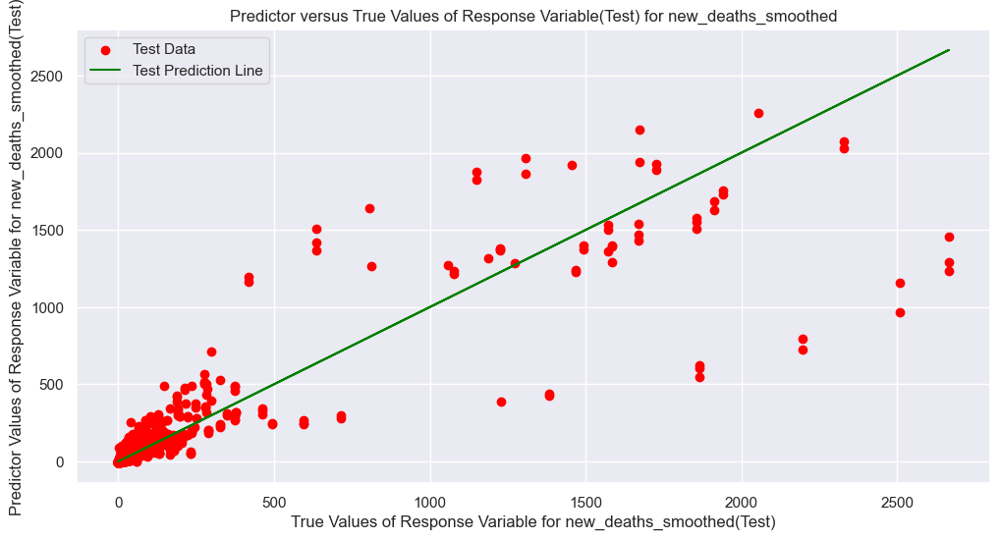

r2_test is 0.7973639810563475


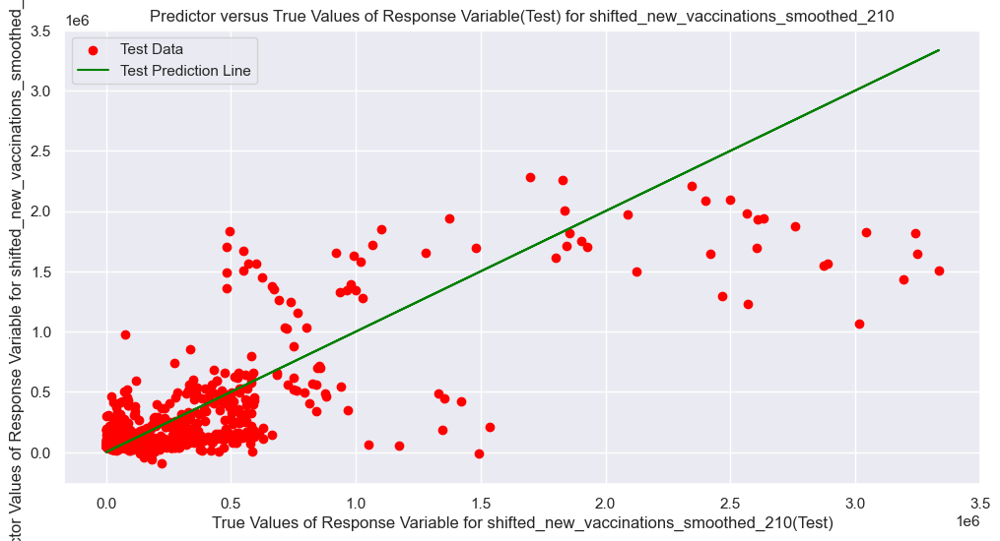

r2_test is 0.6683160677065834


,Variable,R_squared_test_random_multi_linear
0,new_cases_smoothed,0.787352
1,hosp_patients,0.963138
2,icu_patients,0.946414
3,new_tests,0.672730
4,new_deaths_smoothed,0.797364
5,shifted_new_vaccinations_smoothed_210,0.668316


Variable,new_cases_smoothed,hosp_patients,icu_patients,new_tests,new_deaths_smoothed,shifted_new_vaccinations_smoothed_210
R_squared_test_random_multi_linear,0.787352,0.963138,0.946414,0.67273,0.797364,0.668316


In [67]:
r_squared_values_test_multi = []
for y in output_columns:
    x = [col for col in output_columns if col != y]
    r_squared_test_multi = RegressionPlot_Multi(test_data_random, x, y, remove_outlier=False)
    r_squared_values_test_multi.append(r_squared_test_multi)

r_squared_values_test_multi_df = pd.DataFrame({'Variable': output_columns, 'R_squared_test_random_multi_linear': r_squared_values_test_multi})
display(r_squared_values_test_multi_df)
# Transpose the DataFrame
r_squared_values_test_multi_df_transposed = r_squared_values_test_multi_df.set_index('Variable').T

# Display the transposed DataFrame
display(r_squared_values_test_multi_df_transposed)

## Comparison of Train Data and Test Data R Squared Value

In [68]:
R_squared_multi = pd.concat([r_squared_values_train_multi_df_transposed, r_squared_values_test_multi_df_transposed],axis = 0)
display(R_squared_multi)

,new_cases_smoothed,hosp_patients,icu_patients,new_tests,new_deaths_smoothed,shifted_new_vaccinations_smoothed_210
R_squared_train_random_multi_linear,0.825338,0.968888,0.949133,0.64416,0.823408,0.599011
R_squared_test_random_multi_linear,0.787352,0.963138,0.946414,0.67273,0.797364,0.668316


The comparison between the train data and test data in random mode reveals that there is not much difference between them. This suggests that both datasets exhibit similar patterns and characteristics, which is important for ensuring the reliability and generalizability of our analysis.

# c) Univariate Polynomial Regression (Optimum Degree = 3)

## Define a general polynomial regeression function up to degree 5

In [69]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

def create_poly_model(data, x_column, y_column, degree):
    # Create polynomial features
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(data[x_column].values.reshape(-1, 1))
    
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X_poly, data[y_column])
    
    return poly_features, model

def RegressionPlot_Polynomial(data, x_column, y_column, degree=1, remove_outlier=False):
    # Remove outliers if specified
    if remove_outlier:
        Q1 = data[x_column].quantile(0.25)
        Q3 = data[x_column].quantile(0.75)
        IQR = Q3 - Q1
        data = data[(data[x_column] >= Q1 - 1.5 * IQR) & (data[x_column] <= Q3 + 1.5 * IQR)]
    
    # Create and fit the polynomial regression model
    poly_features, model = create_poly_model(data, x_column, y_column, degree)
    
    # Calculate R-squared value for the training set
    r2_train = model.score(poly_features.transform(data[x_column].values.reshape(-1, 1)), data[y_column])
    print(f'Train R-squared: {r2_train:.4f}')
    
    # Generate points for the regression line
    x_values = np.linspace(data[x_column].min(), data[x_column].max(), 100)
    x_poly_values = poly_features.transform(x_values.reshape(-1, 1))
    y_poly_values = model.predict(x_poly_values)

    # Plot the Polynomial Regression line
    if data.equals(train_data_manual) or data.equals(train_data_random):
        plt.figure(figsize=(12, 6))
        plt.scatter(data[x_column], data[y_column], label='Train Data') 
        plt.plot(x_values, y_poly_values, 'r-', label=f'Train Polynomial Regression (degree={degree})')
        plt.xlabel(x_column)
        plt.ylabel(y_column)
        plt.title(f'{x_column} vs. {y_column}')
        plt.legend()
        plt.show()

        return r2_train

    elif data.equals(test_data_manual) or data.equals(test_data_random):
        # Calculate R-squared value for the test set
        r2_test = model.score(poly_features.transform(data[x_column].values.reshape(-1, 1)), data[y_column])
        print(f'Test R-squared: {r2_test:.4f}')
        
        plt.figure(figsize=(12, 6))
        plt.scatter(data[x_column], data[y_column], label='Test Data', color='red') 
        plt.scatter(x_values, y_poly_values, color ='green', label=f'Test Polynomial Regression (degree={degree})')
        plt.xlabel(x_column)
        plt.ylabel(y_column)
        plt.title(f'{x_column} vs. {y_column}')
        plt.legend()
        plt.show()

        return r2_test


## Example

Train R-squared: 0.7190


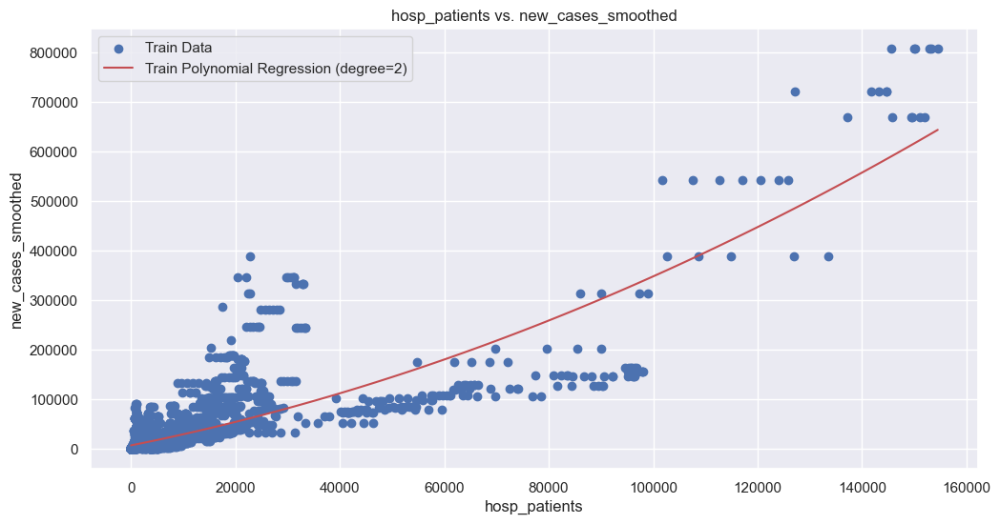

In [70]:
r2_test = RegressionPlot_Polynomial(train_data_random, 'hosp_patients', 'new_cases_smoothed', degree=2, remove_outlier=False)

## Explore all data and run with different polynomial degree regression ,see which one most suitable 

Train R-squared: 0.6981


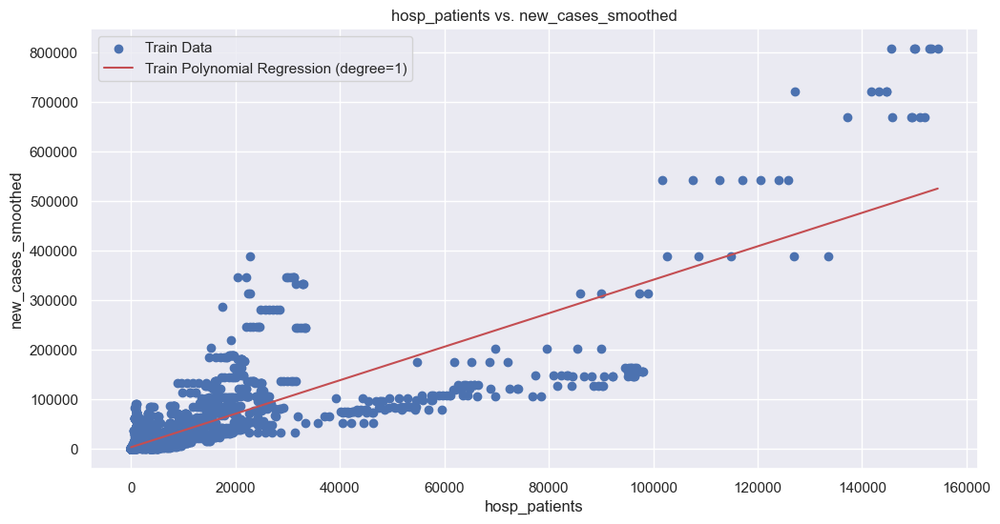

Train R-squared: 0.7190


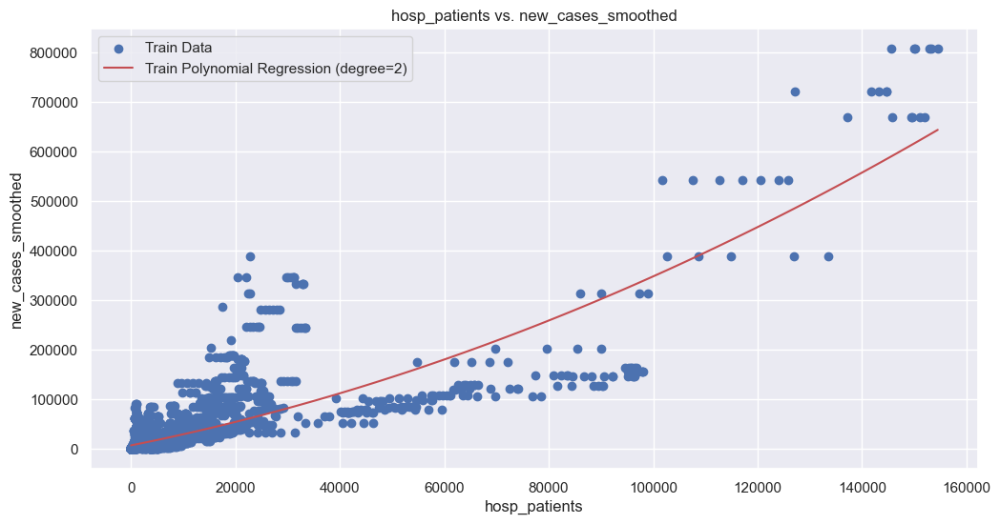

Train R-squared: 0.8009


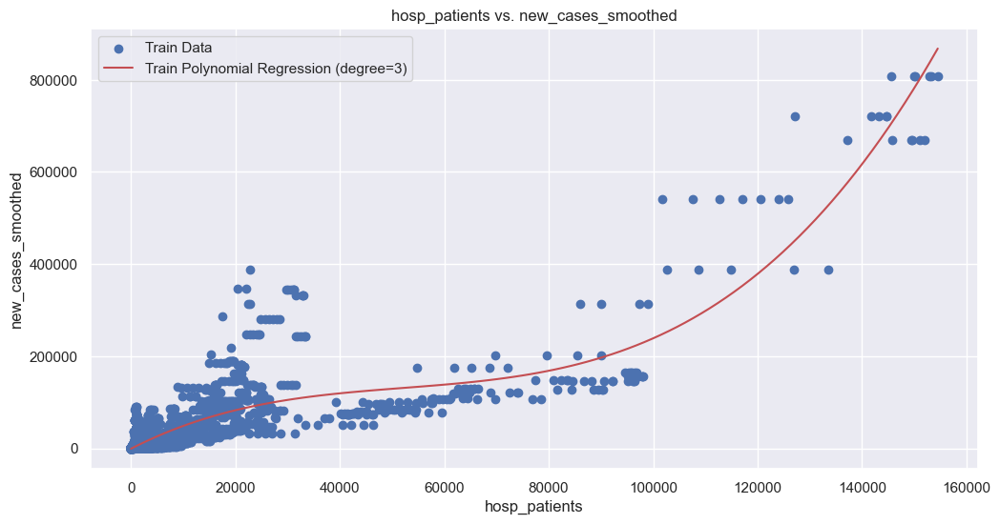

Train R-squared: 0.7320


In [ ]:
# Dictionary to store R-squared values for each variable and degree
r2_train_random_dict = {'Variable': [], 'Degree': [], 'R-squared_train_random': []}

for x_columns in train_data_manual.columns: 
    if x_columns != 'new_cases_smoothed':
        for degree in range(1, 6):  # Iterate over degrees 1 to 5
            r2 = RegressionPlot_Polynomial(train_data_random, x_columns, 'new_cases_smoothed', degree=degree, remove_outlier=False)
            r2_train_random_dict['Variable'].append(x_columns)
            r2_train_random_dict['Degree'].append(degree)
            r2_train_random_dict['R-squared_train_random'].append(r2)

# Create a DataFrame from the dictionary
r2_train_random_df = pd.DataFrame(r2_train_random_dict)


In [ ]:
display(r2_train_random_df)

### Abstract the highest R squared value for each variable and see the optimum degree

In [ ]:
# Calculate total accumulated R-squared for each variable
total_r2_train_random_df = r2_train_random_df.groupby('Variable')['R-squared_train_random'].sum().reset_index()

# Rename the 'R-squared' column to 'Total R-squared'
total_r2_train_random_df.rename(columns={'R-squared_train_random': 'Total R-squared'}, inplace=True)

# Find the degree with the highest accumulated R-squared for each variable
max_r2_train_random_df = r2_train_random_df.loc[r2_train_random_df.groupby('Variable')['R-squared_train_random'].idxmax()]

# Merge the two DataFrames on 'Variable'
result_train_random_df = pd.merge(max_r2_train_random_df, total_r2_train_random_df, on='Variable')

# Print the result DataFrame
result_train_random_df

## Degree of three is determined to be optimum degree!!!

In [ ]:
# Filter the DataFrame to keep only rows with Degree equal to 5
r2_train_random_df_optimized = r2_train_random_df[r2_train_random_df['Degree'] == 3]

# Display the filtered DataFrame
r2_train_random_df_optimized =r2_train_random_df_optimized.reset_index(drop=True)
r2_train_random_df_optimized

## Test Data Random

### Now test with test data and verify the accuracy itself,same process go through

In [ ]:
# Dictionary to store R-squared values for each variable and degree
r2_test_random_dict = {'Variable': [], 'Degree': [], 'R-squared_test_random': []}

for x_columns in test_data_random.columns: 
    if x_columns != 'new_cases_smoothed':
        for degree in range(1, 6):  # Iterate over degrees 1 to 5
            r2 = RegressionPlot_Polynomial(test_data_random, x_columns, 'new_cases_smoothed', degree=degree, remove_outlier=False)
            r2_test_random_dict['Variable'].append(x_columns)
            r2_test_random_dict['Degree'].append(degree)
            r2_test_random_dict['R-squared_test_random'].append(r2)

# Create a DataFrame from the dictionary
r2_test_random_df = pd.DataFrame(r2_test_random_dict)


In [ ]:
display(r2_test_random_df)

### Same degree of optimized!

In [ ]:
# Calculate total accumulated R-squared for each variable
total_r2_test_random_df = r2_test_random_df.groupby('Variable')['R-squared_test_random'].sum().reset_index()

# Rename the 'R-squared' column to 'Total R-squared'
total_r2_test_random_df.rename(columns={'R-squared_test_random': 'Total R-squared'}, inplace=True)

# Find the degree with the highest accumulated R-squared for each variable
max_r2_test_random_df = r2_test_random_df.loc[r2_test_random_df.groupby('Variable')['R-squared_test_random'].idxmax()]

# Merge the two DataFrames on 'Variable'
result_test_random_df = pd.merge(max_r2_test_random_df, total_r2_test_random_df, on='Variable')

# Print the result DataFrame
result_test_random_df

In [ ]:
# Filter the DataFrame to keep only rows with Degree equal to 5
r2_test_random_df_optimized = r2_test_random_df[r2_train_random_df['Degree'] == 3]

# Display the filtered DataFrame
r2_test_random_df_optimized =r2_test_random_df_optimized.reset_index(drop=True)
r2_test_random_df_optimized

# d) Multivariate Polynomial Regression (Optimum Degree: 2 or 4)

In [ ]:
def create_poly_model(data, x_column, y_column, degree):
    # Create polynomial features
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(data[x_column])
    
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X_poly, data[y_column])
    
    return poly_features, model
def RegressionPlot_Multi_Polynomial(data, x_column, y_column, degree=3, remove_outlier=False):
    # Remove outliers if specified
    if remove_outlier:
        Q1 = data[x_column].quantile(0.25)
        Q3 = data[x_column].quantile(0.75)
        IQR = Q3 - Q1
        data = data[(data[x_column] >= Q1 - 1.5 * IQR) & (data[x_column] <= Q3 + 1.5 * IQR)]
    
    # Create and fit the polynomial regression model
    poly_features, model = create_poly_model(data, x_column, y_column, degree)
    
    
    # Generate points for the regression line
    x_values = data[x_column]
    x_poly_values = poly_features.transform(x_values)
    y_poly_values = model.predict(x_poly_values)
    # Plot the Polynomial Regression line
    
    if data.equals(train_data_manual) or data.equals(train_data_random):
        
        # Calculate R-squared value 
        r2_train = model.score(poly_features.transform(data[x_column]), data[y_column])
        print(f'Train R-squared: {r2_train:.4f}')
        
        plt.figure(figsize=(12, 6))
        plt.scatter(data[y_column], y_poly_values, label='Train Data') 
        plt.plot(data[y_column],data[y_column], 'r-', label=f'Train Polynomial Regression (degree={degree})')
        plt.xlabel(f'True Values of Response Variable for {(y_column)}(Train)')
        plt.ylabel(f'Predictor Values of Response Variable for {(y_column)}(Train)')
        plt.title(f'Predictor versus True Values of Response Variable(Train) for {(y_column)}')
        plt.legend()
        plt.show()

        return r2_train

    elif data.equals(test_data_manual) or data.equals(test_data_random):
        # Calculate R-squared value for the test set
        r2_test = model.score(poly_features.transform(data[x_column]), data[y_column])
        print(f'Test R-squared: {r2_test:.4f}')
        
        plt.figure(figsize=(12, 6))
        plt.scatter(data[y_column], y_poly_values, label='Test Data', color='red') 
        plt.plot(data[y_column],data[y_column], 'g-', label=f'Test Polynomial Regression (degree={degree})')
        plt.xlabel(f'True Values of Response Variable for {(y_column)}(Test)')
        plt.ylabel(f'Predictor Values of Response Variable for {(y_column)}(Test)')
        plt.title(f'Predictor versus True Values of Response Variable(Test) for {(y_column)}')
        plt.legend()
        plt.show()

        return r2_test

## Example

In [ ]:
x_columns = ['hosp_patients', 'icu_patients', 'new_tests', 'new_deaths_smoothed', 'shifted_new_vaccinations_smoothed_210']
y_columns = ['new_cases_smoothed']
RegressionPlot_Multi_Polynomial(test_data_random, x_columns, y_columns, degree=3, remove_outlier=False)

# Determine the degree optimized for multivariate polynomial regression

In [ ]:
r_squared_values_train_multi_poly = []
for y in output_columns:
    for degree in range(1, 6):
        x = [col for col in output_columns if col != y]
        r_squared_train_multi_poly = RegressionPlot_Multi_Polynomial(train_data_random, x, y, degree=degree, remove_outlier=False)
        r_squared_values_train_multi_poly.append({'Output': y, 'Degree': degree, 'R_squared_random_train_multi_poly': r_squared_train_multi_poly})

r_squared_values_train_multi_poly_df = pd.DataFrame(r_squared_values_train_multi_poly)


In [ ]:
display(r_squared_values_train_multi_poly_df)

In [ ]:
r_squared_values_test_multi_poly = []
for y in output_columns:
    for degree in range(1, 6):
        ## General for all variable become input and output, counter check relationship
        x = [col for col in output_columns if col != y]
        r_squared_test_multi_poly = RegressionPlot_Multi_Polynomial(test_data_random, x, y, degree = degree, remove_outlier=False)
        r_squared_values_test_multi_poly.append(r_squared_test_multi_poly)

r_squared_values_test_multi_poly_df = pd.DataFrame({ 'R_squared_random_test_multi_poly': r_squared_values_test_multi_poly})
display(r_squared_values_test_multi_poly_df)

In [ ]:
combined_compare_df = pd.concat([r_squared_values_train_multi_poly_df,r_squared_values_test_multi_poly_df], axis = 1)
display(combined_compare_df)

In [ ]:
max_r_squared_values_train_multi_poly_df = combined_compare_df.loc[combined_compare_df.groupby('Output')['R_squared_random_train_multi_poly'].idxmax()]
max_r_squared_values_test_multi_poly_df = combined_compare_df.loc[combined_compare_df.groupby('Output')['R_squared_random_train_multi_poly'].idxmax()]
display(max_r_squared_values_train_multi_poly_df)
display(max_r_squared_values_test_multi_poly_df)

 **Optimize degree** for this `multivariate polynomial regression` change, become `4`, this is because `degree 3`, which previously thought was the best fit degree shows `negative R squared value` on `new_tests` as output,and at `degree 5` even higher `negative` value,  which means the `variability` of predicted value with actual value with odd number degree prediction is high.  

1. **Nonlinear Relationship**: The relationship between `new_tests` and the other variables may be more linear, making a polynomial regression less suitable for capturing this relationship effectively.

2. **Overfitting**: The degree of the polynomial may be too high, causing the model to fit the noise in the data rather than the underlying relationship, leading to a lower predictive performance for `new_tests`.

3. **Outliers or Influential Points**: The presence of outliers or influential points in the `new_tests` data could be affecting the model's ability to generalize well to new data points, resulting in a lower R-squared value.

4. **Sample Size**: The number of data points available for `new_tests` may be limited, which can lead to higher variability in the model's performance and a lower R-squared value.

5. **Feature Selection**: The selection of features (independent variables) for the model may not be optimal for predicting `new_tests`, potentially missing important variables that could improve the model's performance.


 ## Now let's see the comparison!

## Comparison between train data random and test data random for `Univariate` and `Multivariate` `Polynomial Regression`

### i. `Univariate Cubic Polynomial Regression`

In [ ]:
display(r2_train_random_df_optimized)
display(r2_test_random_df_optimized)

# Concatenate r2_test_random_df_optimized with train_random
comparison_df_final = pd.concat([r2_train_random_df_optimized, r2_test_random_df_optimized], join='inner' ,axis =0)
# Drop duplicate index values
comparison_df_final = comparison_df_final[~comparison_df_final.index.duplicated()]
comparison_df_final = pd.concat([comparison_df_final,r2_train_random_df_optimized['R-squared_train_random'],r2_test_random_df_optimized['R-squared_test_random']],axis = 1)
comparison_df_final =comparison_df_final.rename(columns={'R-squared_train_random': 'R-squared_train_random_uni_poly',
                                      'R-squared_test_random': 'R-squared_test_random_uni_poly'})

display(comparison_df_final)

### ii. `Multivariate Cubic Polynomial Regression`

In [ ]:
combined_compare_df_degree_4_optimized = combined_compare_df[combined_compare_df['Degree'] == 4]
combined_compare_df_degree_2_optimized = combined_compare_df[combined_compare_df['Degree'] == 2]
display(combined_compare_df_degree_4_optimized)
display(combined_compare_df_degree_2_optimized)

 **Interesting situation** happened. We abstract `4th degree` before as the optimum degree, because most of the variable predict well and the `train_test difference` for `r squared values` for most of the variables is small, meaning a `stable` dataset and conclusion can be made. Nonetheless, it seems that for `shifted_new_vaccintions_smoothed_210`, the `train_test diffrence` is too much at 4th degree , thus if we need to include that variable inside and consider a `constant degree regression for all variable at multivariate level`, we shall choose `2nd degree` as the best fit. However, in `future improvement`, each variable has their own `preferred relationship` with another variable, thus to optimize the regression r-squared value, we shall use `best degree for each input variable` depend on the output variable. It is officially proven that `2nd degree` and `4th degree polynomial regression`, in **different consideration**, is the `most optimum regression` for the prediction of chosen variables of this dataset under this model.

Based on above comparison, we can clearly see that **r_squared values** for each variables in `test data` are similiar with r-squared values in `train_data`, except for `shifted_new_vaccacinations_smoothed_210`, which we had explained the **reasons above**. However, technically most of the variable with different output variables in ·multivariate polynomial regression· still remain a relatively **stable r-square value** as the differences are not signififcant, **except for some extreme situation**.

## Comparison of `univariate` and `multivariate` polynomial regression

In [ ]:
new_combined_compare_df_degree_4_optimized = combined_compare_df_degree_4_optimized[combined_compare_df_degree_4_optimized['Output'] == 'new_cases_smoothed']
new_combined_compare_df_degree_2_optimized = combined_compare_df_degree_2_optimized[combined_compare_df_degree_2_optimized['Output'] == 'new_cases_smoothed']
new_combined_compare_df_degree = pd.concat([new_combined_compare_df_degree_2_optimized, new_combined_compare_df_degree_4_optimized], axis = 0)
new_combined_compare_df_degree_optimized = new_combined_compare_df_degree.rename(columns={
    'Output': 'Variable',
    'Degree': 'Degree',
    'R_squared_random_train_multi_poly': 'R-squared_train_random_uni_poly',
    'R_squared_random_test_multi_poly': 'R-squared_test_random_uni_poly'
})
new_combined_compare_df_degree_optimized['Variable'] = new_combined_compare_df_degree_optimized['Variable'].replace('new_cases_smoothed', 'multivariate')
display(new_combined_compare_df_degree_optimized)
comparison_uni_multi_poly = pd.concat([comparison_df_final, new_combined_compare_df_degree_optimized], axis = 0)
comparison_uni_multi_poly = comparison_uni_multi_poly.reset_index(drop=True)

display(comparison_uni_multi_poly)

## again, it is clearly seen that multivariate polynomial has a **better** R-squared score.

## Comparison of `linear` and `polynomial` polynomial regression

In [ ]:
comparison_uni_multi_poly = comparison_uni_multi_poly.drop(columns=['Degree'])
comparison_uni_multi_poly = comparison_uni_multi_poly.reset_index(drop=True)
comparison_r2_dataset = comparison_r2_dataset.reset_index(drop=True)
comparison_conclusive = pd.concat([comparison_r2_dataset, comparison_uni_multi_poly], axis=1, join='inner') 
comparison_conclusive = comparison_conclusive.loc[:, ~comparison_conclusive.columns.duplicated()]
comparison_conclusive = comparison_conclusive.rename(columns={
    'R-squared_train_random': 'R-squared_train_linear',
    'R-squared_test_random': 'R-squared_test_linear',
    'R-squared_train_random_uni_poly': 'R-squared_train_poly',
    'R-squared_test_random_uni_poly': 'R-squared_test_poly'
})

# Display the DataFrame after renaming
display(comparison_conclusive)


In [ ]:
# Data
variables = comparison_conclusive['Variable']
train_linear_values = comparison_conclusive['R-squared_train_linear']
test_linear_values = comparison_conclusive['R-squared_test_linear']
train_poly_values = comparison_conclusive['R-squared_train_poly']
test_poly_values = comparison_conclusive['R-squared_test_poly']
x = np.arange(len(variables))  # the label locations
width = 0.35  # the width of the bars

fig, axs = plt.subplots(2, 3, figsize=(60, 40))

# Plot each variable separately
for i, variable in enumerate(variables):
    row = i // 3
    col = i % 3
    axs[row, col].bar(['Train Linear', 'Test Linear', 'Train Poly', 'Test Poly'],
                      [train_linear_values[i], test_linear_values[i], train_poly_values[i], test_poly_values[i]],
                      color=['blue', 'orange', 'green', 'red'])
    axs[row, col].set_title(variable, fontsize=50)  # Set title fontsize
    axs[row, col].set_ylabel('R-squared',fontsize = 40)  # Set ylabel
    axs[row, col].tick_params(axis='both', which='major', labelsize= 40)

# Grouped bar comparison for all variables
fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(x - width/2, train_linear_values, width, label='Train Linear', color='blue')
ax.bar(x - width/2, test_linear_values, width, bottom=train_linear_values, label='Test Linear', color='orange')
ax.bar(x + width/2, train_poly_values, width, label='Train Poly', color='green')
ax.bar(x + width/2, test_poly_values, width, bottom=train_poly_values, label='Test Poly', color='red')
ax.set_xticks(x)
ax.set_xticklabels(variables, rotation=45)
ax.legend()
ax.set_ylabel('Sum R-squared')

plt.tight_layout()
plt.show()


## In conclusion, the above graph shows that overall predicted response represent by **red bar** for `multivariate polynomial regression`is the best predictor model, since its R-squared value is the **highest**

In [ ]:
def predict_output_with_turns(model, data, output_column, degree=2, **kwargs):
    X = data.drop(columns=[output_column])  # Use all columns except the output column as input (X)
    y = data[output_column]  # Output column as target (y)
    
    # Create polynomial features
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(X)

    model.fit(X_poly, y)  # Fit the model with the data
    
    # Predict the output column value based on the provided input values
    x_input = pd.DataFrame(kwargs, index=[0])
    x_input_poly = poly_features.transform(x_input)
    predicted_value = model.predict(x_input_poly)[0]
        
    return predicted_value

# Example usage
model = LinearRegression()  # Initialize the model
data = test_data_random
output_column = 'new_cases_smoothed' ## Change any among the six variables abstracted if want 
degree = 2

while True:
    try:
        kwargs = {col: float(input(f"Enter {col}: ")) for col in data.columns if col != output_column}

        # Criteria checks
        if kwargs['hosp_patients'] <= kwargs['icu_patients']:
            raise ValueError("Error: Hosp patients should be bigger than ICU patients.")
        if kwargs['new_tests'] <= kwargs['hosp_patients']:
            raise ValueError("Error: New tests should be bigger than Hosp patients.")
        if kwargs['new_deaths_smoothed'] >= kwargs['icu_patients']:
            raise ValueError("Error: New deaths smoothed should be smaller than ICU patients.")

        predicted_value = predict_output_with_turns(model, data, output_column, degree=degree, **kwargs)
        if predicted_value < 0:
            raise ValueError("Predicted value is negative. Input values are invalid.")
        print(f"Predicted {output_column}: {predicted_value}")

    except ValueError as e:
        print(f"Error: {e}. Resetting inputs.")
    reset = input("Do you want to enter new values? (yes/no): ")
    if reset.lower() != 'yes':
        break

### Above is the overall summary. Choose desired output and key in any input variables value and obtain the predicted output. More anaylsis would be done in report, about the rational of choosing these variables and motive.

## Conclusion

### Concise Solution

#### Objective
The objective is to understand the relationship between selected variables (`new_cases_smoothed` as output, `hosp_patients`, `icu_patients`, `new_tests`, `new_deaths_smoothed`, and `shifted_new_vaccinations_smoothed_210` as inputs) and their impact on the trend of new cases and deaths. 

#### Approach
1. **Correlation Analysis**: 
   - Analyze the correlation matrix to understand the linear relationship between variables.
2. **Visualization**:
   - Use scatter plots or line plots to depict trends and relationships between variables.
3. **Regression Analysis**:
   - Apply regression models to quantify the impact of input variables on `new_cases_smoothed` and `new_deaths_smoothed`.
4. **Interpretation**:
   - Interpret the results to draw meaningful conclusions about the factors influencing trends.
5. **Conclusion**:
   - Provide insights and recommendations based on the analysis to improve COVID-19 response strategies.


## Future Work

### Fatality and Infectiousness Analysis

#### Objective
The objective is to examine the relationship between fatality and infectiousness in the context of COVID-19.

#### Approach
1. **Data Collection**:
   - Gather data on fatality rates and infectiousness metrics from reliable sources.
2. **Correlation Analysis**:
   - Calculate correlation coefficients between fatality rates and infectiousness metrics to assess the strength and direction of their relationship.
3. **Visualization**:
   - Create visualizations such as scatter plots or line charts to illustrate the relationship between fatality and infectiousness.
4. **Regression Analysis**:
   - Apply regression models to quantify the impact of infectiousness on fatality rates and vice versa.
5. **Interpretation**:
   - Analyze the results to understand how changes in infectiousness affect fatality rates and vice versa.
6. **Recommendations**:
   - Provide recommendations for public health interventions based on the findings to mitigate the impact of COVID-19.


## Add ON

 Want to do a slider for each variable and immediately see response from predictor response curve, but fail to do so within time constraint.
Abstract peak day category range, see when is the outbreak of pandemic appear and for precaution of next similiar covid based virus pandemic

Analyze vaccination base on vaccination type

 Analyze socioeconomic and demographic factor with more detailed, and rapid change data collected so data analysis more accurate.

This dataset useful variables too less, a lot of unrapid changed variables that change yearly.